In [278]:
%reload_ext autoreload
%autoreload 2
import pandas as pd
import os
import torch
from torch.utils.data import ConcatDataset,Dataset, DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from analysis import Metrics, epoch_metrics, cap_distance, error_calc, calculate_snr
import numpy as np
import copy
import matplotlib.pyplot as plt
from scalers import inverse_minmax_norm, scaler_y_charge_mm_B0005, scaler_y_charge_mm_B0006, scaler_y_charge_mm_B0007, scaler_y_dis_mm_B0005, scaler_y_dis_mm_B0006, scaler_y_dis_mm_B0007, scaler_y_comb_mm_B0005, scaler_y_comb_mm_B0006, scaler_y_comb_mm_B0007, xData_comb_B0005, yData_comb_B0005, xData_comb_B0006, yData_comb_B0006, xData_comb_B0007, yData_comb_B0007, xData_B0005, yData_B0005, xData_B0006, yData_B0006, xData_B0007, yData_B0007, xData_dis_B0005, yData_dis_B0005, xData_dis_B0006, yData_dis_B0006, xData_dis_B0007, yData_dis_B0007
from scalers import inverse_standard_scaler, scaler_y_charge_std_B0005, scaler_y_charge_std_B0006, scaler_y_charge_std_B0007, scaler_y_dis_std_B0005, scaler_y_dis_std_B0006,scaler_y_dis_std_B0007,  scaler_y_comb_std_B0005, scaler_y_comb_std_B0006, scaler_y_comb_std_B0007, xData_std_B0005, yData_std_B0005, xData_std_B0006, yData_std_B0006, xData_std_B0007, yData_std_B0007, xData_dis_std_B0005, yData_dis_std_B0005, xData_dis_std_B0006, yData_dis_std_B0006, xData_dis_std_B0007, yData_dis_std_B0007, xData_comb_std_B0005, yData_comb_std_B0005, xData_comb_std_B0006, yData_comb_std_B0006, xData_comb_std_B0007, yData_comb_std_B0007


Load CSV Files into Pandas DataFrames and convert to numpy arrays.

df > numpy > tensor

In [279]:
def load_and_transform(file_path):
    """
    Loads a CSV file and transforms it into a PyTorch tensor.
    
    Parameters:
    file_path (str): Path to the CSV file.
    
    Returns:
    torch.Tensor: Data from the CSV file as a PyTorch tensor.
    """
    data = pd.read_csv(file_path, header=None).to_numpy()
    tensor = torch.tensor(data, dtype=torch.float32)
    return tensor


In [280]:
# Directory where the split data files are saved
data_dir = '3. Split data'

# List of file prefixes for each dataset
datasets = [
    'B0005_charge_mm', 'B0005_charge_std', 'B0005_charge_rob',
    'B0005_discharge_mm', 'B0005_discharge_std', 'B0005_discharge_rob',
    'B0005_combined_mm', 'B0005_combined_std', 'B0005_combined_rob',
    'B0006_charge_mm', 'B0006_charge_std', 'B0006_charge_rob',
    'B0006_discharge_mm', 'B0006_discharge_std', 'B0006_discharge_rob',
    'B0006_combined_mm', 'B0006_combined_std', 'B0006_combined_rob',
    'B0007_charge_mm', 'B0007_charge_std', 'B0007_charge_rob',
    'B0007_discharge_mm', 'B0007_discharge_std', 'B0007_discharge_rob',
    'B0007_combined_mm', 'B0007_combined_std', 'B0007_combined_rob',
    'B0018_charge_mm', 'B0018_charge_std', 'B0018_charge_rob',
    'B0018_discharge_mm', 'B0018_discharge_std', 'B0018_discharge_rob',
    'B0018_combined_mm', 'B0018_combined_std', 'B0018_combined_rob'
]

# Initialize dictionaries to hold tensors
X_train_tensors = {}
X_test_tensors = {}
y_train_tensors = {}
y_test_tensors = {}

# Load and transform each dataset
for dataset in datasets:
    X_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_train.csv'))
    X_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_test.csv'))
    y_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_train.csv'))
    y_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_test.csv'))

# Example: Accessing a specific dataset tensor
print(X_train_tensors['B0005_charge_mm'])
print(y_train_tensors['B0005_charge_mm'])


tensor([[0.8771, 0.8854, 0.8833,  ..., 0.4092, 0.4091, 0.4089],
        [0.0380, 0.0405, 0.0419,  ..., 0.7788, 0.7773, 0.7760],
        [0.0275, 0.0305, 0.0315,  ..., 0.8233, 0.8221, 0.8203],
        ...,
        [0.7889, 0.8215, 0.7884,  ..., 0.7330, 0.7331, 0.7332],
        [0.7900, 0.8226, 0.7895,  ..., 0.7506, 0.7508, 0.7508],
        [0.7934, 0.8261, 0.7931,  ..., 0.6882, 0.6881, 0.6882]])
tensor([[1.0000],
        [0.9821],
        [0.9629],
        [0.9627],
        [0.9616],
        [0.9634],
        [0.9625],
        [0.9460],
        [0.9443],
        [0.9440],
        [0.9440],
        [0.9257],
        [0.9249],
        [0.9244],
        [0.9053],
        [0.9044],
        [0.9053],
        [0.9061],
        [0.9056],
        [0.9834],
        [0.9841],
        [0.9643],
        [0.9460],
        [0.9449],
        [0.9457],
        [0.9254],
        [0.9267],
        [0.9253],
        [0.9056],
        [0.9079],
        [0.9918],
        [0.9547],
        [0.9357],
        

Data Preperation for Training

Create a Custom PyTorch Dataset and DataLoader.

Data Loader Class is used to loaddata in batches and shuffle the data.

Shuffling the data prevents overfitting, so the model doesn't learn the order of the training data, which could lead to overfitting. It also improves gradient descent, in which it can lead to more robust gradient estimates. 

Tensor is reshaped so that each input row of 1x30 is transformed to a matrix of 3x10

In [281]:
data_length = 10 # you'll need to update its value in "2. Data Preprocessing.ipynb"
class BatteryDataset(Dataset):
    def __init__(self, x_data, y_data, sequence_length=data_length):
        self.sequence_length = sequence_length                          # Added for LSTM only
        self.num_sequences = x_data.shape[0] - sequence_length + 1      # Added for LSTM only
        
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return self.num_sequences
    
    def __getitem__(self, idx):
        x = self.x_data[idx:idx + self.sequence_length].view(self.sequence_length, 3, data_length)       # [:idx + self.sequence_length] and [view(self.sequence_length,]
        y = self.y_data[idx:idx + self.sequence_length]                                         # Sequence of targets
        return x, y
    
class BatteryDataset_combined(Dataset):
    def __init__(self, x_data, y_data, sequence_length=10):             # Sequence_length=10
        self.sequence_length = sequence_length                          # Added for LSTM only
        self.num_sequences = x_data.shape[0] - sequence_length + 1      # Added for LSTM only
        
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return self.num_sequences
    
    def __getitem__(self, idx):
        x = self.x_data[idx:idx + self.sequence_length].view(self.sequence_length, 6, data_length)
        y = self.y_data[idx:idx + self.sequence_length]                 # Sequence of targets
        return x, y

Create Datasets

In [282]:
# Initialize dictionaries to hold dataset instances
train_datasets = {}
test_datasets = {}

# Instantiate BatteryDataset and BatteryDataset_combined for each dataset
for dataset in datasets:
    if 'combined' in dataset:
        train_datasets[dataset] = BatteryDataset_combined(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset_combined(X_test_tensors[dataset], y_test_tensors[dataset])
    else:
        train_datasets[dataset] = BatteryDataset(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset(X_test_tensors[dataset], y_test_tensors[dataset])

# Example: Accessing a specific dataset instance
print(train_datasets['B0005_charge_mm'])
print(test_datasets['B0005_charge_mm'])

Split Test Data into Testing and Validation Sets.

In [283]:
# # Function to split test data into test and validation sets
def split_test_data(test_dataset, scale=0.5):
    """
    Splits the test dataset into validation and test sets based on the provided scale,
    with the validation set being the first part of the dataset.

    Parameters:
    test_dataset (Dataset): The test dataset to be split.
    scale (float): The proportion of the test dataset to use for the test set.

    Returns:
    Dataset: The split validation dataset (first part).
    Dataset: The split test dataset (second part).
    """
    val_size = int(scale * len(test_dataset))
    test_size = len(test_dataset) - val_size
    
    # Split the dataset while preserving the order
    val_data = torch.utils.data.Subset(test_dataset, range(val_size))  # First part for validation
    test_data = torch.utils.data.Subset(test_dataset, range(val_size, len(test_dataset)))  # Second part for test
    
    return val_data, test_data

# Initialize dictionaries to hold test and validation datasets
test_val_datasets = {}

# Split test data into validation and test sets
for dataset in datasets:
    val_data, test_data = split_test_data(test_datasets[dataset])  # Order-preserving split, with validation first
    test_val_datasets[f'{dataset}_test'] = test_data
    test_val_datasets[f'{dataset}_val'] = val_data

# Example: Accessing a specific test and validation dataset
print(test_val_datasets['B0005_charge_mm_test'])
print(test_val_datasets['B0005_charge_mm_val'])



Create DataLoaders.

In [284]:
batch_size = 3
data_loaders = {}

for dataset in datasets:
    train_loader = DataLoader(train_datasets[dataset], batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_val_datasets[f'{dataset}_test'], batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(test_val_datasets[f'{dataset}_val'], batch_size=batch_size, shuffle=False)
    
    # Combine train, validation, and test datasets
    combined_dataset = ConcatDataset([train_datasets[dataset], test_val_datasets[f'{dataset}_val'], test_val_datasets[f'{dataset}_test']])
    
    # Create a DataLoader for the combined dataset
    final_test_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=False)
    
    data_loaders[f'{dataset}_train_loader'] = train_loader
    data_loaders[f'{dataset}_test_loader'] = test_loader
    data_loaders[f'{dataset}_final_test_loader'] = final_test_loader  # includes train, validation, and test data
    data_loaders[f'{dataset}_val_loader'] = val_loader

# Example: Accessing a specific data loader
print(data_loaders['B0005_charge_mm_train_loader'])
print(data_loaders['B0005_charge_mm_test_loader'])
print(data_loaders['B0005_charge_mm_val_loader'])
print(data_loaders['B0005_charge_mm_final_test_loader'])


Rename data loaders

In [285]:
# Charging Data Loaders
B0005_charge_mm_train_loader = data_loaders['B0005_charge_mm_train_loader']
B0005_charge_mm_test_loader = data_loaders['B0005_charge_mm_test_loader']
B0005_charge_mm_val_loader = data_loaders['B0005_charge_mm_val_loader']
B0005_charge_std_train_loader = data_loaders['B0005_charge_std_train_loader']
B0005_charge_std_test_loader = data_loaders['B0005_charge_std_test_loader']
B0005_charge_std_val_loader = data_loaders['B0005_charge_std_val_loader']
B0005_charge_rob_train_loader = data_loaders['B0005_charge_rob_train_loader']
B0005_charge_rob_test_loader = data_loaders['B0005_charge_rob_test_loader']
B0005_charge_rob_val_loader = data_loaders['B0005_charge_rob_val_loader']

B0006_charge_mm_train_loader = data_loaders['B0006_charge_mm_train_loader']
B0006_charge_mm_test_loader = data_loaders['B0006_charge_mm_test_loader']
B0006_charge_mm_val_loader = data_loaders['B0006_charge_mm_val_loader']
B0006_charge_std_train_loader = data_loaders['B0006_charge_std_train_loader']
B0006_charge_std_test_loader = data_loaders['B0006_charge_std_test_loader']
B0006_charge_std_val_loader = data_loaders['B0006_charge_std_val_loader']
B0006_charge_rob_train_loader = data_loaders['B0006_charge_rob_train_loader']
B0006_charge_rob_test_loader = data_loaders['B0006_charge_rob_test_loader']
B0006_charge_rob_val_loader = data_loaders['B0006_charge_rob_val_loader']

B0007_charge_mm_train_loader = data_loaders['B0007_charge_mm_train_loader']
B0007_charge_mm_test_loader = data_loaders['B0007_charge_mm_test_loader']
B0007_charge_mm_val_loader = data_loaders['B0007_charge_mm_val_loader']
B0007_charge_std_train_loader = data_loaders['B0007_charge_std_train_loader']
B0007_charge_std_test_loader = data_loaders['B0007_charge_std_test_loader']
B0007_charge_std_val_loader = data_loaders['B0007_charge_std_val_loader']
B0007_charge_rob_train_loader = data_loaders['B0007_charge_rob_train_loader']
B0007_charge_rob_test_loader = data_loaders['B0007_charge_rob_test_loader']
B0007_charge_rob_val_loader = data_loaders['B0007_charge_rob_val_loader']

B0018_charge_mm_train_loader = data_loaders['B0018_charge_mm_train_loader']
B0018_charge_mm_test_loader = data_loaders['B0018_charge_mm_test_loader']
B0018_charge_mm_val_loader = data_loaders['B0018_charge_mm_val_loader']
B0018_charge_std_train_loader = data_loaders['B0018_charge_std_train_loader']
B0018_charge_std_test_loader = data_loaders['B0018_charge_std_test_loader']
B0018_charge_std_val_loader = data_loaders['B0018_charge_std_val_loader']
B0018_charge_rob_train_loader = data_loaders['B0018_charge_rob_train_loader']
B0018_charge_rob_test_loader = data_loaders['B0018_charge_rob_test_loader']
B0018_charge_rob_val_loader = data_loaders['B0018_charge_rob_val_loader']

# Discharging Data Loaders
B0005_discharge_mm_train_loader = data_loaders['B0005_discharge_mm_train_loader']
B0005_discharge_mm_test_loader = data_loaders['B0005_discharge_mm_test_loader']
B0005_discharge_mm_val_loader = data_loaders['B0005_discharge_mm_val_loader']
B0005_discharge_std_train_loader = data_loaders['B0005_discharge_std_train_loader']
B0005_discharge_std_test_loader = data_loaders['B0005_discharge_std_test_loader']
B0005_discharge_std_val_loader = data_loaders['B0005_discharge_std_val_loader']
B0005_discharge_rob_train_loader = data_loaders['B0005_discharge_rob_train_loader']
B0005_discharge_rob_test_loader = data_loaders['B0005_discharge_rob_test_loader']
B0005_discharge_rob_val_loader = data_loaders['B0005_discharge_rob_val_loader']

B0006_discharge_mm_train_loader = data_loaders['B0006_discharge_mm_train_loader']
B0006_discharge_mm_test_loader = data_loaders['B0006_discharge_mm_test_loader']
B0006_discharge_mm_val_loader = data_loaders['B0006_discharge_mm_val_loader']
B0006_discharge_std_train_loader = data_loaders['B0006_discharge_std_train_loader']
B0006_discharge_std_test_loader = data_loaders['B0006_discharge_std_test_loader']
B0006_discharge_std_val_loader = data_loaders['B0006_discharge_std_val_loader']
B0006_discharge_rob_train_loader = data_loaders['B0006_discharge_rob_train_loader']
B0006_discharge_rob_test_loader = data_loaders['B0006_discharge_rob_test_loader']
B0006_discharge_rob_val_loader = data_loaders['B0006_discharge_rob_val_loader']

B0007_discharge_mm_train_loader = data_loaders['B0007_discharge_mm_train_loader']
B0007_discharge_mm_test_loader = data_loaders['B0007_discharge_mm_test_loader']
B0007_discharge_mm_val_loader = data_loaders['B0007_discharge_mm_val_loader']
B0007_discharge_std_train_loader = data_loaders['B0007_discharge_std_train_loader']
B0007_discharge_std_test_loader = data_loaders['B0007_discharge_std_test_loader']
B0007_discharge_std_val_loader = data_loaders['B0007_discharge_std_val_loader']
B0007_discharge_rob_train_loader = data_loaders['B0007_discharge_rob_train_loader']
B0007_discharge_rob_test_loader = data_loaders['B0007_discharge_rob_test_loader']
B0007_discharge_rob_val_loader = data_loaders['B0007_discharge_rob_val_loader']

B0018_discharge_mm_train_loader = data_loaders['B0018_discharge_mm_train_loader']
B0018_discharge_mm_test_loader = data_loaders['B0018_discharge_mm_test_loader']
B0018_discharge_mm_val_loader = data_loaders['B0018_discharge_mm_val_loader']
B0018_discharge_std_train_loader = data_loaders['B0018_discharge_std_train_loader']
B0018_discharge_std_test_loader = data_loaders['B0018_discharge_std_test_loader']
B0018_discharge_std_val_loader = data_loaders['B0018_discharge_std_val_loader']
B0018_discharge_rob_train_loader = data_loaders['B0018_discharge_rob_train_loader']
B0018_discharge_rob_test_loader = data_loaders['B0018_discharge_rob_test_loader']
B0018_discharge_rob_val_loader = data_loaders['B0018_discharge_rob_val_loader']

# Combined Charging and Discharging Data Loaders
B0005_combined_mm_train_loader = data_loaders['B0005_combined_mm_train_loader']
B0005_combined_mm_test_loader = data_loaders['B0005_combined_mm_test_loader']
B0005_combined_mm_val_loader = data_loaders['B0005_combined_mm_val_loader']
B0005_combined_std_train_loader = data_loaders['B0005_combined_std_train_loader']
B0005_combined_std_test_loader = data_loaders['B0005_combined_std_test_loader']
B0005_combined_std_val_loader = data_loaders['B0005_combined_std_val_loader']
B0005_combined_rob_train_loader = data_loaders['B0005_combined_rob_train_loader']
B0005_combined_rob_test_loader = data_loaders['B0005_combined_rob_test_loader']
B0005_combined_rob_val_loader = data_loaders['B0005_combined_rob_val_loader']

B0006_combined_mm_train_loader = data_loaders['B0006_combined_mm_train_loader']
B0006_combined_mm_test_loader = data_loaders['B0006_combined_mm_test_loader']
B0006_combined_mm_val_loader = data_loaders['B0006_combined_mm_val_loader']
B0006_combined_std_train_loader = data_loaders['B0006_combined_std_train_loader']
B0006_combined_std_test_loader = data_loaders['B0006_combined_std_test_loader']
B0006_combined_std_val_loader = data_loaders['B0006_combined_std_val_loader']
B0006_combined_rob_train_loader = data_loaders['B0006_combined_rob_train_loader']
B0006_combined_rob_test_loader = data_loaders['B0006_combined_rob_test_loader']
B0006_combined_rob_val_loader = data_loaders['B0006_combined_rob_val_loader']

B0007_combined_mm_train_loader = data_loaders['B0007_combined_mm_train_loader']
B0007_combined_mm_test_loader = data_loaders['B0007_combined_mm_test_loader']
B0007_combined_mm_val_loader = data_loaders['B0007_combined_mm_val_loader']
B0007_combined_std_train_loader = data_loaders['B0007_combined_std_train_loader']
B0007_combined_std_test_loader = data_loaders['B0007_combined_std_test_loader']
B0007_combined_std_val_loader = data_loaders['B0007_combined_std_val_loader']
B0007_combined_rob_train_loader = data_loaders['B0007_combined_rob_train_loader']
B0007_combined_rob_test_loader = data_loaders['B0007_combined_rob_test_loader']
B0007_combined_rob_val_loader = data_loaders['B0007_combined_rob_val_loader']

B0018_combined_mm_train_loader = data_loaders['B0018_combined_mm_train_loader']
B0018_combined_mm_test_loader = data_loaders['B0018_combined_mm_test_loader']
B0018_combined_mm_val_loader = data_loaders['B0018_combined_mm_val_loader']
B0018_combined_std_train_loader = data_loaders['B0018_combined_std_train_loader']
B0018_combined_std_test_loader = data_loaders['B0018_combined_std_test_loader']
B0018_combined_std_val_loader = data_loaders['B0018_combined_std_val_loader']
B0018_combined_rob_train_loader = data_loaders['B0018_combined_rob_train_loader']
B0018_combined_rob_test_loader = data_loaders['B0018_combined_rob_test_loader']
B0018_combined_rob_val_loader = data_loaders['B0018_combined_rob_val_loader']


Number of Batches and Samples

In [286]:
# Example: B0005 charge mm data
train_loader = B0005_charge_mm_train_loader
test_loader = B0005_charge_mm_test_loader
val_loader = B0005_charge_mm_val_loader

# Print the lengths of the datasets
print(f'Number of batches in B0005_charge_mm_train_loader: {len(train_loader)}')
print(f'Number of batches in B0005_charge_mm_test_loader: {len(test_loader)}')
print(f'Number of batches in B0005_charge_mm_val_loader: {len(val_loader)}')

# Print the number of samples in the datasets
print(f'Number of samples in B0005_charge_mm_train_loader: {len(train_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_test_loader: {len(test_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_val_loader: {len(val_loader.dataset)}')


Number of batches in B0005_charge_mm_train_loader: 36
Number of batches in B0005_charge_mm_test_loader: 7
Number of batches in B0005_charge_mm_val_loader: 7
Number of samples in B0005_charge_mm_train_loader: 108
Number of samples in B0005_charge_mm_test_loader: 21
Number of samples in B0005_charge_mm_val_loader: 21


Plot Losses and Metrics Functions

In [287]:
def plot_results(num_epochs, train_losses, val_losses, val_distances):
   epochs = range(1, num_epochs + 1)
   # Plotting all the losses
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, train_losses, label='Training Loss')
   plt.scatter(epochs, val_losses, label='Validation Loss', color='orange')
   plt.xlabel('Epochs')
   plt.ylabel('Loss')
   plt.legend()
   plt.title('Loss')
   plt.tight_layout()
   plt.show()
 
   # Plotting all the distances
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, val_distances, label='Validation Distance', color='green')
   plt.xlabel('Epochs')
   plt.ylabel('Distance')
   plt.legend()
   plt.title('Average Absolute Capacity Distance')
   plt.tight_layout()
   plt.show()
 
 
def plot_metrics(num_epochs, metrics):
    epochs = range(1, num_epochs + 1)
   
    # Create a figure with a 2x2 grid of subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
 
    for i, (metric, values) in enumerate(metrics.items()):
        axes[i].plot(epochs, values, label=metric)
        axes[i].set_xlabel('Epochs')
        axes[i].set_ylabel('Value')
        axes[i].set_title(f'{metric} over Epochs')
        axes[i].legend()
   
    plt.tight_layout()
    plt.show()

CNN Architecture

In [288]:
cnn_fc_output = 32
class ResNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResNetBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm1d(out_channels)
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm1d(out_channels)
 
    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = F.leaky_relu(out, negative_slope=0.01, inplace=True)
        out = self.conv2(out)
        out = self.bn2(out)
        out += identity
        out = F.leaky_relu(out, negative_slope=0.01, inplace=True)
        return out
   
class CustomCNN(nn.Module):
    # def __init__(self, input_shape=(3, 10)):
    def __init__(self, input_shape):

        super(CustomCNN, self).__init__()
        self.layer1 = nn.Conv1d(input_shape[0], 64, kernel_size=3, stride=1, padding=1)  # Reduced channels
        self.flatten = nn.Flatten()
        self._initialize_fc(input_shape)
       
    def _initialize_fc(self, input_shape):
        # Forward pass through conv layers to calculate the size of the flatten layer
        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_shape)
            dummy_output = self._forward_conv_layers(dummy_input)
            flattened_size = dummy_output.numel()
        self.feature_dim = flattened_size  # Save the feature dimension for the LSTM
        self.fc = nn.Linear(flattened_size, cnn_fc_output) # output of cnn  is 50
        self.norm = nn.LayerNorm(flattened_size)
    
 
    def _make_res_block(self, in_channels, out_channels, blocks):
        layers = []
        for _ in range(blocks):
            layers.append(ResNetBlock(in_channels, out_channels))
        return nn.Sequential(*layers)
 
    def _forward_conv_layers(self, x):
        x = F.leaky_relu(self.layer1(x))


        return x
 
    def extract_features(self, x):
        x = self._forward_conv_layers(x)
        x = self.flatten(x)
        x = self.norm(x)

        return x
 
    def forward(self, x):
        features = self.extract_features(x)
        output = self.fc(features)
        # output = self.fc2(output)
        return output
 
 
 

CNNLSTM Architecture.

In [289]:
class CNN_LSTM(nn.Module):
    def __init__(self, input_shape, input_dim, hidden_dim, output_dim, num_layers=1, dropout=0.5):
        super(CNN_LSTM, self).__init__()
        self.cnn = CustomCNN(input_shape)
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        # LSTM layer with dropout
        self.lstm = nn.LSTM(cnn_fc_output, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        # 64 is the output of cnn fully connected layer - can be adjusted

        # Fully connected layer to output the final prediction
        self.fc = nn.Linear(hidden_dim, output_dim)
        
        # Layer normalization for CNN output
        self.layer_norm_cnn = nn.LayerNorm(cnn_fc_output)  # size of output of cnn and input of lstm 
        
        # Layer normalization for LSTM output
        self.layer_norm_lstm = nn.LayerNorm(hidden_dim)  # Adjust to hidden_dim size
        
        # Dropout for regularization
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, x):
        device = x.device
        batch_size, seq_len, channels, width = x.size()
        cnn_out = []
        for i in range(seq_len):
            out = self.cnn(x[:, i, :, :].to(device))
            out = self.layer_norm_cnn(out)
            cnn_out.append(out)
        r_in = torch.stack(cnn_out, dim=1)  # Reshape for LSTM input
        x = r_in.view(batch_size, seq_len, -1)
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        lstm_out, _ = self.lstm(r_in, (h0, c0))
        
        # Apply layer normalization to LSTM output
        lstm_out = self.layer_norm_lstm(lstm_out)
        
        # Flatten for the fully connected layer
        lstm_out = lstm_out.contiguous().view(-1, self.hidden_dim)
        
        # Fully connected layer to generate output
        fc_out = self.fc(lstm_out)
        
        # Reshape back to (batch_size, seq_len, output_dim)
        out = fc_out.view(batch_size, seq_len, -1)
        
        return out
def CNNLSTM(input_shape):
    # seq_len = 10
    input_dim = input_shape[0] * input_shape[1]  # Combine the input channels and width for LSTM input dimension
    hidden_dim = 128  # Number of features in hidden state
    output_dim = 1  # Assuming we want a single output per time step
    model = CNN_LSTM(input_shape, input_dim, hidden_dim, output_dim)
    return model

Training Function

Instantiate the model, define the loss and the optimizer.

In [292]:
def train(val_loader, train_loader, model):
    # Define the loss function and optimizer
    criterion = nn.MSELoss()  # Mean Square Error for regression tasks.
    # criterion = nn.L1Loss() # Mean Square Error for regression tasks.

    optimizer = optim.Adam(model.parameters(), lr=0.0011)  # ADAM optimizer.
    # optimizer = optim.SGD(model.parameters(), lr= 0.001)
    patience = 15  # if the model stopped learning, it will wait on it for 15 more epochs
    best_loss = float('inf')
    
    # Learning rate scheduler that reduces the learning rate when a metric has stopped improving
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=15)
    
    device = 'cpu'  # Set device to CPU
    
    # Initialize lists to store training and validation losses, distances, and accuracies
    num_epochs = 120  # Number of epochs to train.
    train_losses = []
    val_losses = []
    val_distances = []
    accuracies = []
    metrics_history = {'MAE': [], 'MSE': [], 'RMSE': [], 'R-squared': [], 'SNR': []}
    
    for epoch in range(num_epochs):
        model.train()  # Set the model to training mode.
        running_loss = 0.0  # Initialize running loss for the epoch
        
        # Training Loop
        for x_batch, y_batch in train_loader:  # Iterate over batches in the training loader
            x_batch = x_batch.to(device)  # Move inputs to device
            y_batch = y_batch.to(device)  # Move targets to device
            optimizer.zero_grad()  # Zero the parameter gradients
            
            outputs = model(x_batch)  # Forward pass
            loss = criterion(outputs, y_batch)  # Compute the loss
            loss.backward()  # Backward pass to compute gradients
            optimizer.step()  # Update the model parameters
            
            running_loss += loss.item()  # Accumulate the running loss

        train_loss = running_loss / len(train_loader)  # Calculate average training loss
        train_losses.append(train_loss)  # Append training loss to list

        # Validation Loop
        model.eval()  # Set the model to evaluation mode
        validation_loss = 0.0  # Initialize validation loss
        total_distance = 0.0  # Initialize total distance
        counter = 0.0  # Initialize counter for accuracy calculation
        Error = 0.0  # Initialize custom error metric
        metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0, 'SNR': 0.0, 'count': 0}
        
        with torch.no_grad():  # Disable gradient calculation
            for x_val, y_val in val_loader:  # Iterate over batches in the validation loader
                x_val = x_val.to(device)  # Move inputs to device
                y_val = y_val.to(device)  # Move targets to device
                
                result = model(x_val)  # Forward pass
                loss_val = criterion(result, y_val)  # Compute validation loss
                
                validation_loss += loss_val.item()  # Accumulate validation loss
                d, c = cap_distance(result[:, -1, :], y_val[:, -1, :])  # Compute distance and count within tolerance
                Error += error_calc(result[:, -1, :], y_val[:, -1, :])  # Accumulate custom error metric
                total_distance += d.item()  # Accumulate total distance
                counter += c  # Accumulate count within tolerance
                Metrics(metrics, result[:, -1, :], y_val[:, -1, :])  # Accumulate other metrics

        avg_val_loss = validation_loss / len(val_loader)  # Calculate average validation loss
        avg_val_distance = total_distance / len(val_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(val_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(val_loader)  # Average the custom error metric
        val_losses.append(avg_val_loss)  # Append validation loss to list
        val_distances.append(avg_val_distance)  # Append validation distance to list
        accuracies.append(accuracy)  # Append accuracy to list

        # Calculate SNR for the epoch
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - result).cpu().numpy())
        metrics['SNR'] += snr * len(val_loader)
        metrics['count'] += len(val_loader)
        metrics_history['SNR'].append(snr)
        
        # Step the learning rate scheduler
        scheduler.step(avg_val_loss)
        
        # Print epoch statistics
        print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}\n"
              f"Validation Distance: {avg_val_distance:.4f}, Validation Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")
           
        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
        # Early stopping and saving the best model
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            no_improvement_counter = 0
        else:
            no_improvement_counter += 1
            if no_improvement_counter >= patience:
                print("Early stopping triggered")
                num_epochs = epoch + 1
                break

    # Load the best model weights
    model.load_state_dict(best_model_wts)
    plot_results(num_epochs,train_losses,val_losses,val_distances)
    # plot_metrics(num_epochs,metrics_history)
    return model, train_losses ,val_losses ,val_distances,metrics_history
 

Testing function.

In [293]:
def test(model, test_loader):
    # Testing Loop
    device = 'cpu'
    model.to(device)
    model.eval()
    criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
    
    # Initialize validation loss and other metrics
    validation_loss = 0.0  # Initialize validation loss
    total_distance = 0.0  # Initialize total distance
    counter = 0.0  # Initialize counter for accuracy calculation
    Error = 0.0  # Initialize custom error metric
    metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0, 'SNR': 0.0, 'count': 0}
    
    y_testresult = []
    y_target = []
    
    with torch.no_grad():
        test_loss = 0
        for x_batch, y_batch in test_loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)
            
            y_target.append(y_batch[:, -1, :])  # to plot
            result = model(x_batch)  # Forward pass
            y_testresult.append(result[:, -1, :])  # to plot
            loss = criterion(result, y_batch)
            test_loss += loss.item()
            
            d, c = cap_distance(result[:, -1, :], y_batch[:, -1, :])  # Compute distance and count within tolerance
            Error += error_calc(result[:, -1, :], y_batch[:, -1, :])  # Accumulate custom error metric
            total_distance += d.item()  # Accumulate total distance
            counter += c  # Accumulate count within tolerance
            Metrics(metrics, result[:, -1, :], y_batch[:, -1, :])  # Accumulate other metrics

        avg_test_loss = test_loss / len(test_loader)  # Calculate average validation loss
        avg_test_distance = total_distance / len(test_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(test_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(test_loader)  # Average the custom error metric
        
        # Calculate SNR for the testing phase
        y_val = torch.cat(y_target, dim=0)
        y_result = torch.cat(y_testresult, dim=0)
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - y_result).cpu().numpy())
        metrics['SNR'] = snr
        
        # Print test statistics
        print(f"Test Loss: {avg_test_loss:.4f}, Test Distance: {avg_test_distance:.4f}, Test Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")

        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
    
    return y_target, y_testresult


To flatten test results

In [294]:
def flatten_and_concatenate(nested_tensors):
    """
    Flattens and concatenates a list of nested tensors into a single tensor.

    Parameters:
    nested_tensors (list of torch.Tensor): A list of tensors to be flattened and concatenated.

    Returns:
    torch.Tensor: A single tensor containing all the values from the nested tensors, flattened and concatenated.
    """
    flattened_tensors = [t.flatten() for t in nested_tensors]
    concatenated_tensor = torch.cat(flattened_tensors)
    return concatenated_tensor

Plot results

In [295]:
def plot_tensors(tensor1, tensor2, labels=["Tensor 1", "Tensor 2"], title="Tensor Comparison Plot", file_name="", ylabel="Value", save_dir=None):
    """
    Plots two given tensors for comparison and saves the plot as a PDF if a save directory is provided.
    
    Parameters:
    tensor1 (torch.Tensor): The first tensor to plot.
    tensor2 (torch.Tensor): The second tensor to plot.
    labels (list of str): The labels for the tensors. Default is ["Tensor 1", "Tensor 2"].
    title (str): The title of the plot. Default is "Tensor Comparison Plot".
    ylabel (str): The label for the y-axis. Default is "Value".
    save_dir (str): Directory to save the plot as a PDF. Default is None (does not save).
    """
    # Convert the tensors to NumPy arrays
    tensor1_np = tensor1.numpy()
    tensor2_np = tensor2.numpy()

    # Create a figure and axis with a specified size
    fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the width and height as needed

    # Plot the tensors
    ax.plot(tensor1_np, label=labels[0], linewidth=2.5)
    ax.plot(tensor2_np, label=labels[1], linewidth=2.5, color='#A52A2A')

    # Set the title and labels with the specified font sizes
    ax.set_title(title, fontsize=28)
    ax.set_xlabel("Cycle", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)

    # Add a legend
    ax.legend(fontsize=20)  # Adjust the legend font size if needed
    ax.grid(True, linestyle='--', which='both', axis='both', color='gray', alpha=0.5)
    
    # Set x-axis limits from 0 to the length of the tensor
    ax.set_xlim(0, len(tensor1_np))
    
    # Set the font size for the x and y axis datapoints
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Save the plot as a PDF file if a save directory is provided
    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        plt.savefig(os.path.join(save_dir, f"{file_name}.pdf"), format='pdf')
    
    # Show the plot
    plt.show()

Plot SOH

In [296]:
def plot_soh(target, predicted, title="State of Health Estimation",file_name=""):
    """
    Plots the State of Health (SOH) for both the target and predicted capacities and saves the plot as a PDF in the "SOH Plots" directory.

    Parameters:
    target (np.ndarray): The target capacity values.
    predicted (np.ndarray): The predicted capacity values.
    title (str): The title of the plot. Default is "State of Health Estimation".
    """
    # Ensure the arrays are 1-dimensional
    target = target.flatten()
    predicted = predicted.flatten()

    # Calculate SOH
    C = target[0]  # max capacity
    soh_target = (target / C) * 100
    soh_predicted = (predicted / C) * 100

    # Convert SOH values to tensors
    soh_target_tensor = torch.tensor(soh_target)
    soh_predicted_tensor = torch.tensor(soh_predicted)
    
    # Plot using the plot_tensors function with "SOH (%)" as the y-axis label, saving to "SOH Plots"
    plot_tensors(soh_target_tensor, soh_predicted_tensor, labels=["SOH Target", "SOH Predicted"], title=title, file_name=file_name, ylabel="SOH (%)", save_dir="14. CNN-LSTM SOH Plots")




Input Shapes

In [297]:
def get_input_shape(task_type):
    return (6, data_length) if task_type == 'combined' else (3, data_length)

input_shape_single = get_input_shape('single')
input_shape_combined = get_input_shape('combined')

Define a folder to save the models in the directory.

In [298]:
# Define the folder name where the model will be saved
folder_name = "5. CNN-LSTM Models"

# Create the folder if it doesn't already exist
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

Model 1 - B0005 - MinMax Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2609, Validation Loss: 0.2291
Validation Distance: 0.5037, Validation Accuracy: 0.0000, SNR: -14.5591
##Metrics##:
MAE : 0.37777453660964966
MSE : 0.1911688596010208
RMSE : 0.6146712899208069
R-squared : -4923.5126953125
Count: 28
Epoch 2/120, Training Loss: 0.0303, Validation Loss: 0.0927
Validation Distance: 0.3359, Validation Accuracy: 0.0000, SNR: -11.0107
##Metrics##:
MAE : 0.25195005536079407
MSE : 0.08547254651784897
RMSE : 0.502010703086853
R-squared : -2237.623291015625
Count: 28
Epoch 3/120, Training Loss: 0.0223, Validation Loss: 0.1191
Validation Distance: 0.3720, Validation Accuracy: 0.0000, SNR: -11.9757
##Metrics##:
MAE : 0.27896758913993835
MSE : 0.10458290576934814
RMSE : 0.5282330513000488
R-squared : -2739.172119140625
Count: 28
Epoch 4/120, Training Loss: 0.0180, Validation Loss: 0.0481
Validation Distance: 0.2362, Validation Accuracy: 0.0000, SNR: -8.5996
##Metrics##:
MAE : 0.1771535575389862
MSE : 0.042721379548311234
RMSE : 0.4210701

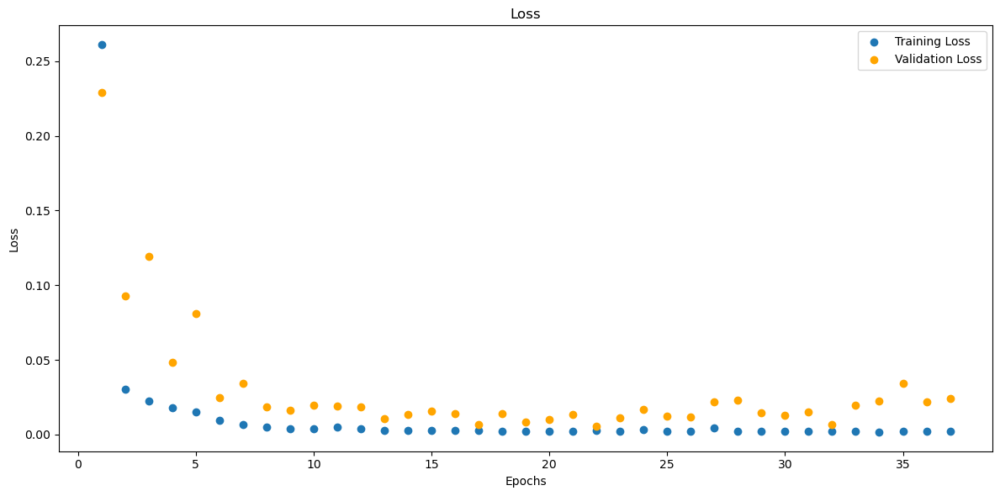

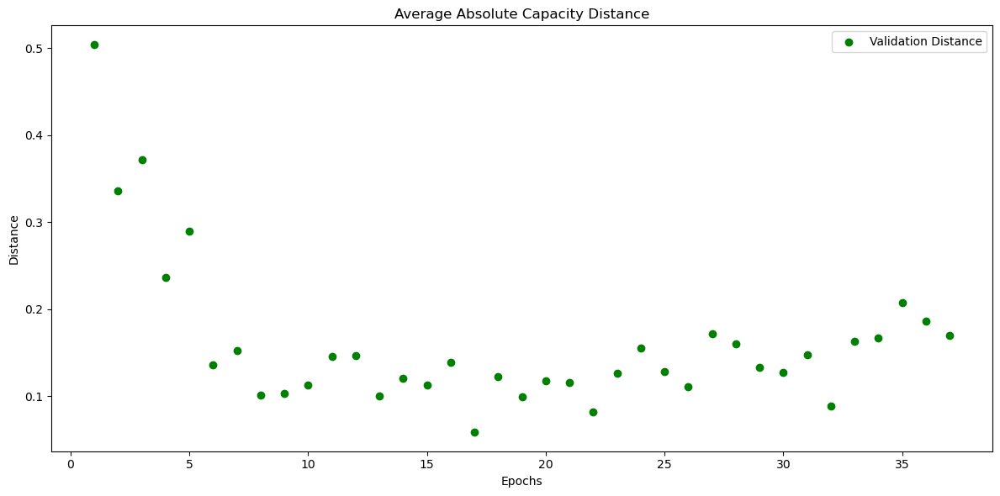

In [299]:
# B0005_charge_mm
model_B0005_charge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0005_charge_mm, train_losses_B0005_charge_mm, val_losses_B0005_charge_mm, val_distances_B0005_charge_mm, metrics_history_B0005_charge_mm = train(data_loaders['B0005_charge_mm_val_loader'], data_loaders['B0005_charge_mm_train_loader'], model_B0005_charge_mm)
torch.save(model_B0005_charge_mm, os.path.join(folder_name, 'model_B0005_charge_mm.pth'))

Test Loss: 0.0339, Test Distance: 0.1843, Test Accuracy: 0.0000, SNR: -10.8318
##Metrics##:
MAE : 0.18429449200630188
MSE : 0.03542270138859749
RMSE : 0.43018245697021484
R-squared : -877.676513671875
Count: 21


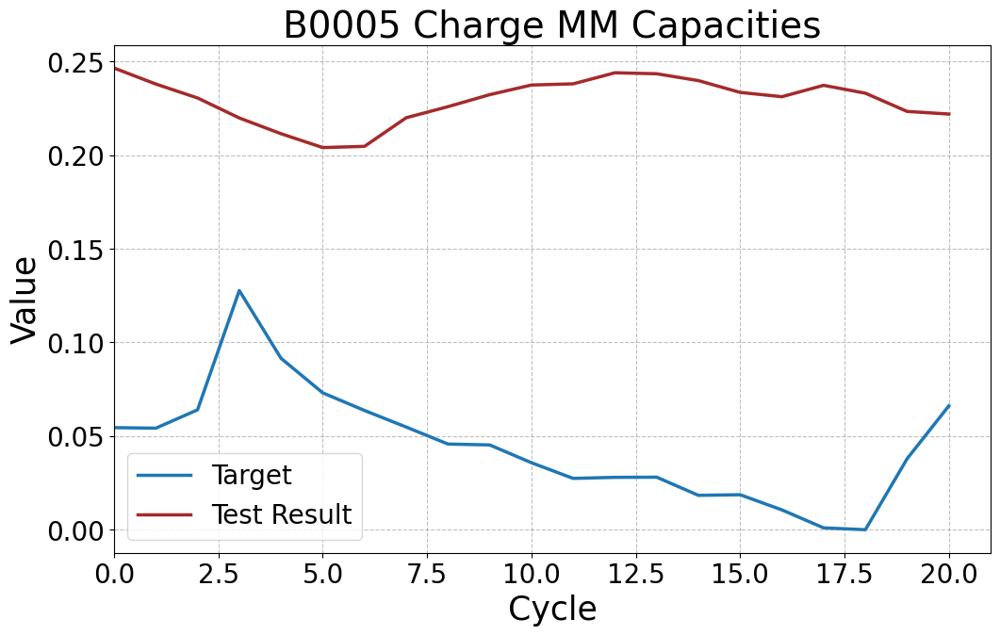

In [300]:
# B0005_charge_mm
model_B0005_charge_mm = torch.load('5. CNN-LSTM Models/model_B0005_charge_mm.pth')
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_test_loader'])
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)
plot_tensors(y_target_B0005_charge_mm, y_testresult_B0005_charge_mm, labels=["Target", "Test Result"], title="B0005 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0070, Test Distance: 0.0550, Test Accuracy: 26.6667, SNR: 17.0485
##Metrics##:
MAE : 0.05499693378806114
MSE : 0.006844985298812389
RMSE : 0.23829081654548645
R-squared : -189.5106201171875
Count: 150


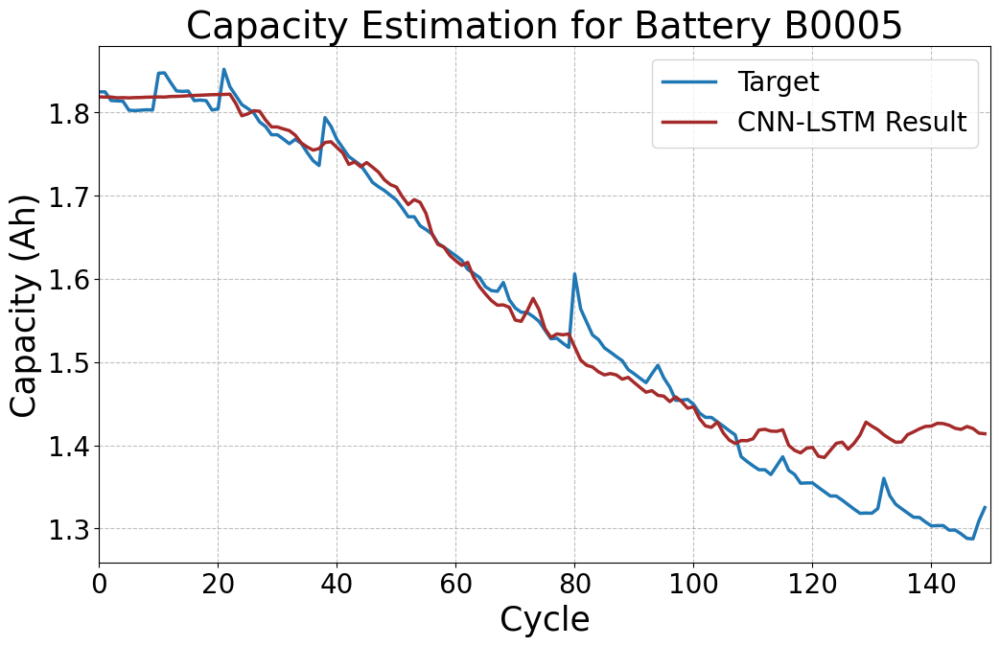

In [301]:
# Run the test on the model
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_mm = torch.tensor(original_y_target_B0005_charge_mm)
original_y_testresult_B0005_charge_mm = torch.tensor(original_y_testresult_B0005_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


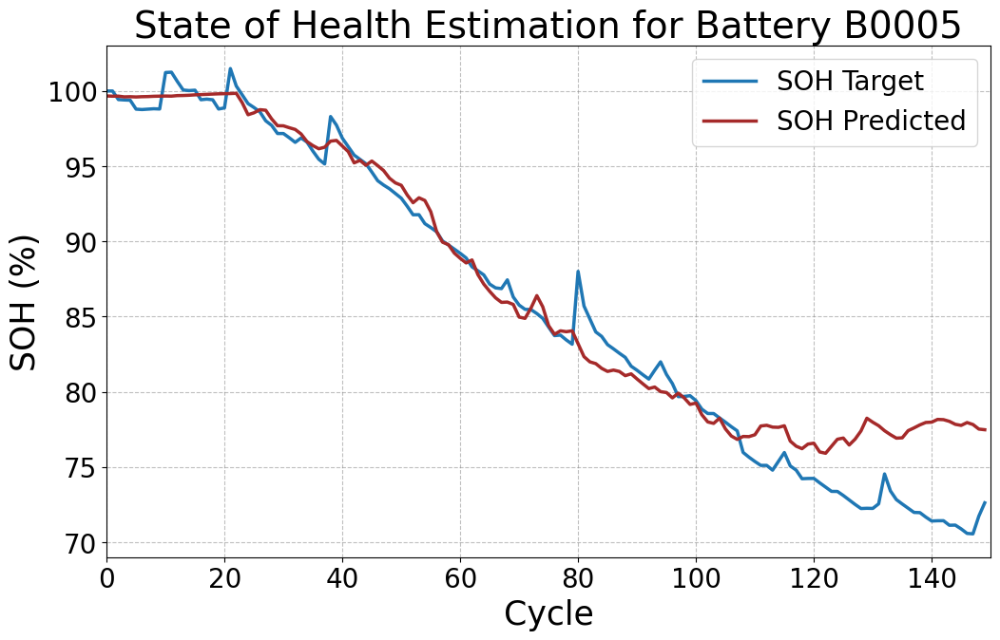

In [302]:
plot_soh(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_charge_mm")


Model 2 - B0005 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2571, Validation Loss: 0.3946
Validation Distance: 0.7027, Validation Accuracy: 0.0000, SNR: 4.1640
##Metrics##:
MAE : 0.5269978046417236
MSE : 0.3829721510410309
RMSE : 0.7269070744514465
R-squared : -1175.3438720703125
Count: 28
Epoch 2/120, Training Loss: 0.0282, Validation Loss: 0.2293
Validation Distance: 0.5297, Validation Accuracy: 0.0000, SNR: 6.0534
##Metrics##:
MAE : 0.3972471058368683
MSE : 0.2238304764032364
RMSE : 0.6318538784980774
R-squared : -699.98046875
Count: 28
Epoch 3/120, Training Loss: 0.0180, Validation Loss: 0.2145
Validation Distance: 0.5187, Validation Accuracy: 0.0000, SNR: 6.2878
##Metrics##:
MAE : 0.3890102803707123
MSE : 0.2164153754711151
RMSE : 0.6255240440368652
R-squared : -674.3826904296875
Count: 28
Epoch 4/120, Training Loss: 0.0174, Validation Loss: 0.2018
Validation Distance: 0.4711, Validation Accuracy: 0.0000, SNR: 6.5597
##Metrics##:
MAE : 0.35332247614860535
MSE : 0.17882223427295685
RMSE : 0.5958836674690247
R-s

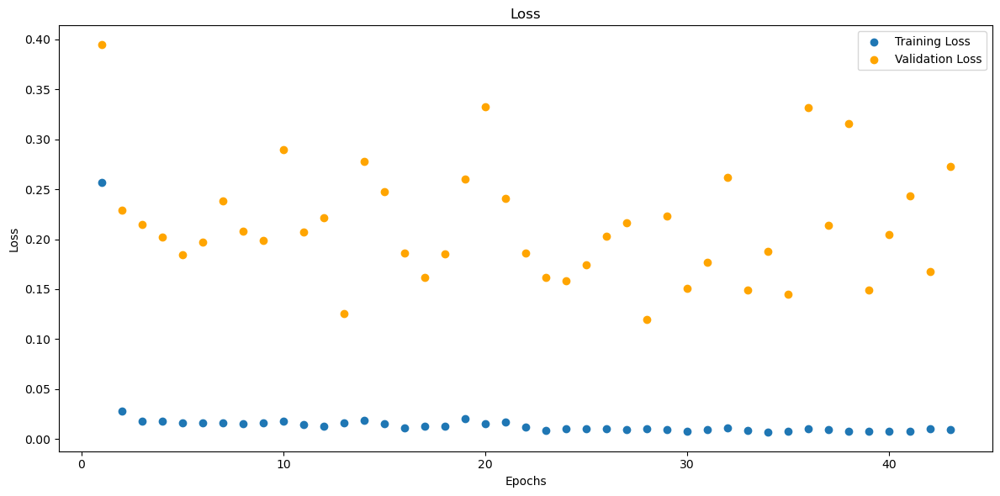

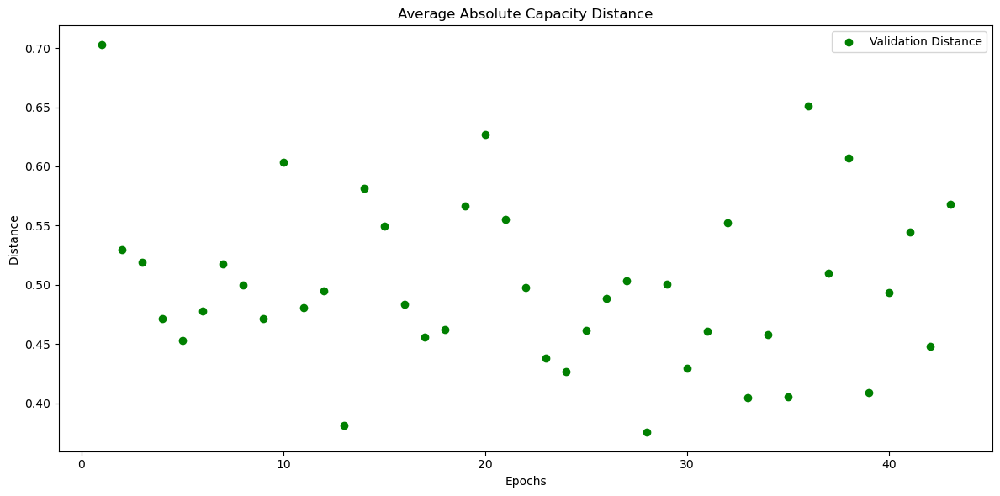

In [303]:
# B0005_charge_std
model_B0005_charge_std = CNNLSTM(input_shape=input_shape_single)
model_B0005_charge_std, train_losses_B0005_charge_std, val_losses_B0005_charge_std, val_distances_B0005_charge_std, metrics_history_B0005_charge_std = train(data_loaders['B0005_charge_std_val_loader'], data_loaders['B0005_charge_std_train_loader'], model_B0005_charge_std)
torch.save(model_B0005_charge_std, os.path.join(folder_name, 'model_B0005_charge_std.pth'))

Test Loss: 0.6661, Test Distance: 0.8761, Test Accuracy: 0.0000, SNR: 3.7437
##Metrics##:
MAE : 0.8760581016540527
MSE : 0.7919192314147949
RMSE : 0.9368658661842346
R-squared : -2012.5003662109375
Count: 21


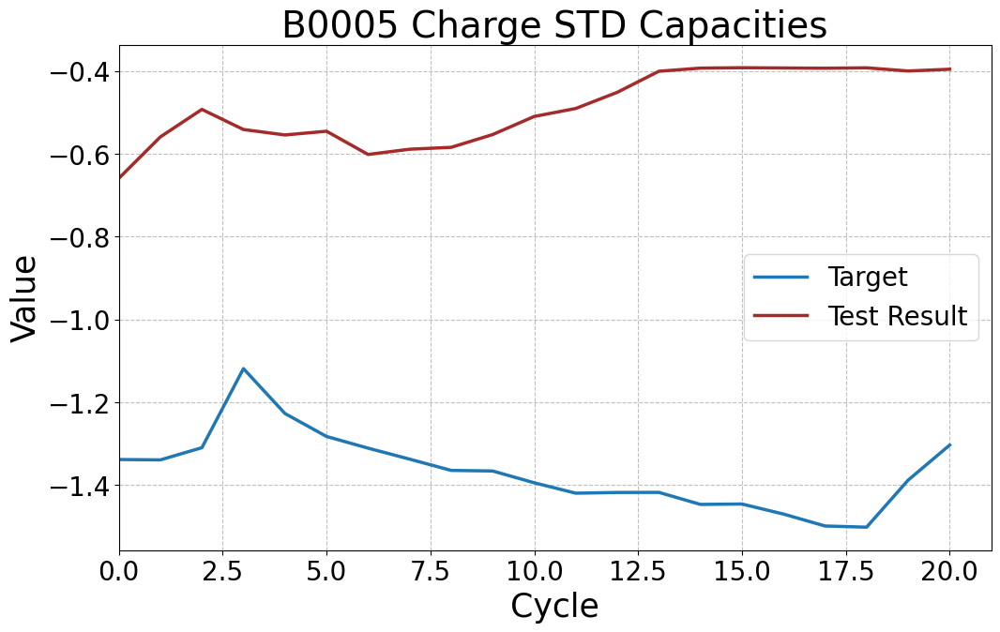

In [304]:
# B0005_charge_std
model_B0005_charge_std = torch.load('5. CNN-LSTM Models/model_B0005_charge_std.pth')
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_test_loader'])
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)
plot_tensors(y_target_B0005_charge_std, y_testresult_B0005_charge_std, labels=["Target", "Test Result"], title="B0005 Charge STD Capacities")


Test on Complete dataset

Test Loss: 0.1165, Test Distance: 0.2197, Test Accuracy: 14.6667, SNR: 8.4673
##Metrics##:
MAE : 0.21965837478637695
MSE : 0.13667568564414978
RMSE : 0.4735563099384308
R-squared : -406.5406188964844
Count: 150


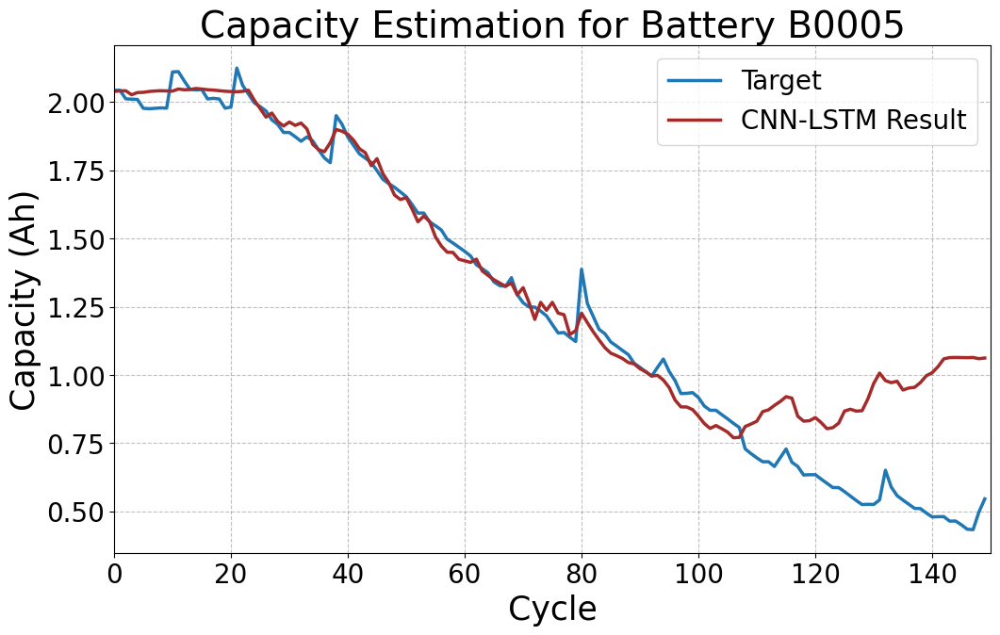

In [305]:
# Run the test on the model
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_std = torch.tensor(original_y_target_B0005_charge_std)
original_y_testresult_B0005_charge_std = torch.tensor(original_y_testresult_B0005_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


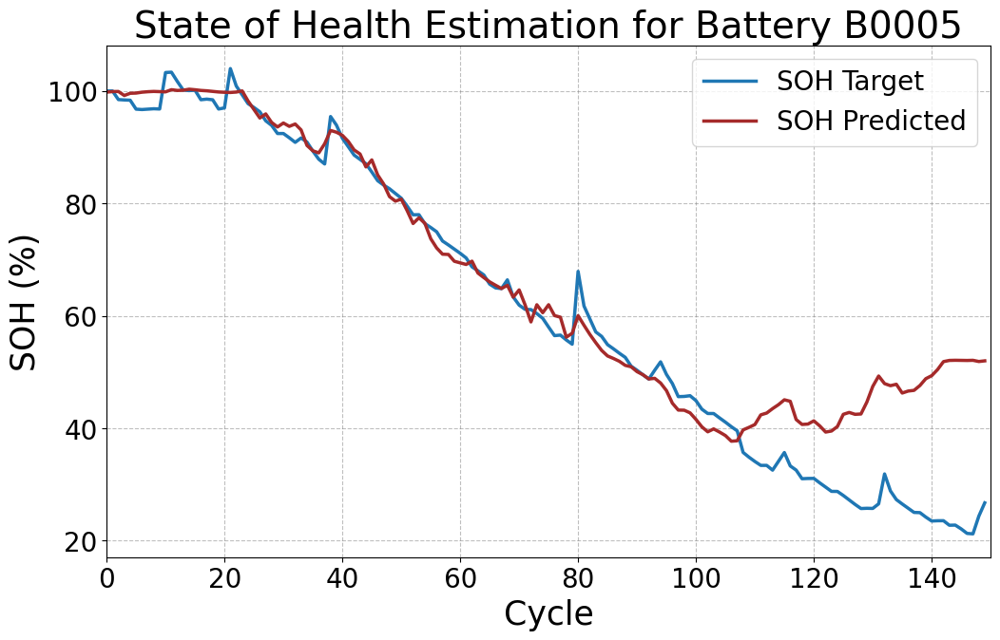

In [306]:
plot_soh(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, "State of Health Estimation for Battery B0005", file_name="B0005_charge_std")


Model 3 - B0005 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.3361, Validation Loss: 0.1653
Validation Distance: 0.4428, Validation Accuracy: 0.0000, SNR: 1.4112
##Metrics##:
MAE : 0.3321360945701599
MSE : 0.15071611106395721
RMSE : 0.5765501260757446
R-squared : -1742.58203125
Count: 28
Epoch 2/120, Training Loss: 0.0278, Validation Loss: 0.0251
Validation Distance: 0.1664, Validation Accuracy: 0.0000, SNR: 7.7038
##Metrics##:
MAE : 0.12479068338871002
MSE : 0.023652436211705208
RMSE : 0.35407641530036926
R-squared : -292.5025939941406
Count: 28
Epoch 3/120, Training Loss: 0.0082, Validation Loss: 0.0911
Validation Distance: 0.3120, Validation Accuracy: 0.0000, SNR: 3.5137
##Metrics##:
MAE : 0.23399688303470612
MSE : 0.0758703202009201
RMSE : 0.48409324884414673
R-squared : -911.8733520507812
Count: 28
Epoch 4/120, Training Loss: 0.0041, Validation Loss: 0.0686
Validation Distance: 0.2638, Validation Accuracy: 0.0000, SNR: 4.4939
##Metrics##:
MAE : 0.1978698968887329
MSE : 0.055083878338336945
RMSE : 0.4453203678131

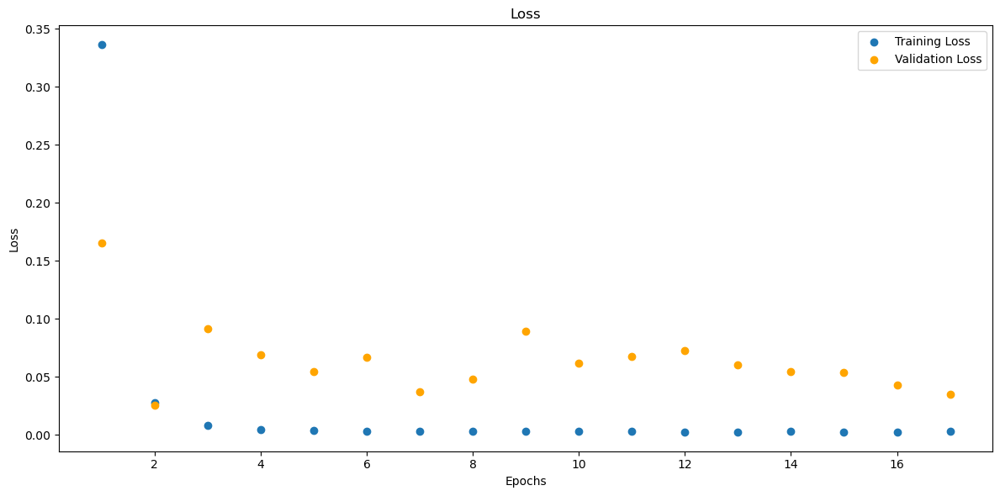

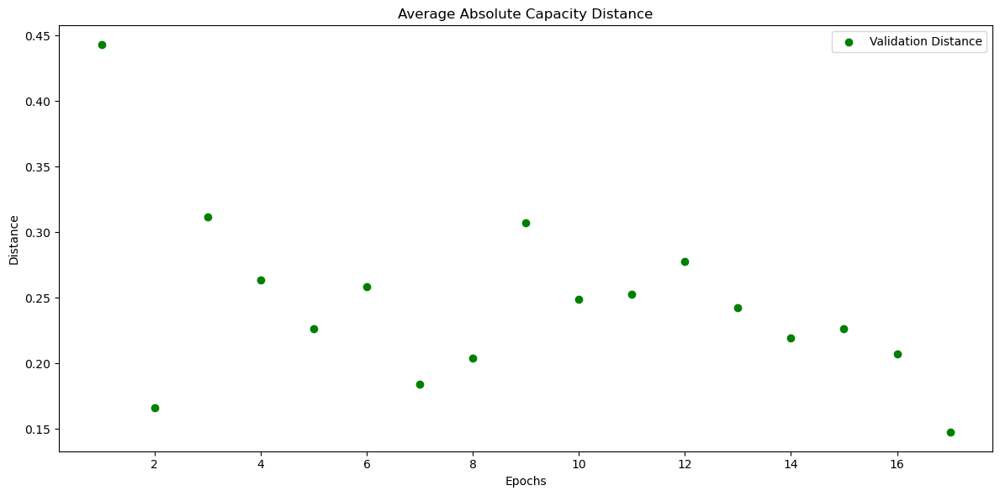

In [307]:
# B0005_charge_rob
model_B0005_charge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0005_charge_rob, train_losses_B0005_charge_rob, val_losses_B0005_charge_rob, val_distances_B0005_charge_rob, metrics_history_B0005_charge_rob = train(data_loaders['B0005_charge_rob_val_loader'], data_loaders['B0005_charge_rob_train_loader'], model_B0005_charge_rob)
torch.save(model_B0005_charge_rob, os.path.join(folder_name, 'model_B0005_charge_rob.pth'))

Test Loss: 0.1294, Test Distance: 0.3660, Test Accuracy: 0.0000, SNR: 4.7888
##Metrics##:
MAE : 0.36597102880477905
MSE : 0.1381634920835495
RMSE : 0.605655312538147
R-squared : -1469.7156982421875
Count: 21


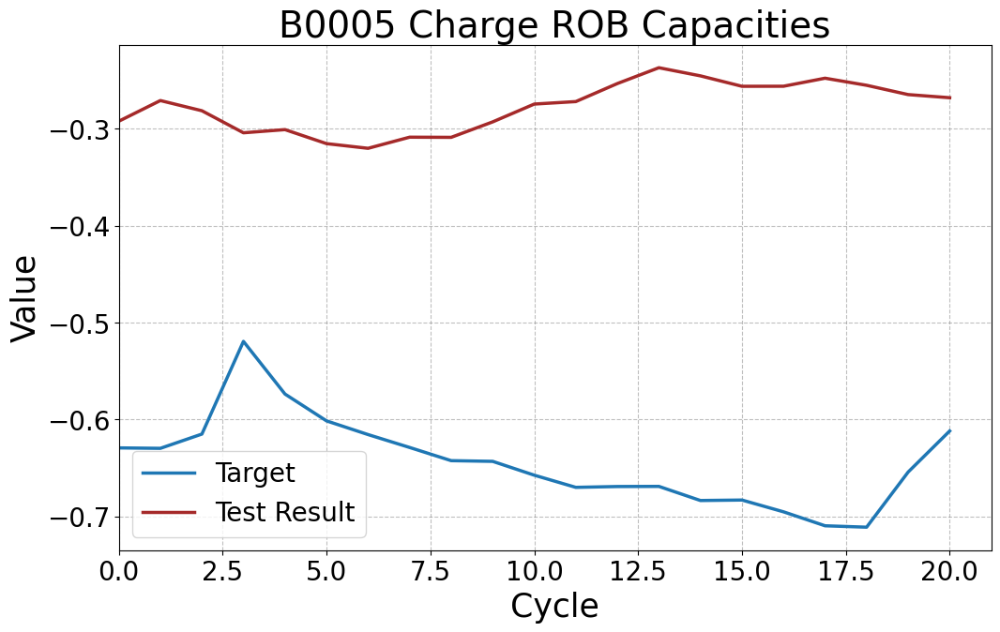

In [308]:
# B0005_charge_rob
model_B0005_charge_rob = torch.load('5. CNN-LSTM Models/model_B0005_charge_rob.pth')
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_test_loader'])
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)
plot_tensors(y_target_B0005_charge_rob, y_testresult_B0005_charge_rob, labels=["Target", "Test Result"], title="B0005 Charge ROB Capacities")


Test on complete dataset.

In [309]:
# Run the test on the model
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)

# # Assuming scaler_y_charge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_target_B0005_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_testresult_B0005_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_charge_rob = torch.tensor(original_y_target_B0005_charge_rob)
# original_y_testresult_B0005_charge_rob = torch.tensor(original_y_testresult_B0005_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0323, Test Distance: 0.1388, Test Accuracy: 5.3333, SNR: 8.6341
##Metrics##:
MAE : 0.13880936801433563
MSE : 0.03302137553691864
RMSE : 0.3770442605018616
R-squared : -754.6160888671875
Count: 150


SOH plot.

In [310]:
# plot_soh(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_charge_rob")

Model 4 - B0005 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.3544, Validation Loss: 0.2289
Validation Distance: 0.4942, Validation Accuracy: 0.0000, SNR: -14.3857
##Metrics##:
MAE : 0.3706539273262024
MSE : 0.18370437622070312
RMSE : 0.6088542342185974
R-squared : -4697.14306640625
Count: 28
Epoch 2/120, Training Loss: 0.0224, Validation Loss: 0.0084
Validation Distance: 0.1009, Validation Accuracy: 0.0000, SNR: 0.0486
##Metrics##:
MAE : 0.07566039264202118
MSE : 0.007831411436200142
RMSE : 0.2756426930427551
R-squared : -202.50119018554688
Count: 28
Epoch 3/120, Training Loss: 0.0096, Validation Loss: 0.0054
Validation Distance: 0.0847, Validation Accuracy: 0.0000, SNR: 2.2024
##Metrics##:
MAE : 0.06355993449687958
MSE : 0.005553754512220621
RMSE : 0.25277620553970337
R-squared : -142.70816040039062
Count: 28
Epoch 4/120, Training Loss: 0.0086, Validation Loss: 0.0063
Validation Distance: 0.0873, Validation Accuracy: 0.0000, SNR: 1.7741
##Metrics##:
MAE : 0.06545782089233398
MSE : 0.005855180323123932
RMSE : 0.2564

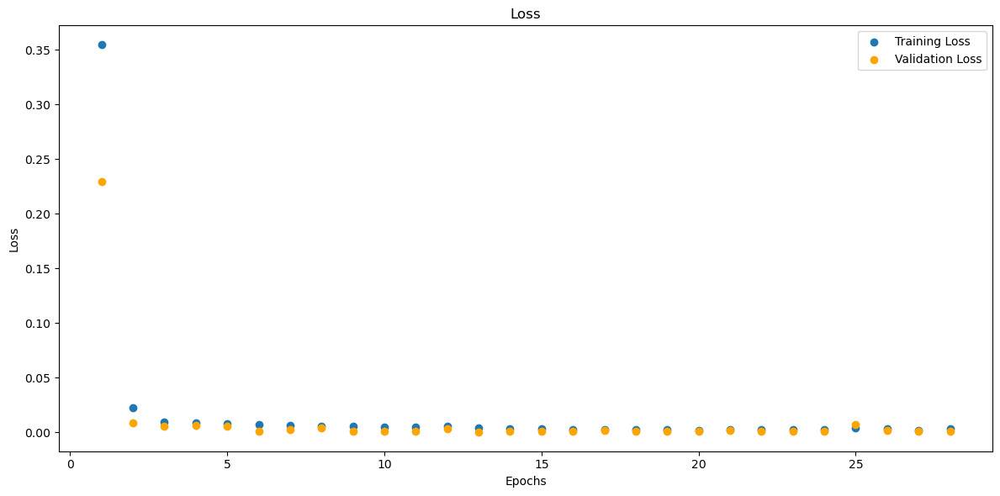

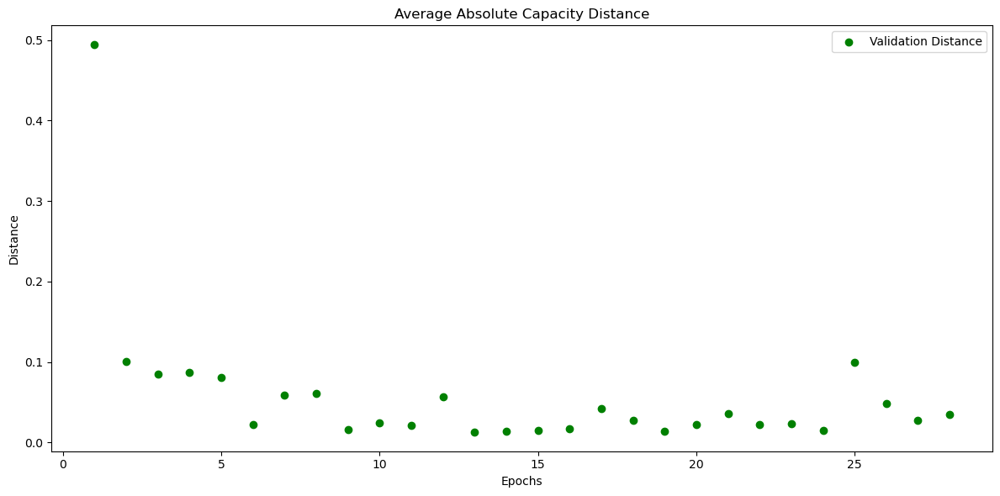

In [311]:
# B0005_discharge_mm
model_B0005_discharge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0005_discharge_mm, train_losses_B0005_discharge_mm, val_losses_B0005_discharge_mm, val_distances_B0005_discharge_mm, metrics_history_B0005_discharge_mm = train(data_loaders['B0005_discharge_mm_val_loader'], data_loaders['B0005_discharge_mm_train_loader'], model_B0005_discharge_mm)
torch.save(model_B0005_discharge_mm, os.path.join(folder_name, 'model_B0005_discharge_mm.pth'))

Test Loss: 0.0005, Test Distance: 0.0159, Test Accuracy: 9.5238, SNR: 7.9380
##Metrics##:
MAE : 0.015892282128334045
MSE : 0.0004702263686340302
RMSE : 0.14056368172168732
R-squared : -4.730396270751953
Count: 21


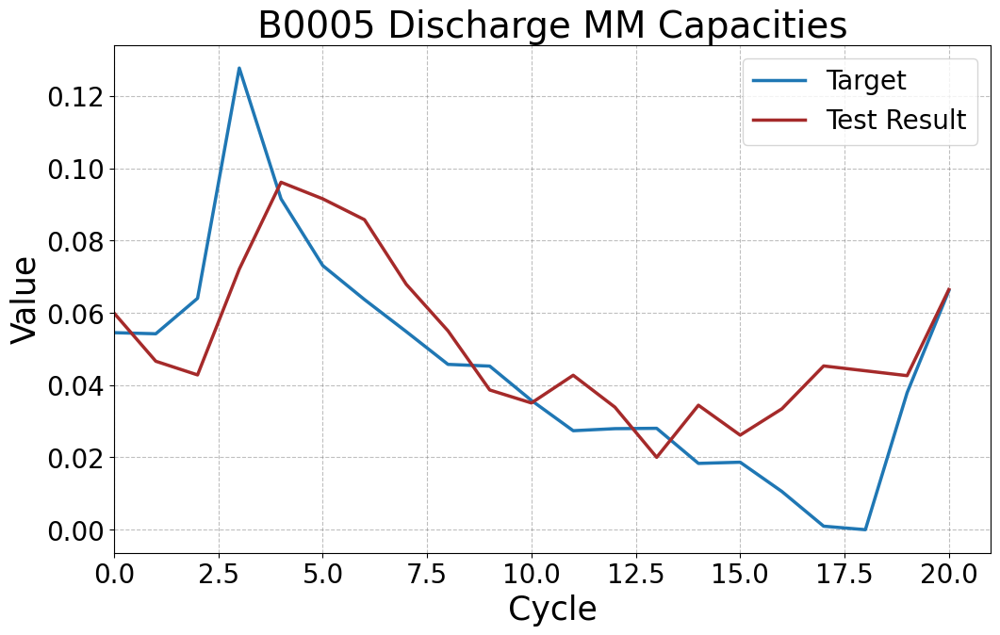

In [312]:
# B0005_discharge_mm
model_B0005_discharge_mm = torch.load('5. CNN-LSTM Models/model_B0005_discharge_mm.pth')
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_test_loader'])
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)
plot_tensors(y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm, labels=["Target", "Test Result"], title="B0005 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0020, Test Distance: 0.0249, Test Accuracy: 30.6667, SNR: 24.1932
##Metrics##:
MAE : 0.02488580159842968
MSE : 0.001321005867794156
RMSE : 0.16639329493045807
R-squared : -12.274762153625488
Count: 150


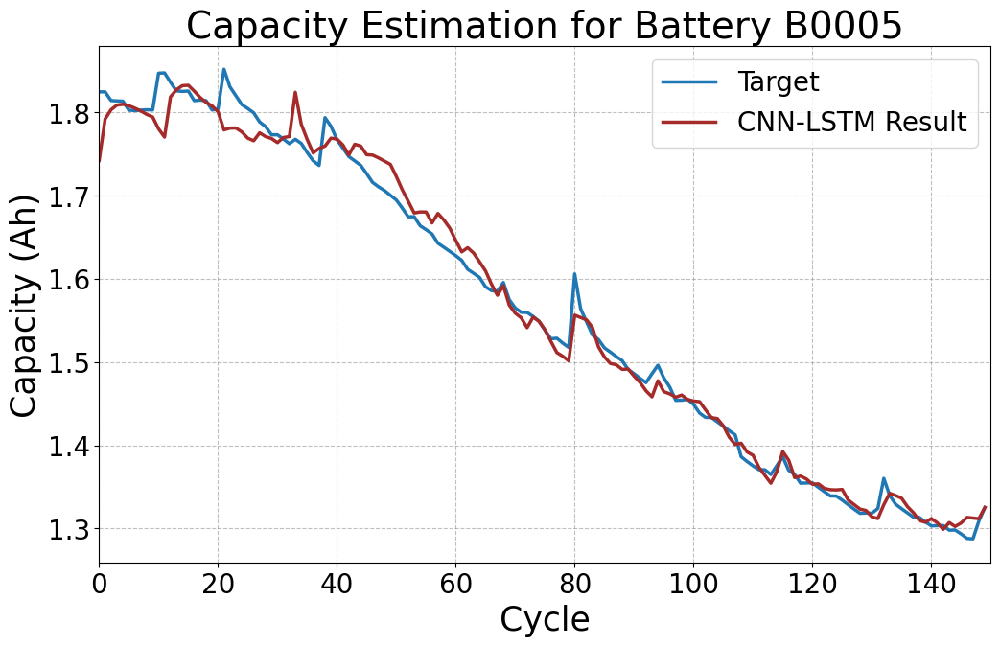

In [313]:
# Run the test on the model
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_target_B0005_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_testresult_B0005_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_mm = torch.tensor(original_y_target_B0005_discharge_mm)
original_y_testresult_B0005_discharge_mm = torch.tensor(original_y_testresult_B0005_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


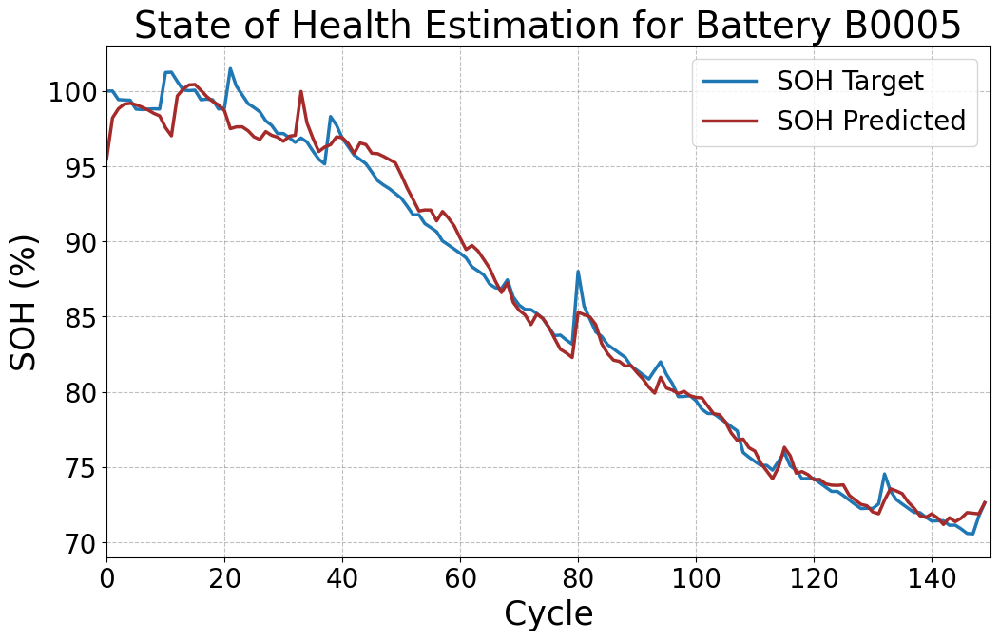

In [314]:
plot_soh(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_mm")

Model 5 - B0005 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2015, Validation Loss: 0.0581
Validation Distance: 0.2820, Validation Accuracy: 0.0000, SNR: 11.3915
##Metrics##:
MAE : 0.2115015685558319
MSE : 0.06358376890420914
RMSE : 0.46057578921318054
R-squared : -197.17990112304688
Count: 28
Epoch 2/120, Training Loss: 0.0261, Validation Loss: 0.0742
Validation Distance: 0.2957, Validation Accuracy: 0.0000, SNR: 10.1705
##Metrics##:
MAE : 0.22177931666374207
MSE : 0.07052735984325409
RMSE : 0.47159743309020996
R-squared : -218.95591735839844
Count: 28
Epoch 3/120, Training Loss: 0.0114, Validation Loss: 0.1135
Validation Distance: 0.3847, Validation Accuracy: 0.0000, SNR: 8.6338
##Metrics##:
MAE : 0.28853145241737366
MSE : 0.11672079563140869
RMSE : 0.5376590490341187
R-squared : -357.20263671875
Count: 28
Epoch 4/120, Training Loss: 0.0095, Validation Loss: 0.1854
Validation Distance: 0.4831, Validation Accuracy: 0.0000, SNR: 7.1190
##Metrics##:
MAE : 0.36235904693603516
MSE : 0.17928919196128845
RMSE : 0.6022552

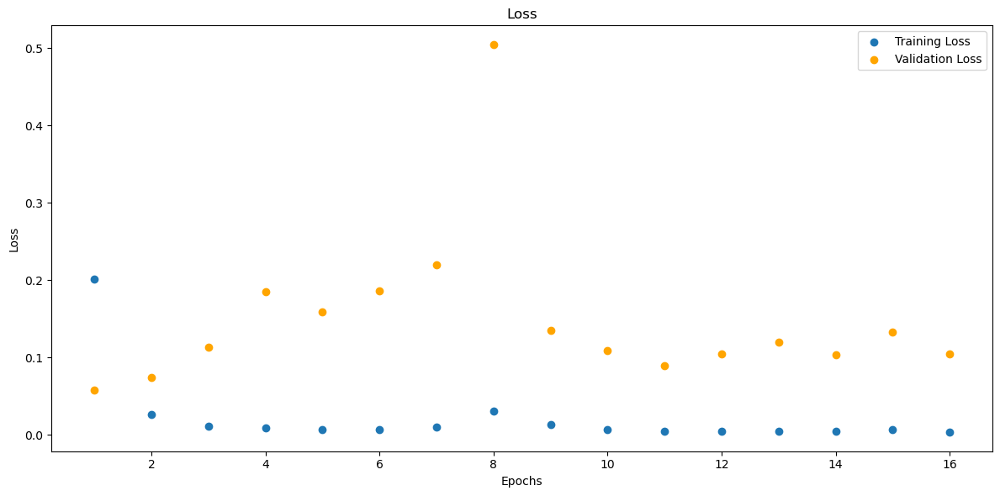

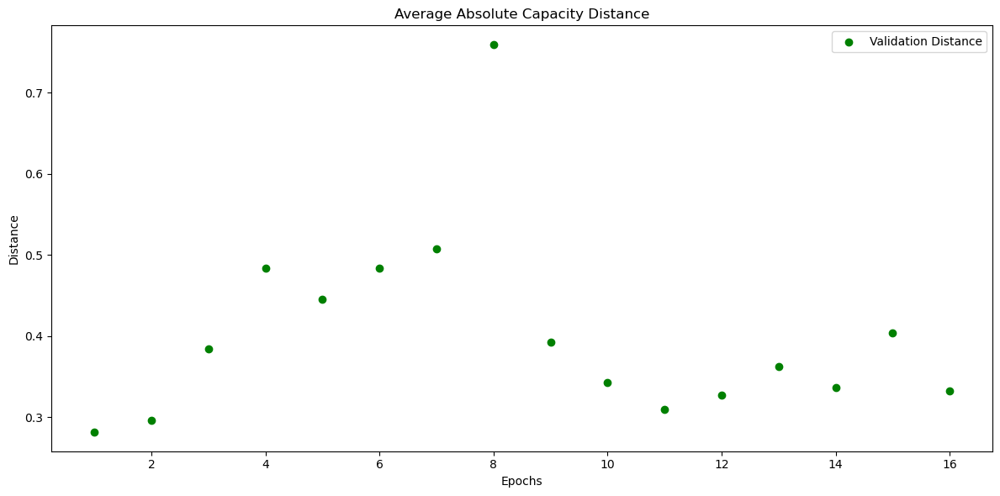

In [315]:
# B0005_discharge_std
model_B0005_discharge_std = CNNLSTM(input_shape=input_shape_single)
model_B0005_discharge_std, train_losses_B0005_discharge_std, val_losses_B0005_discharge_std, val_distances_B0005_discharge_std, metrics_history_B0005_discharge_std = train(data_loaders['B0005_discharge_std_val_loader'], data_loaders['B0005_discharge_std_train_loader'], model_B0005_discharge_std)
torch.save(model_B0005_discharge_std, os.path.join(folder_name, 'model_B0005_discharge_std.pth'))

Test Loss: 0.2018, Test Distance: 0.4854, Test Accuracy: 0.0000, SNR: 8.8245
##Metrics##:
MAE : 0.4853658676147461
MSE : 0.24581272900104523
RMSE : 0.6984378099441528
R-squared : -645.9426879882812
Count: 21


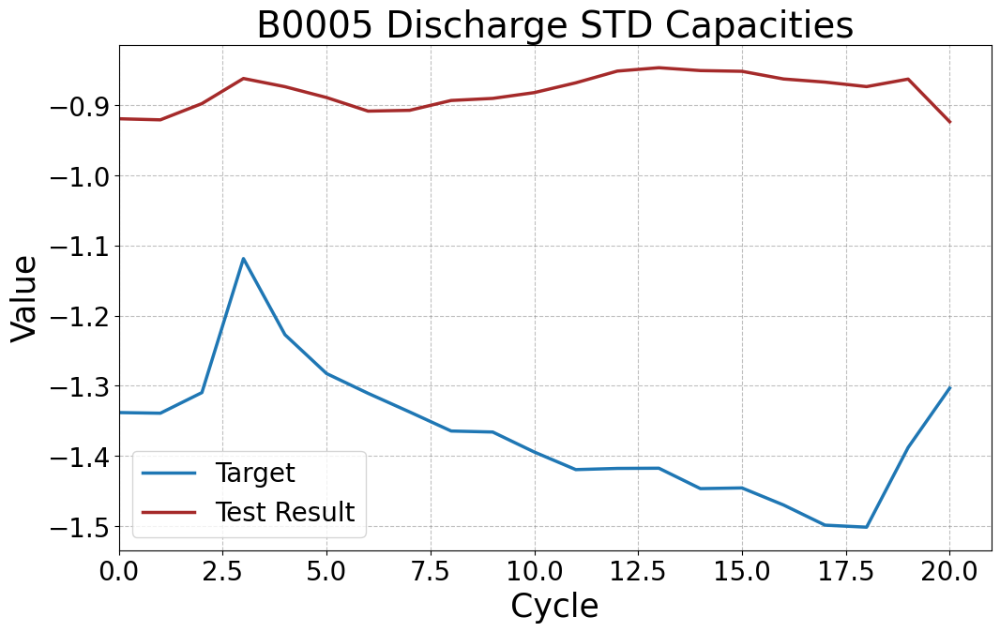

In [316]:
# B0005_discharge_std
model_B0005_discharge_std = torch.load('5. CNN-LSTM Models/model_B0005_discharge_std.pth')
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_test_loader'])
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)
plot_tensors(y_target_B0005_discharge_std, y_testresult_B0005_discharge_std, labels=["Target", "Test Result"], title="B0005 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.1083, Test Distance: 0.3104, Test Accuracy: 2.6667, SNR: 9.0003
##Metrics##:
MAE : 0.31036171317100525
MSE : 0.12088917940855026
RMSE : 0.5607786178588867
R-squared : -512.0525512695312
Count: 150


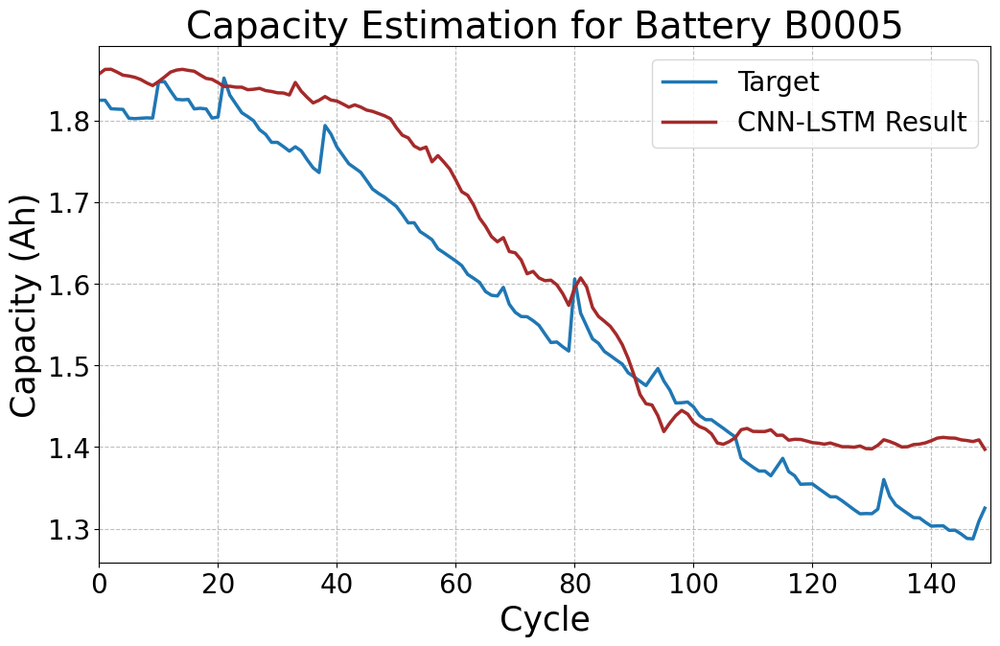

In [317]:
# Run the test on the model
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_target_B0005_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_testresult_B0005_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_std = torch.tensor(original_y_target_B0005_discharge_std)
original_y_testresult_B0005_discharge_std = torch.tensor(original_y_testresult_B0005_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


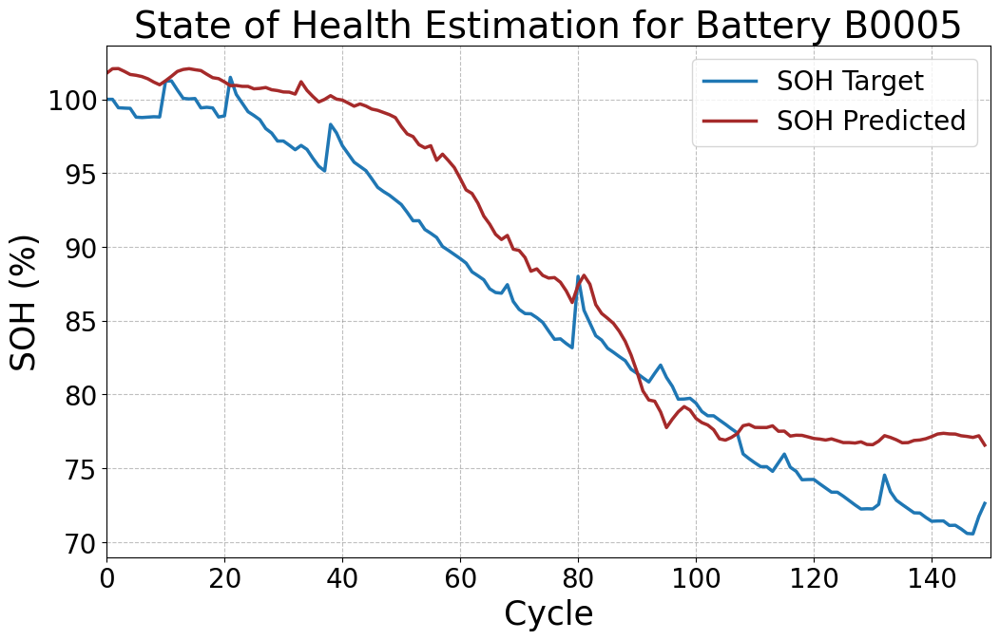

In [318]:
plot_soh(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_std")

Model 6 - B0005 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2620, Validation Loss: 0.0355
Validation Distance: 0.2461, Validation Accuracy: 0.0000, SNR: 7.7912
##Metrics##:
MAE : 0.18455295264720917
MSE : 0.046475600451231
RMSE : 0.4299648404121399
R-squared : -513.4191284179688
Count: 28
Epoch 2/120, Training Loss: 0.0166, Validation Loss: 0.0080
Validation Distance: 0.0634, Validation Accuracy: 9.5238, SNR: 12.3229
##Metrics##:
MAE : 0.04756016656756401
MSE : 0.004288475029170513
RMSE : 0.22191111743450165
R-squared : -57.57089614868164
Count: 28
Epoch 3/120, Training Loss: 0.0067, Validation Loss: 0.0124
Validation Distance: 0.0873, Validation Accuracy: 0.0000, SNR: 11.0407
##Metrics##:
MAE : 0.06548012793064117
MSE : 0.007125642150640488
RMSE : 0.25758683681488037
R-squared : -84.76152801513672
Count: 28
Epoch 4/120, Training Loss: 0.0033, Validation Loss: 0.0076
Validation Distance: 0.0584, Validation Accuracy: 19.0476, SNR: 13.1630
##Metrics##:
MAE : 0.04380875453352928
MSE : 0.003606431419029832
RMSE : 0.212

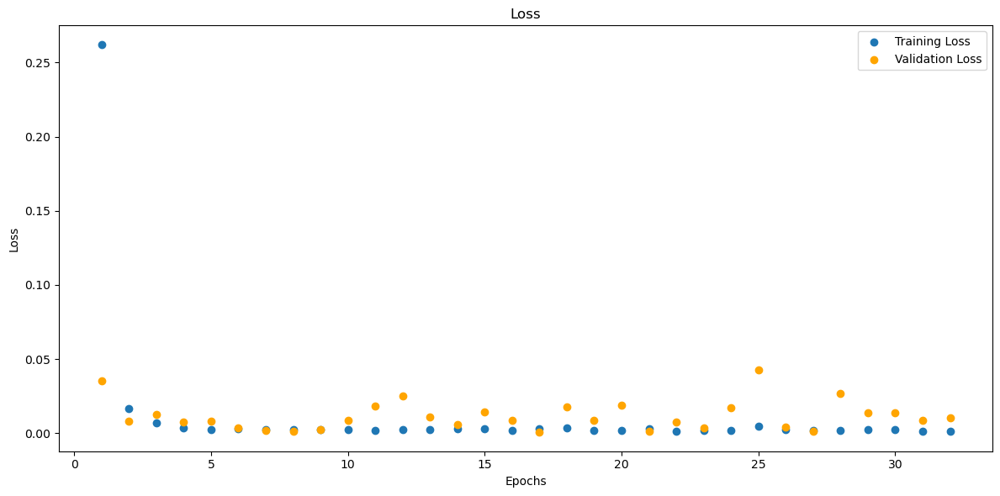

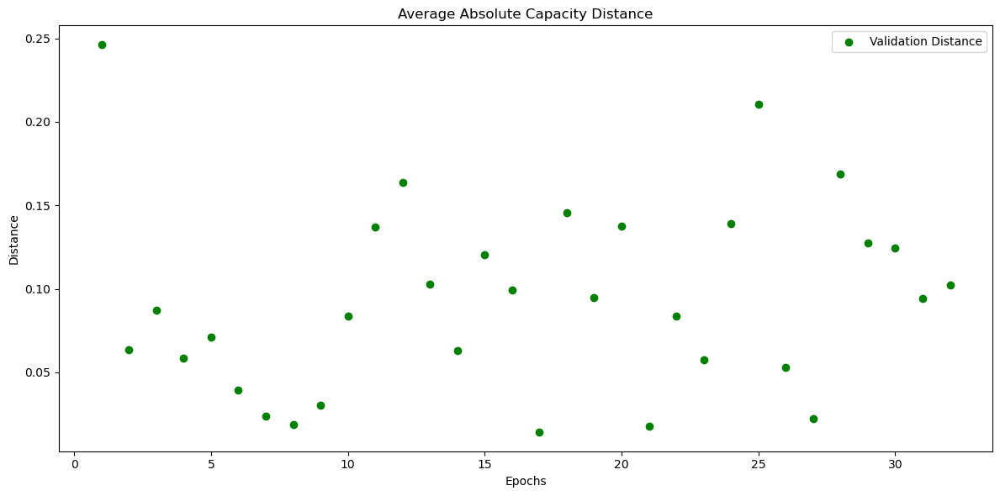

In [319]:
# B0005_discharge_rob
model_B0005_discharge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0005_discharge_rob, train_losses_B0005_discharge_rob, val_losses_B0005_discharge_rob, val_distances_B0005_discharge_rob, metrics_history_B0005_discharge_rob = train(data_loaders['B0005_discharge_rob_val_loader'], data_loaders['B0005_discharge_rob_train_loader'], model_B0005_discharge_rob)
torch.save(model_B0005_discharge_rob, os.path.join(folder_name, 'model_B0005_discharge_rob.pth'))

Test Loss: 0.0062, Test Distance: 0.0599, Test Accuracy: 0.0000, SNR: 20.2256
##Metrics##:
MAE : 0.05988349765539169
MSE : 0.003951018676161766
RMSE : 0.2474672794342041
R-squared : -42.126094818115234
Count: 21


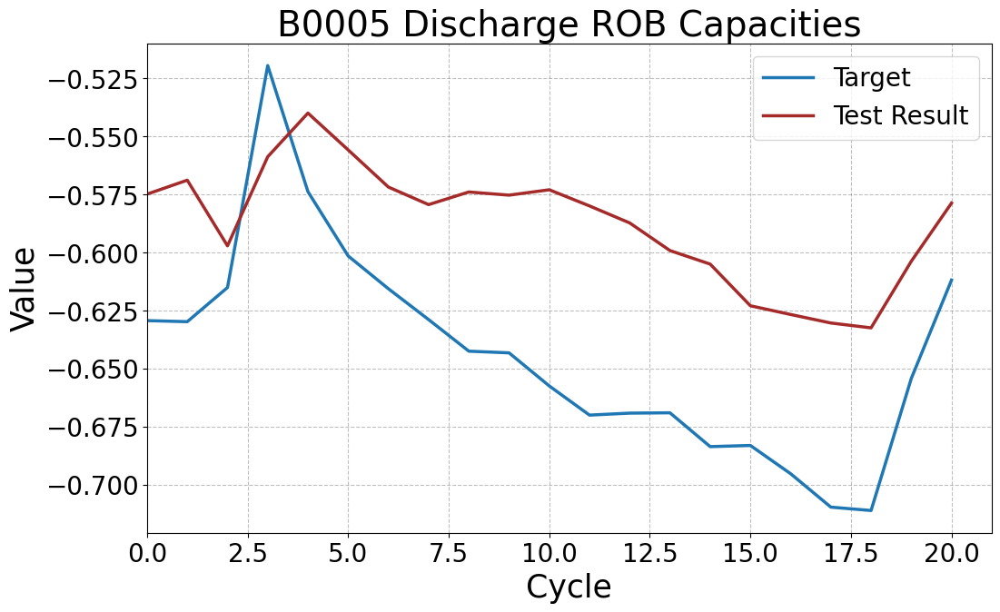

In [320]:
# B0005_discharge_rob
model_B0005_discharge_rob = torch.load('5. CNN-LSTM Models/model_B0005_discharge_rob.pth')
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_test_loader'])
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)
plot_tensors(y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob, labels=["Target", "Test Result"], title="B0005 Discharge ROB Capacities")


Test on complete dataset

In [321]:
# Run the test on the model
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)

# # Assuming scaler_y_discharge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_target_B0005_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_testresult_B0005_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_discharge_rob = torch.tensor(original_y_target_B0005_discharge_rob)
# original_y_testresult_B0005_discharge_rob = torch.tensor(original_y_testresult_B0005_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_rob", ylabel="Capacity (Ah)", save_dir="13, CNN-LSTM Capacity Plots")


Test Loss: 0.0036, Test Distance: 0.0444, Test Accuracy: 12.0000, SNR: 19.4888
##Metrics##:
MAE : 0.04436542093753815
MSE : 0.0027122246101498604
RMSE : 0.21483318507671356
R-squared : -33.8840446472168
Count: 150


SOH plot.

In [322]:
# plot_soh(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_rob")

Model 7 - B0005 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2117, Validation Loss: 0.0404
Validation Distance: 0.1900, Validation Accuracy: 0.0000, SNR: -7.5509
##Metrics##:
MAE : 0.14248432219028473
MSE : 0.027637362480163574
RMSE : 0.37771207094192505
R-squared : -732.6632080078125
Count: 28
Epoch 2/120, Training Loss: 0.0103, Validation Loss: 0.0280
Validation Distance: 0.1663, Validation Accuracy: 0.0000, SNR: -5.4922
##Metrics##:
MAE : 0.12471016496419907
MSE : 0.021111812442541122
RMSE : 0.35352271795272827
R-squared : -552.5194702148438
Count: 28
Epoch 3/120, Training Loss: 0.0049, Validation Loss: 0.0061
Validation Distance: 0.0632, Validation Accuracy: 0.0000, SNR: 0.8325
##Metrics##:
MAE : 0.04737047478556633
MSE : 0.0032766966614872217
RMSE : 0.219302698969841
R-squared : -86.87618255615234
Count: 28
Epoch 4/120, Training Loss: 0.0033, Validation Loss: 0.0031
Validation Distance: 0.0315, Validation Accuracy: 4.7619, SNR: 3.9044
##Metrics##:
MAE : 0.023649713024497032
MSE : 0.0008901111432351172
RMSE : 0.

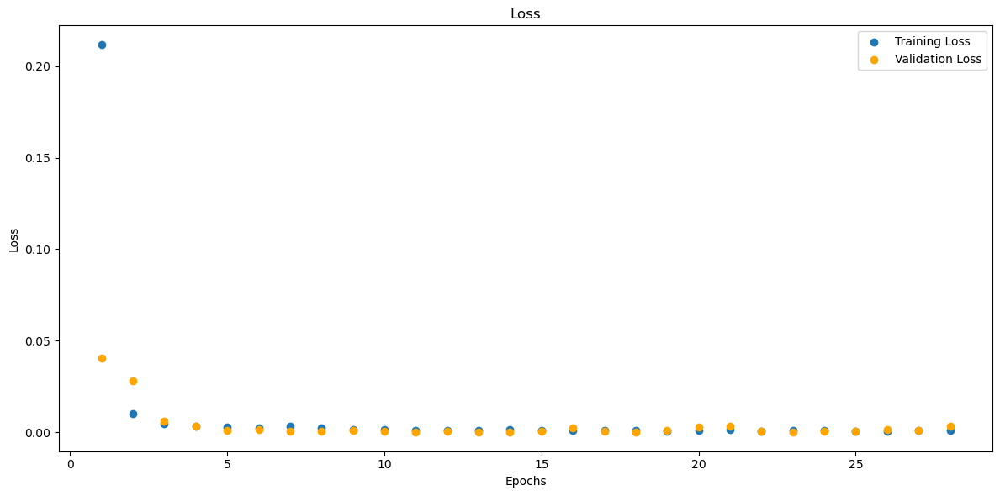

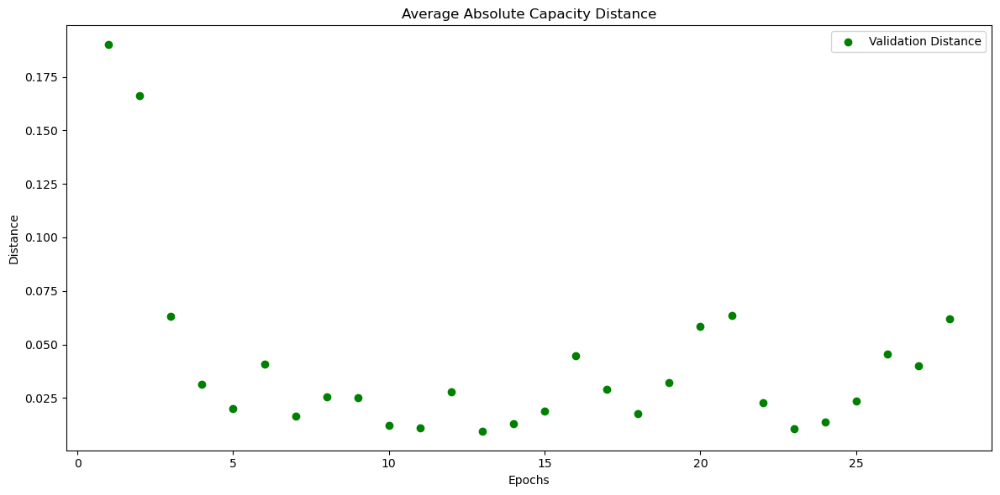

In [361]:
# B0005_combined_mm
model_B0005_combined_mm = CNNLSTM(input_shape=input_shape_combined)
model_B0005_combined_mm, train_losses_B0005_combined_mm, val_losses_B0005_combined_mm, val_distances_B0005_combined_mm, metrics_history_B0005_combined_mm = train(data_loaders['B0005_combined_mm_val_loader'], data_loaders['B0005_combined_mm_train_loader'], model_B0005_combined_mm)
torch.save(model_B0005_combined_mm, os.path.join(folder_name, 'model_B0005_combined_mm.pth'))

Test Loss: 0.0009, Test Distance: 0.0249, Test Accuracy: 4.7619, SNR: 5.6340
##Metrics##:
MAE : 0.02488982118666172
MSE : 0.0007992903119884431
RMSE : 0.16605889797210693
R-squared : -15.939325332641602
Count: 21


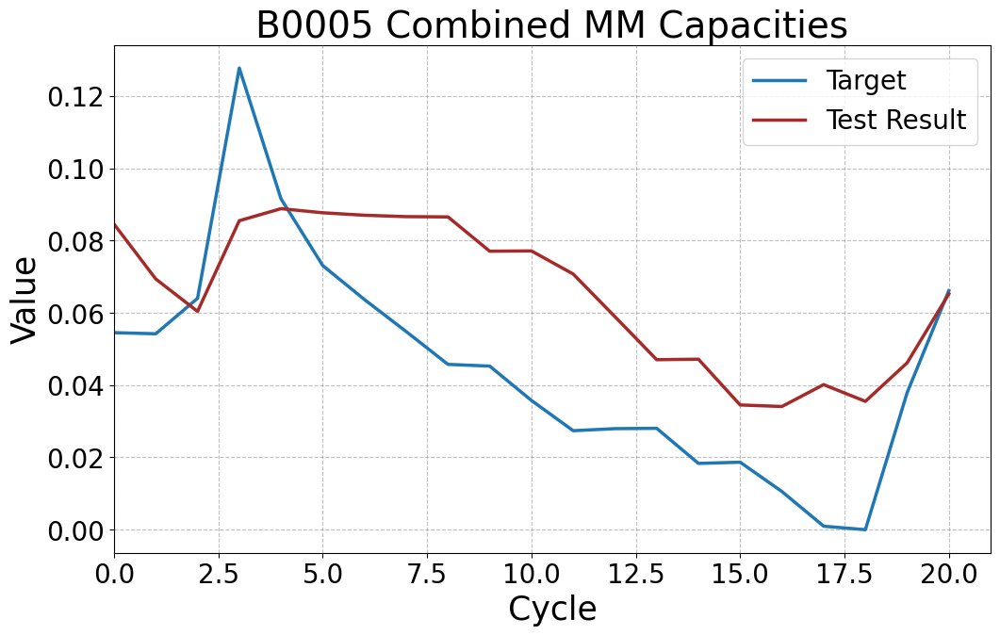

In [362]:
# B0005_combined_mm
model_B0005_combined_mm = torch.load('5. CNN-LSTM Models/model_B0005_combined_mm.pth')
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_test_loader'])
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)
plot_tensors(y_target_B0005_combined_mm, y_testresult_B0005_combined_mm, labels=["Target", "Test Result"], title="B0005 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0010, Test Distance: 0.0229, Test Accuracy: 29.3333, SNR: 25.6828
##Metrics##:
MAE : 0.0228589940816164
MSE : 0.0009374400251545012
RMSE : 0.15889325737953186
R-squared : -9.72898006439209
Count: 150


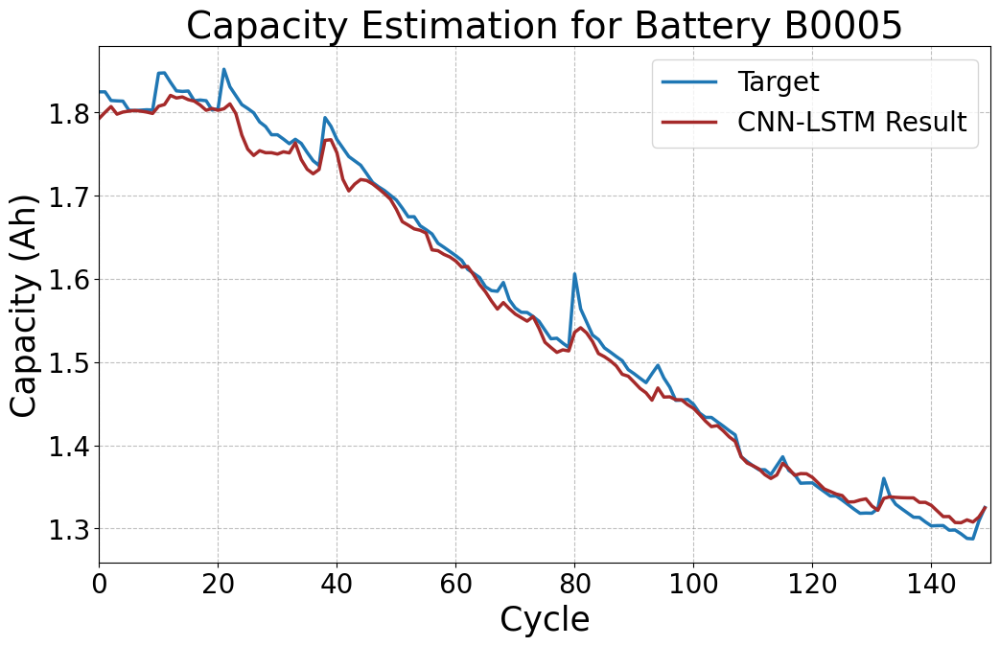

In [363]:
# Run the test on the model
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_target_B0005_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_testresult_B0005_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_mm = torch.tensor(original_y_target_B0005_combined_mm)
original_y_testresult_B0005_combined_mm = torch.tensor(original_y_testresult_B0005_combined_mm)
# print(original_y_target_B0005_combined_mm)
# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005",file_name="B0005_combined_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")

In [364]:
# # Convert tensors to numpy arrays and flatten to 1D
# original_y_target_B0005_combined_mm = original_y_target_B0005_combined_mm.numpy().flatten()
# original_y_testresult_B0005_combined_mm = original_y_testresult_B0005_combined_mm.numpy().flatten()
# # print(original_y_target_B0005_combined_mm)
# # Create a DataFrame to store the data with new column names
# df = pd.DataFrame({
#     "y_target_B0005_CNNLSTM": original_y_target_B0005_combined_mm,
#     "y_test_B0005_CNNLSTM": original_y_testresult_B0005_combined_mm
# })

# # Define the directory and file path
# save_dir = "15. Results"
# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)  # Create the directory if it doesn't exist

# csv_file_path = os.path.join(save_dir, "B0005_CNNLSTM_results.csv")

# # Save the DataFrame to a CSV file
# df.to_csv(csv_file_path, index=False)

# print(f"Data has been saved to {csv_file_path}")

SOH plot

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


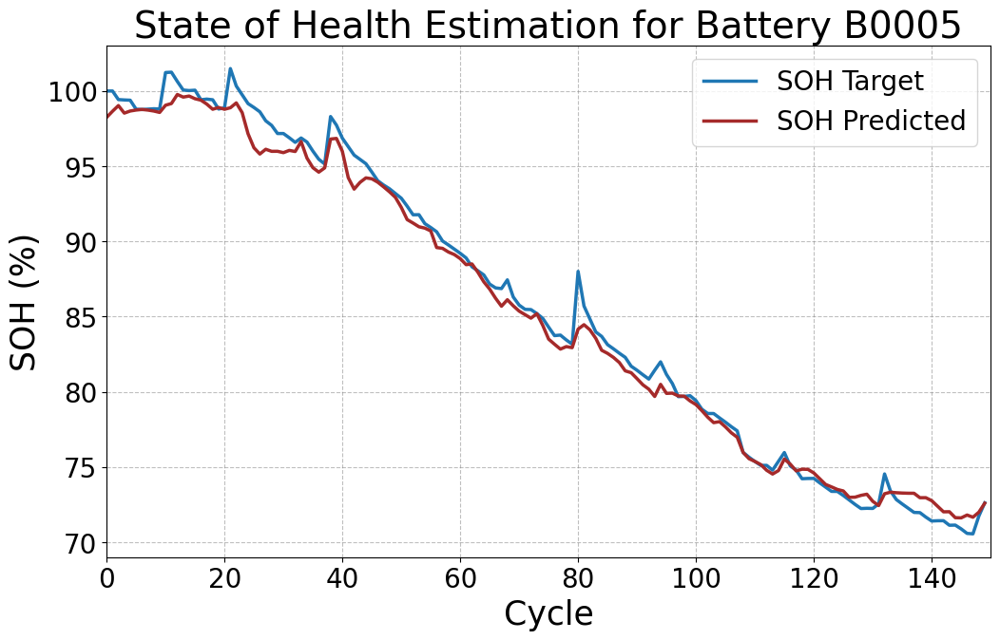

In [365]:
plot_soh(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm,"State of Health Estimation for Battery B0005", file_name="B0005_combined_mm")

Model 8 - B0005 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.1985, Validation Loss: 0.0707
Validation Distance: 0.2539, Validation Accuracy: 4.7619, SNR: 10.1847
##Metrics##:
MAE : 0.19041094183921814
MSE : 0.060511019080877304
RMSE : 0.4409807622432709
R-squared : -190.49717712402344
Count: 28
Epoch 2/120, Training Loss: 0.0141, Validation Loss: 0.2652
Validation Distance: 0.5791, Validation Accuracy: 0.0000, SNR: 5.5698
##Metrics##:
MAE : 0.4343574345111847
MSE : 0.2580418884754181
RMSE : 0.6594921946525574
R-squared : -754.6603393554688
Count: 28
Epoch 3/120, Training Loss: 0.0077, Validation Loss: 0.2140
Validation Distance: 0.5166, Validation Accuracy: 0.0000, SNR: 6.4413
##Metrics##:
MAE : 0.3874327540397644
MSE : 0.2059670388698578
RMSE : 0.622958779335022
R-squared : -607.9217529296875
Count: 28
Epoch 4/120, Training Loss: 0.0066, Validation Loss: 0.1727
Validation Distance: 0.4681, Validation Accuracy: 0.0000, SNR: 7.2337
##Metrics##:
MAE : 0.35104772448539734
MSE : 0.16986973583698273
RMSE : 0.593048274517

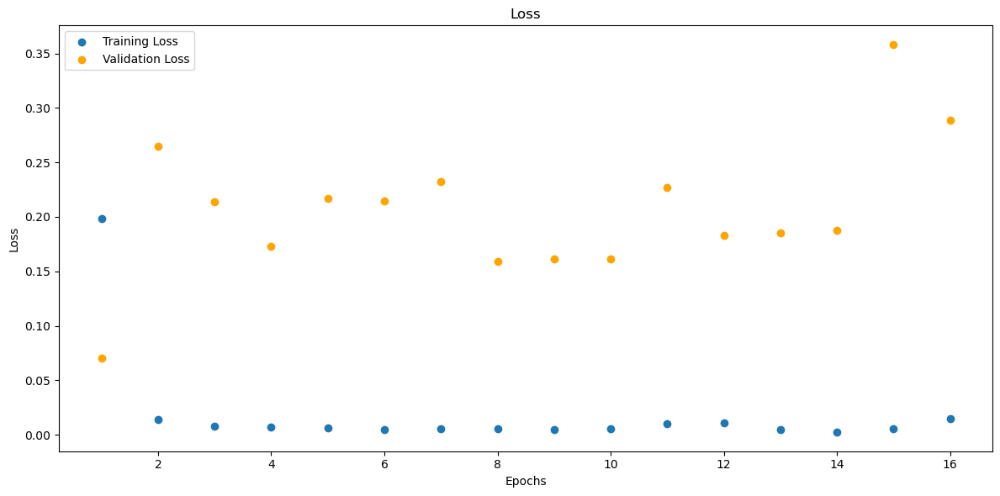

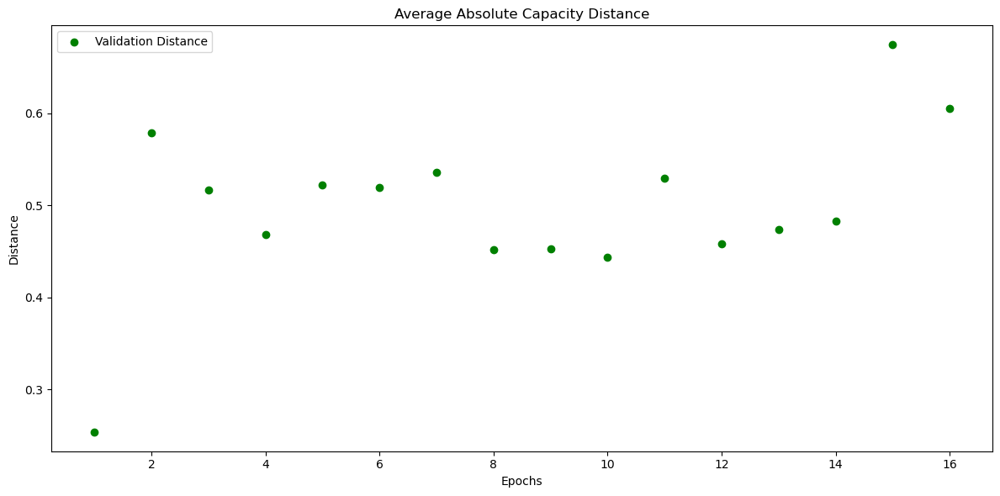

In [328]:
# B0005_combined_std
model_B0005_combined_std = CNNLSTM(input_shape=input_shape_combined)
model_B0005_combined_std, train_losses_B0005_combined_std, val_losses_B0005_combined_std, val_distances_B0005_combined_std, metrics_history_B0005_combined_std = train(data_loaders['B0005_combined_std_val_loader'], data_loaders['B0005_combined_std_train_loader'], model_B0005_combined_std)
torch.save(model_B0005_combined_std, os.path.join(folder_name, 'model_B0005_combined_std.pth'))

Test Loss: 0.4858, Test Distance: 0.7009, Test Accuracy: 0.0000, SNR: 5.6714
##Metrics##:
MAE : 0.700859010219574
MSE : 0.5080599188804626
RMSE : 0.8384982347488403
R-squared : -1379.4638671875
Count: 21


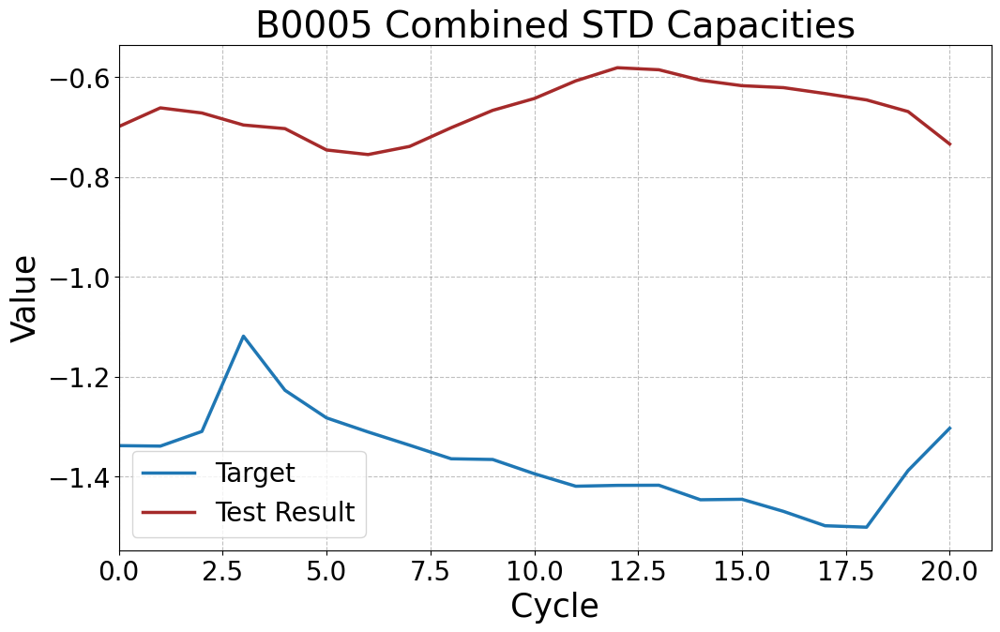

In [329]:
# B0005_combined_std
model_B0005_combined_std = torch.load('5. CNN-LSTM Models/model_B0005_combined_std.pth')
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_test_loader'])
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)
plot_tensors(y_target_B0005_combined_std, y_testresult_B0005_combined_std, labels=["Target", "Test Result"], title="B0005 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.1079, Test Distance: 0.2449, Test Accuracy: 8.0000, SNR: 9.1329
##Metrics##:
MAE : 0.24490664899349213
MSE : 0.11725564301013947
RMSE : 0.5001301765441895
R-squared : -333.7149353027344
Count: 150


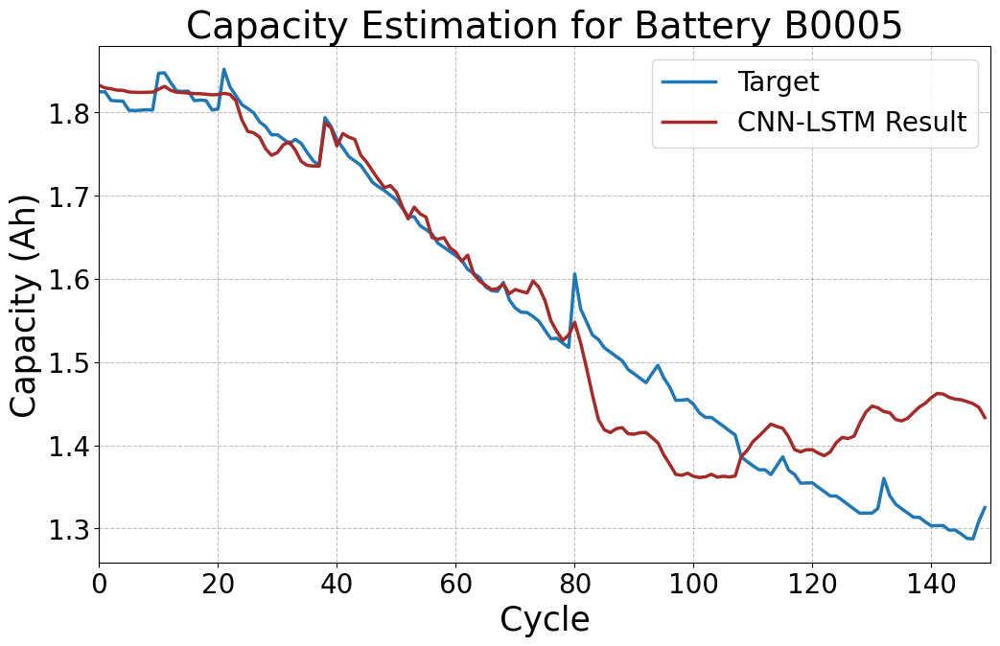

In [330]:
# Run the test on the model
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_target_B0005_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_testresult_B0005_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_std = torch.tensor(original_y_target_B0005_combined_std)
original_y_testresult_B0005_combined_std = torch.tensor(original_y_testresult_B0005_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


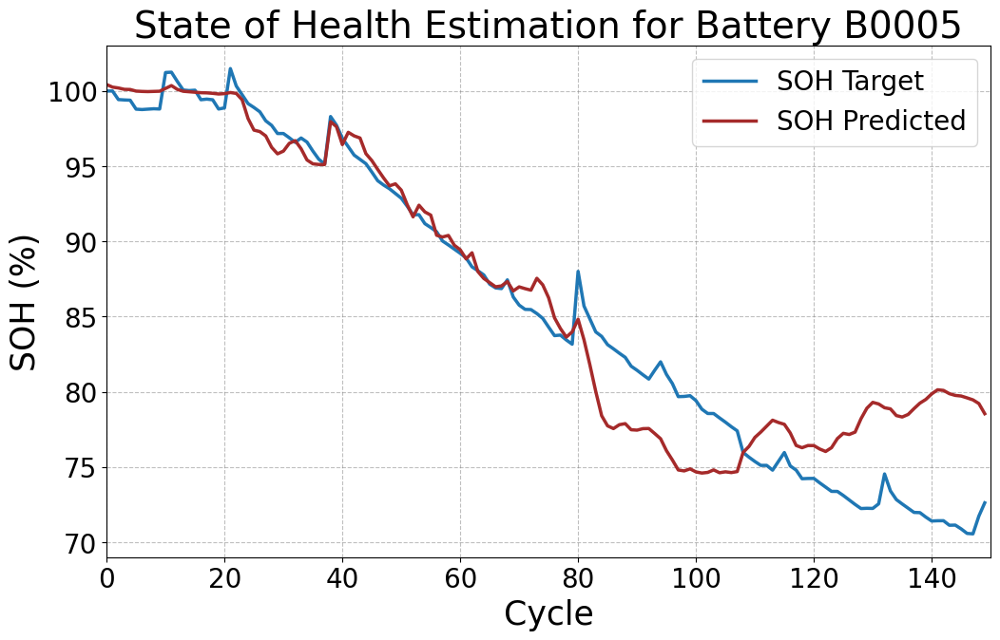

In [331]:
plot_soh(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std,"State of Health Estimation for Battery B0005", file_name="B0005_combined_std")

Model 9 - B0005 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.1909, Validation Loss: 0.0136
Validation Distance: 0.1454, Validation Accuracy: 0.0000, SNR: 11.4751
##Metrics##:
MAE : 0.10903216898441315
MSE : 0.01642158254981041
RMSE : 0.33041977882385254
R-squared : -198.24110412597656
Count: 28
Epoch 2/120, Training Loss: 0.0207, Validation Loss: 0.0529
Validation Distance: 0.2689, Validation Accuracy: 0.0000, SNR: 6.6294
##Metrics##:
MAE : 0.20167836546897888
MSE : 0.055225443094968796
RMSE : 0.4493744373321533
R-squared : -638.4635620117188
Count: 28
Epoch 3/120, Training Loss: 0.0053, Validation Loss: 0.0292
Validation Distance: 0.2020, Validation Accuracy: 0.0000, SNR: 8.8042
##Metrics##:
MAE : 0.1514851599931717
MSE : 0.031327538192272186
RMSE : 0.38959693908691406
R-squared : -360.4504089355469
Count: 28
Epoch 4/120, Training Loss: 0.0021, Validation Loss: 0.0258
Validation Distance: 0.1814, Validation Accuracy: 0.0000, SNR: 9.4156
##Metrics##:
MAE : 0.13607670366764069
MSE : 0.025386089459061623
RMSE : 0.3692

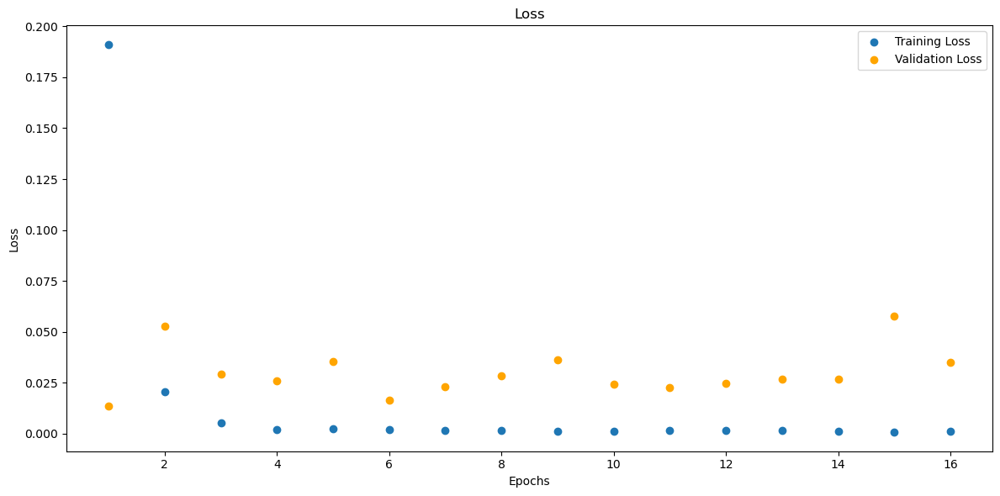

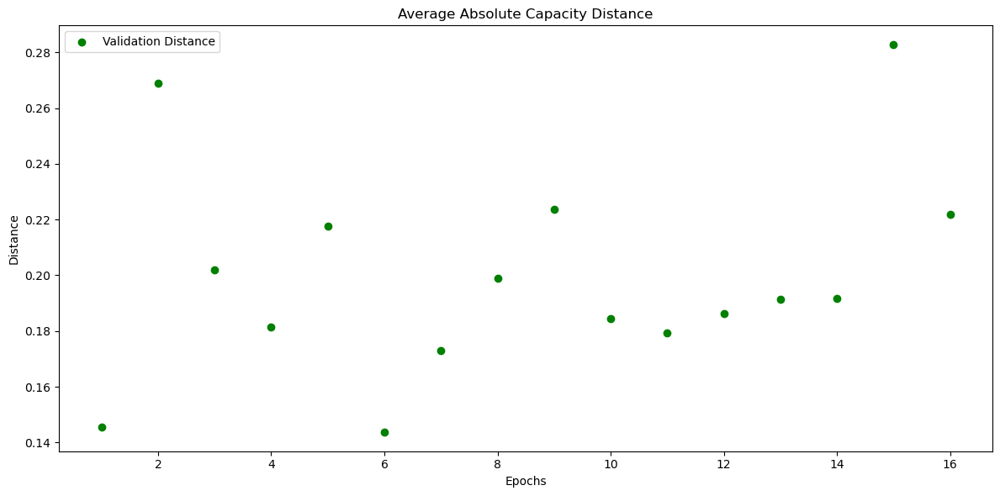

In [332]:
# B0005_combined_rob
model_B0005_combined_rob = CNNLSTM(input_shape=input_shape_combined)
model_B0005_combined_rob, train_losses_B0005_combined_rob, val_losses_B0005_combined_rob, val_distances_B0005_combined_rob, metrics_history_B0005_combined_rob = train(data_loaders['B0005_combined_rob_val_loader'], data_loaders['B0005_combined_rob_train_loader'], model_B0005_combined_rob)
torch.save(model_B0005_combined_rob, os.path.join(folder_name, 'model_B0005_combined_rob.pth'))

Test Loss: 0.0380, Test Distance: 0.2271, Test Accuracy: 0.0000, SNR: 8.8841
##Metrics##:
MAE : 0.22707782685756683
MSE : 0.05380943417549133
RMSE : 0.47761213779449463
R-squared : -548.8414916992188
Count: 21


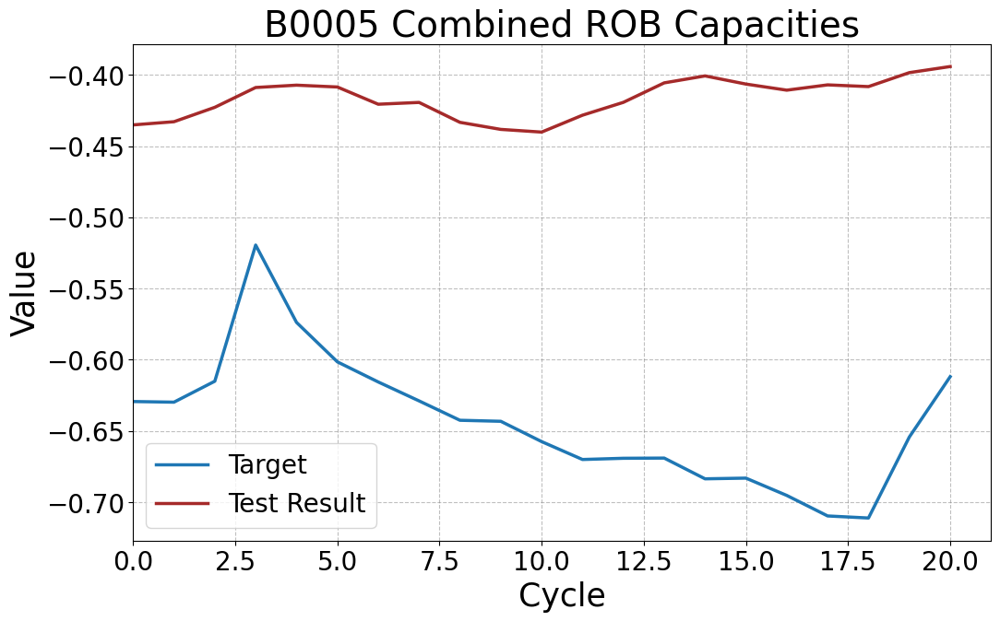

In [333]:
# B0005_combined_rob
model_B0005_combined_rob = torch.load('5. CNN-LSTM Models/model_B0005_combined_rob.pth')
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_test_loader'])
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)
plot_tensors(y_target_B0005_combined_rob, y_testresult_B0005_combined_rob, labels=["Target", "Test Result"], title="B0005 Combined ROB Capacities")


Test on complete dataset.

In [334]:
# Run the test on the model
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)

# # Assuming scaler_y_comb_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_target_B0005_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_testresult_B0005_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_combined_rob = torch.tensor(original_y_target_B0005_combined_rob)
# original_y_testresult_B0005_combined_rob = torch.tensor(original_y_testresult_B0005_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0215, Test Distance: 0.1336, Test Accuracy: 3.3333, SNR: 9.8417
##Metrics##:
MAE : 0.13364934921264648
MSE : 0.02500511333346367
RMSE : 0.3685671389102936
R-squared : -359.83221435546875
Count: 150


SOH Plot.

In [335]:
# plot_soh(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, "State of Health Estimation for Battery B0005", file_name="B0005_combined_rob")

Model 10 - B0006 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.1581, Validation Loss: 0.0055
Validation Distance: 0.0545, Validation Accuracy: 4.7619, SNR: 2.8763
##Metrics##:
MAE : 0.040852274745702744
MSE : 0.00278870714828372
RMSE : 0.20354965329170227
R-squared : -170.85000610351562
Count: 28
Epoch 2/120, Training Loss: 0.0162, Validation Loss: 0.0131
Validation Distance: 0.1239, Validation Accuracy: 0.0000, SNR: -0.3120
##Metrics##:
MAE : 0.09289515018463135
MSE : 0.01215076632797718
RMSE : 0.30505210161209106
R-squared : -728.8009033203125
Count: 28
Epoch 3/120, Training Loss: 0.0116, Validation Loss: 0.0461
Validation Distance: 0.2309, Validation Accuracy: 0.0000, SNR: -4.8961
##Metrics##:
MAE : 0.17320962250232697
MSE : 0.04076920077204704
RMSE : 0.4163006544113159
R-squared : -2379.106689453125
Count: 28
Epoch 4/120, Training Loss: 0.0078, Validation Loss: 0.0271
Validation Distance: 0.1777, Validation Accuracy: 0.0000, SNR: -3.0510
##Metrics##:
MAE : 0.13330164551734924
MSE : 0.02455836534500122
RMSE : 0.365

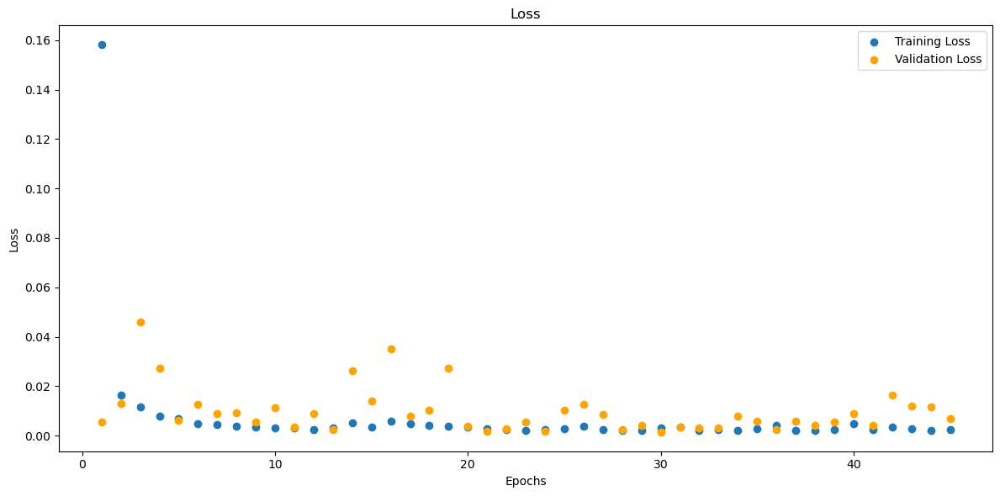

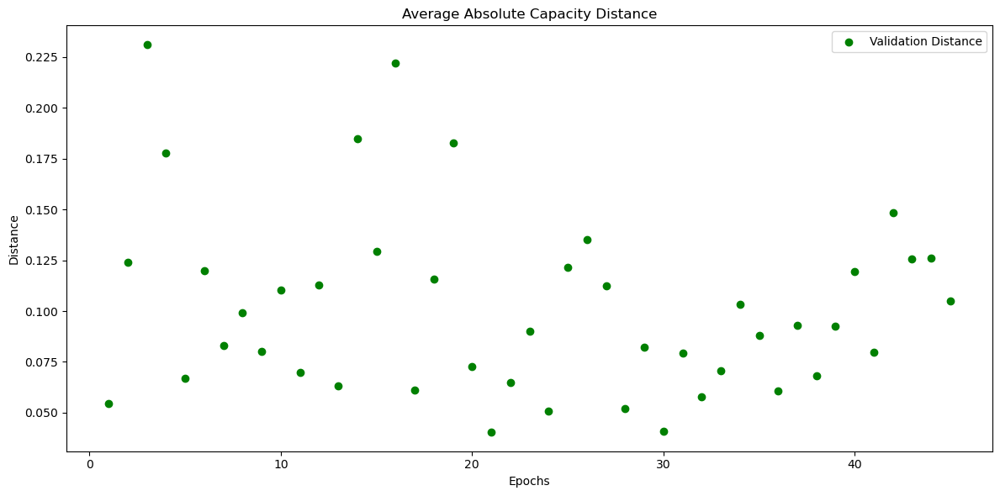

In [336]:
# B0006_charge_mm
model_B0006_charge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0006_charge_mm, train_losses_B0006_charge_mm, val_losses_B0006_charge_mm, val_distances_B0006_charge_mm, metrics_history_B0006_charge_mm = train(data_loaders['B0006_charge_mm_val_loader'], data_loaders['B0006_charge_mm_train_loader'], model_B0006_charge_mm)
torch.save(model_B0006_charge_mm, os.path.join(folder_name, 'model_B0006_charge_mm.pth'))

Test Loss: 0.0266, Test Distance: 0.1809, Test Accuracy: 0.0000, SNR: -7.6671
##Metrics##:
MAE : 0.1808789074420929
MSE : 0.03488851338624954
RMSE : 0.42571088671684265
R-squared : -1165.150146484375
Count: 21


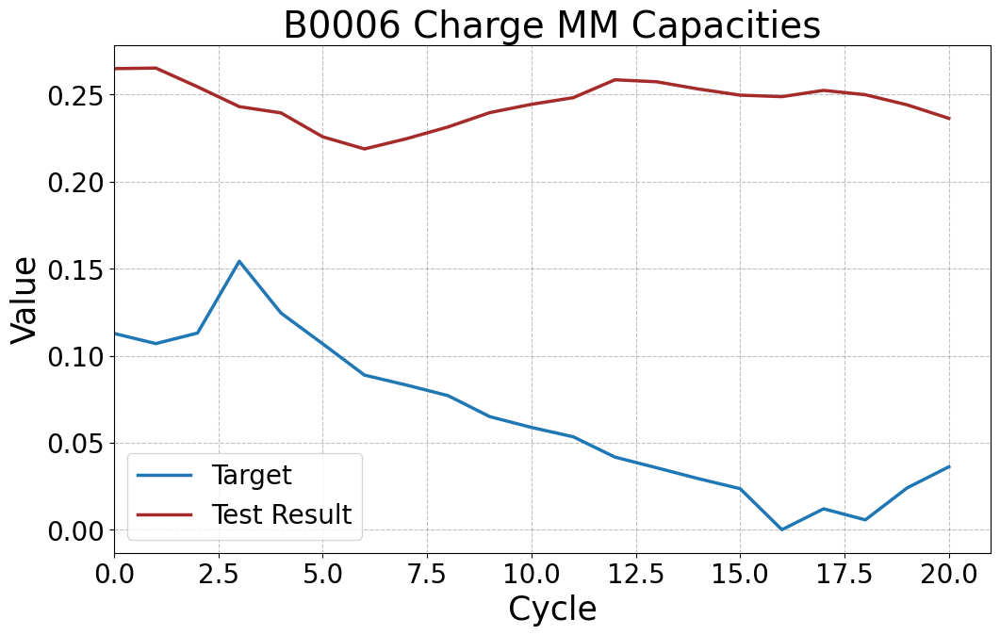

In [337]:
# B0006_charge_mm
model_B0006_charge_mm = torch.load('5. CNN-LSTM Models/model_B0006_charge_mm.pth')
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_test_loader'])
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)
plot_tensors(y_target_B0006_charge_mm, y_testresult_B0006_charge_mm, labels=["Target", "Test Result"], title="B0006 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0059, Test Distance: 0.0580, Test Accuracy: 14.6667, SNR: 15.6475
##Metrics##:
MAE : 0.05804716795682907
MSE : 0.006920791696757078
RMSE : 0.24595895409584045
R-squared : -207.31600952148438
Count: 150


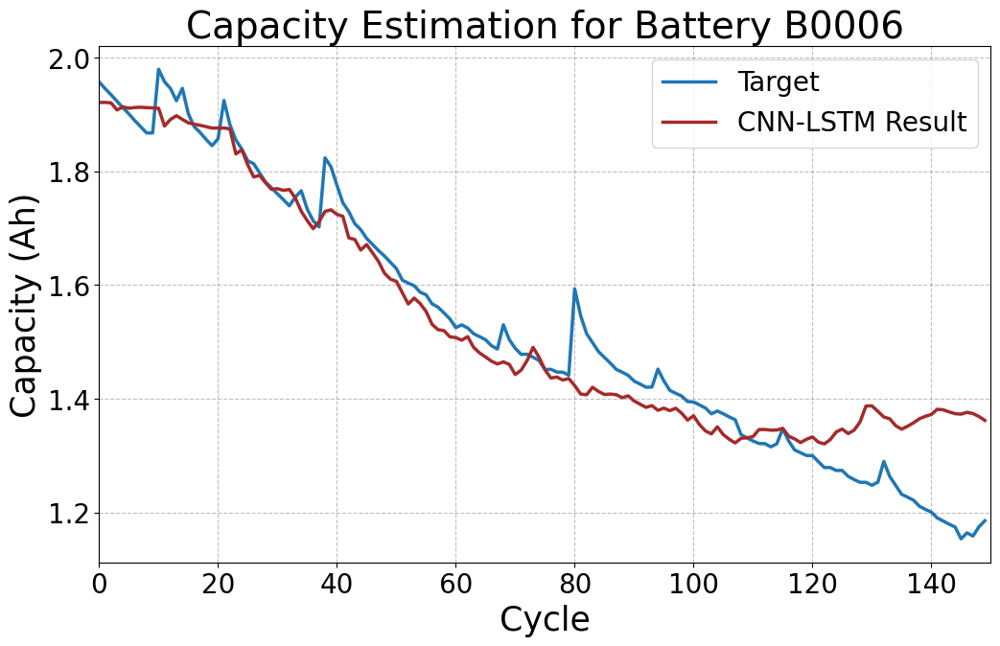

In [338]:
# Run the test on the model
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_target_B0006_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_testresult_B0006_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_mm = torch.tensor(original_y_target_B0006_charge_mm)
original_y_testresult_B0006_charge_mm = torch.tensor(original_y_testresult_B0006_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


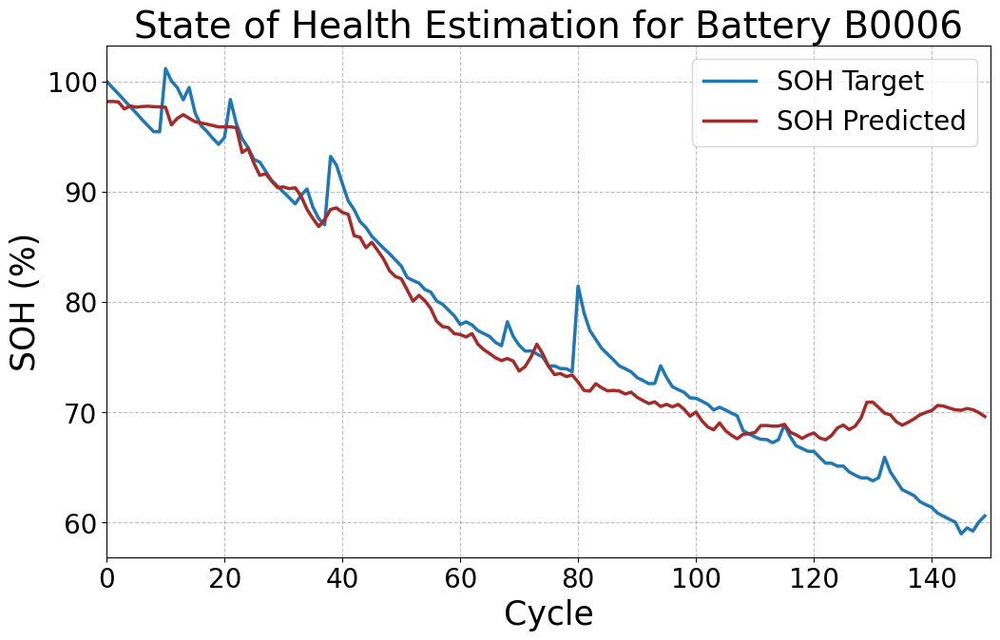

In [339]:
plot_soh(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_charge_mm")

Model 11 - B0006 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.4473, Validation Loss: 0.1420
Validation Distance: 0.4195, Validation Accuracy: 0.0000, SNR: 6.0871
##Metrics##:
MAE : 0.3146369159221649
MSE : 0.14796482026576996
RMSE : 0.5622652173042297
R-squared : -741.0142822265625
Count: 28
Epoch 2/120, Training Loss: 0.0487, Validation Loss: 0.2553
Validation Distance: 0.5747, Validation Accuracy: 0.0000, SNR: 3.8304
##Metrics##:
MAE : 0.43102821707725525
MSE : 0.2640961706638336
RMSE : 0.657296359539032
R-squared : -1270.72265625
Count: 28
Epoch 3/120, Training Loss: 0.0372, Validation Loss: 0.1760
Validation Distance: 0.4834, Validation Accuracy: 0.0000, SNR: 5.2738
##Metrics##:
MAE : 0.36256471276283264
MSE : 0.18755491077899933
RMSE : 0.6027490496635437
R-squared : -888.7532348632812
Count: 28
Epoch 4/120, Training Loss: 0.0281, Validation Loss: 0.1892
Validation Distance: 0.5041, Validation Accuracy: 0.0000, SNR: 5.0097
##Metrics##:
MAE : 0.37806230783462524
MSE : 0.20265686511993408
RMSE : 0.6154662370681763


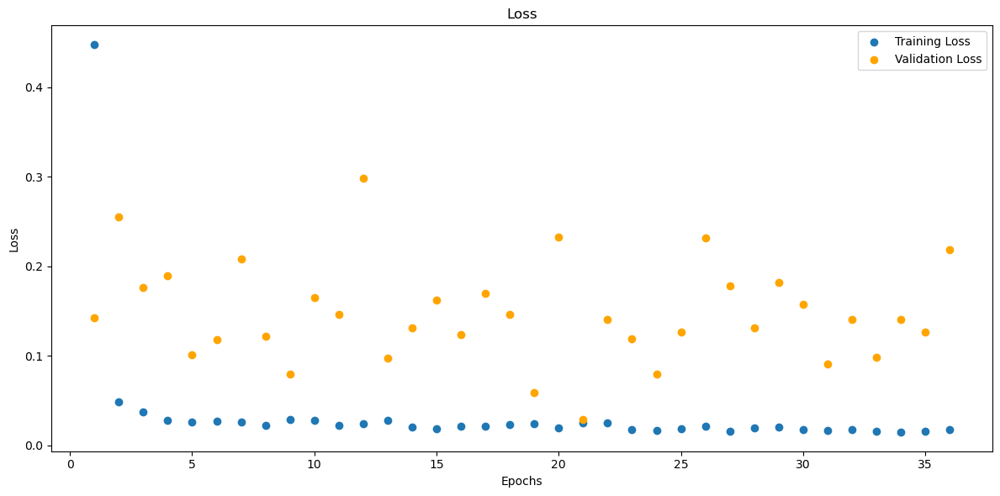

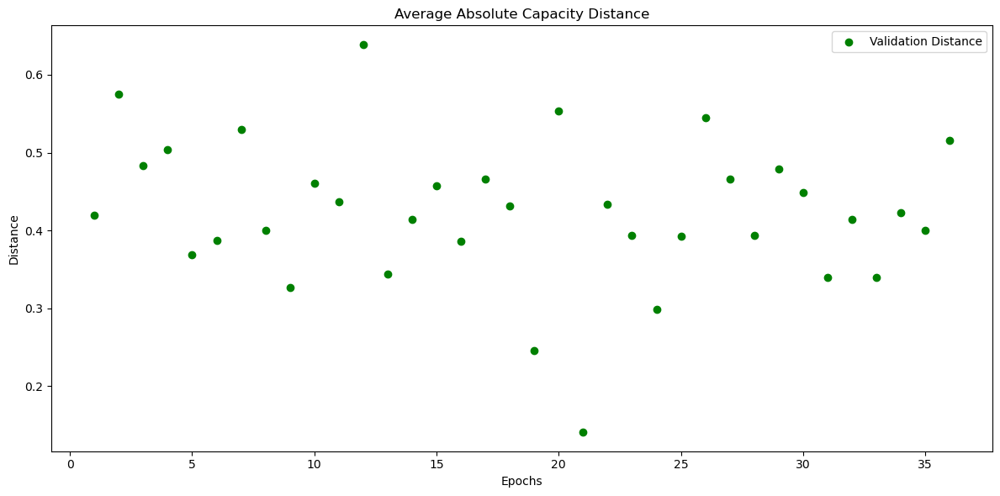

In [340]:
# B0006_charge_std
model_B0006_charge_std = CNNLSTM(input_shape=input_shape_single)
model_B0006_charge_std, train_losses_B0006_charge_std, val_losses_B0006_charge_std, val_distances_B0006_charge_std, metrics_history_B0006_charge_std = train(data_loaders['B0006_charge_std_val_loader'], data_loaders['B0006_charge_std_train_loader'], model_B0006_charge_std)
torch.save(model_B0006_charge_std, os.path.join(folder_name, 'model_B0006_charge_std.pth'))

Test Loss: 0.3755, Test Distance: 0.6768, Test Accuracy: 0.0000, SNR: 5.7196
##Metrics##:
MAE : 0.6768129467964172
MSE : 0.48580414056777954
RMSE : 0.8239451050758362
R-squared : -1186.1048583984375
Count: 21


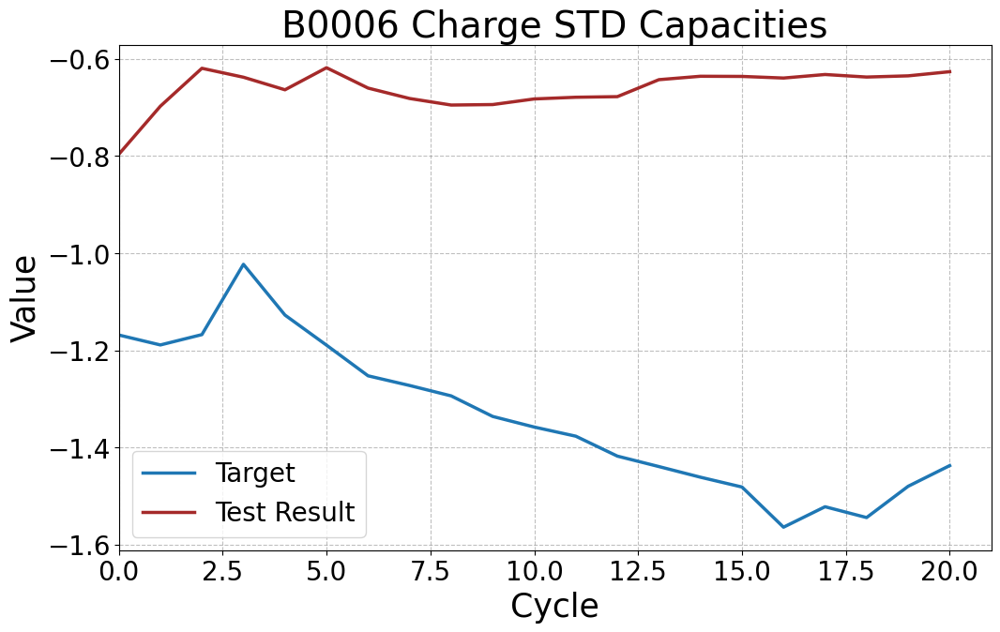

In [341]:
# B0006_charge_std
model_B0006_charge_std = torch.load('5. CNN-LSTM Models/model_B0006_charge_std.pth')
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_test_loader'])
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)
plot_tensors(y_target_B0006_charge_std, y_testresult_B0006_charge_std, labels=["Target", "Test Result"], title="B0006 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.0891, Test Distance: 0.2486, Test Accuracy: 6.6667, SNR: 9.1327
##Metrics##:
MAE : 0.24856142699718475
MSE : 0.10848946869373322
RMSE : 0.5051655173301697
R-squared : -259.2256774902344
Count: 150


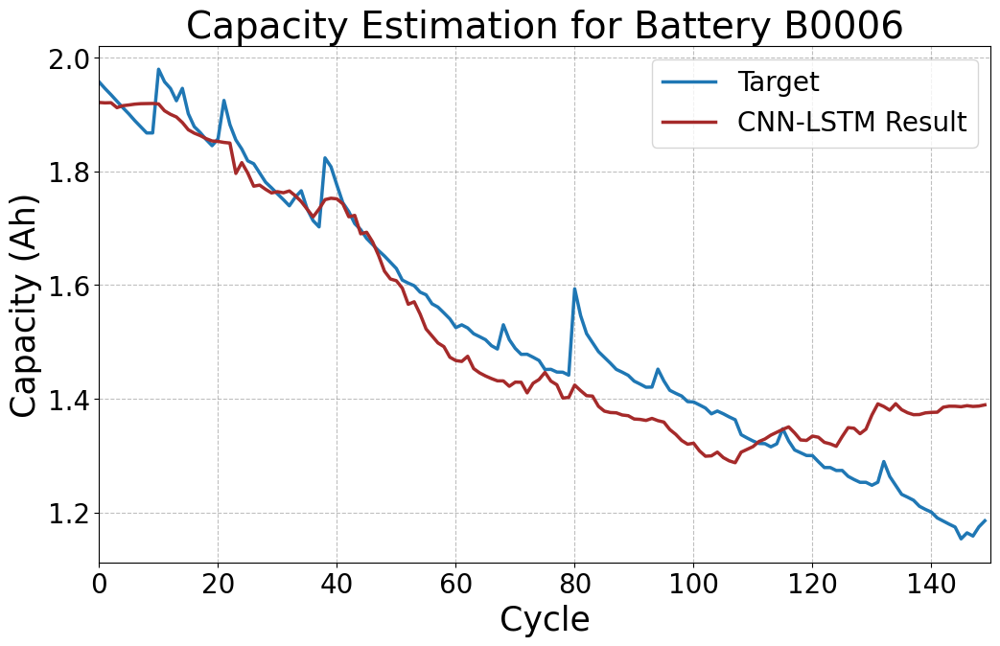

In [342]:
# Run the test on the model
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_target_B0006_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_testresult_B0006_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_std = torch.tensor(original_y_target_B0006_charge_std)
original_y_testresult_B0006_charge_std = torch.tensor(original_y_testresult_B0006_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


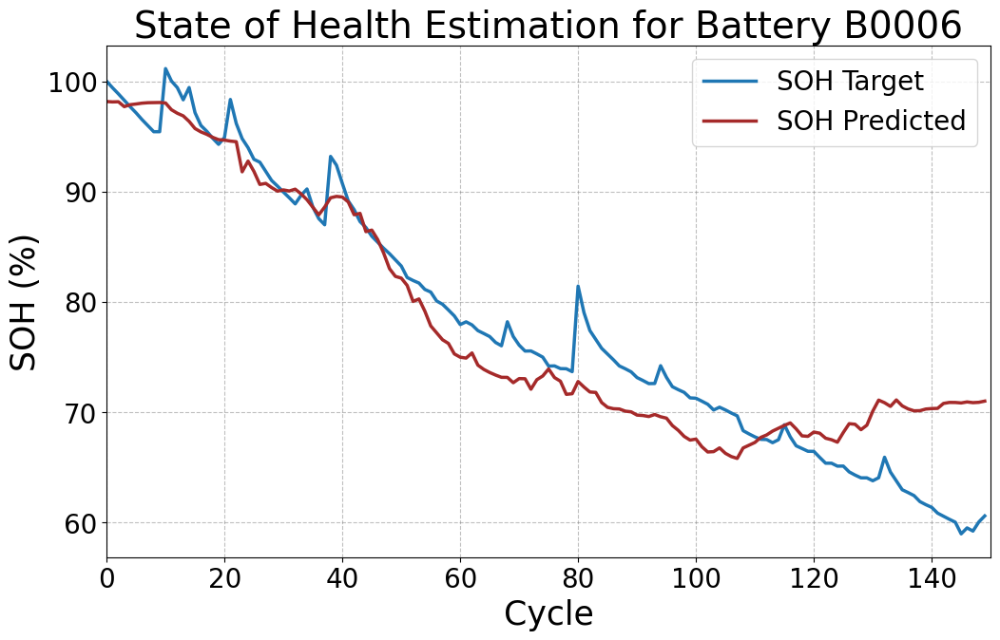

In [343]:
plot_soh(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, "State of Health Estimation for Battery B0006", file_name="B0006_charge_std")

Model 12 - B0006 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2196, Validation Loss: 0.1610
Validation Distance: 0.4706, Validation Accuracy: 0.0000, SNR: -0.2491
##Metrics##:
MAE : 0.3529655337333679
MSE : 0.17016765475273132
RMSE : 0.5943658947944641
R-squared : -2158.790771484375
Count: 28
Epoch 2/120, Training Loss: 0.0160, Validation Loss: 0.0509
Validation Distance: 0.2560, Validation Accuracy: 0.0000, SNR: 3.9030
##Metrics##:
MAE : 0.1920083910226822
MSE : 0.05298266559839249
RMSE : 0.4395311176776886
R-squared : -638.4296875
Count: 28
Epoch 3/120, Training Loss: 0.0093, Validation Loss: 0.0484
Validation Distance: 0.2541, Validation Accuracy: 0.0000, SNR: 4.1439
##Metrics##:
MAE : 0.19054187834262848
MSE : 0.0520896315574646
RMSE : 0.4381420612335205
R-squared : -622.9078979492188
Count: 28
Epoch 4/120, Training Loss: 0.0087, Validation Loss: 0.0678
Validation Distance: 0.3003, Validation Accuracy: 0.0000, SNR: 2.8188
##Metrics##:
MAE : 0.22520029544830322
MSE : 0.07217852026224136
RMSE : 0.47553399205207825


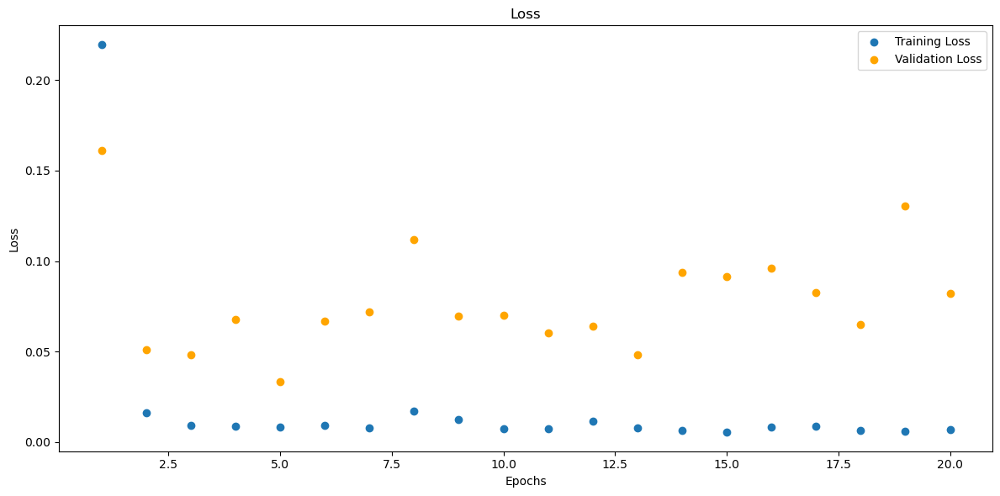

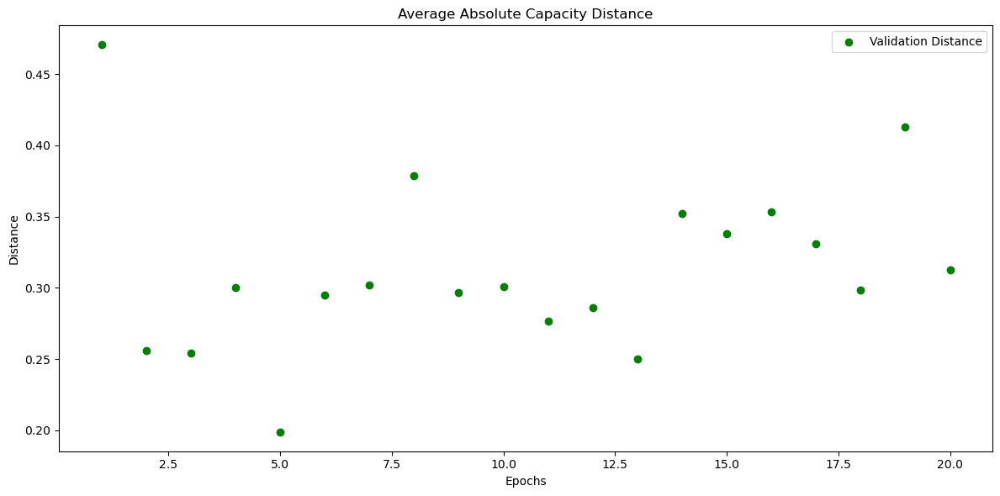

In [344]:
# B0006_charge_rob
model_B0006_charge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0006_charge_rob, train_losses_B0006_charge_rob, val_losses_B0006_charge_rob, val_distances_B0006_charge_rob, metrics_history_B0006_charge_rob = train(data_loaders['B0006_charge_rob_val_loader'], data_loaders['B0006_charge_rob_train_loader'], model_B0006_charge_rob)
torch.save(model_B0006_charge_rob, os.path.join(folder_name, 'model_B0006_charge_rob.pth'))

Test Loss: 0.2460, Test Distance: 0.5075, Test Accuracy: 0.0000, SNR: 2.1055
##Metrics##:
MAE : 0.5075331926345825
MSE : 0.26881465315818787
RMSE : 0.7132138013839722
R-squared : -1897.2667236328125
Count: 21


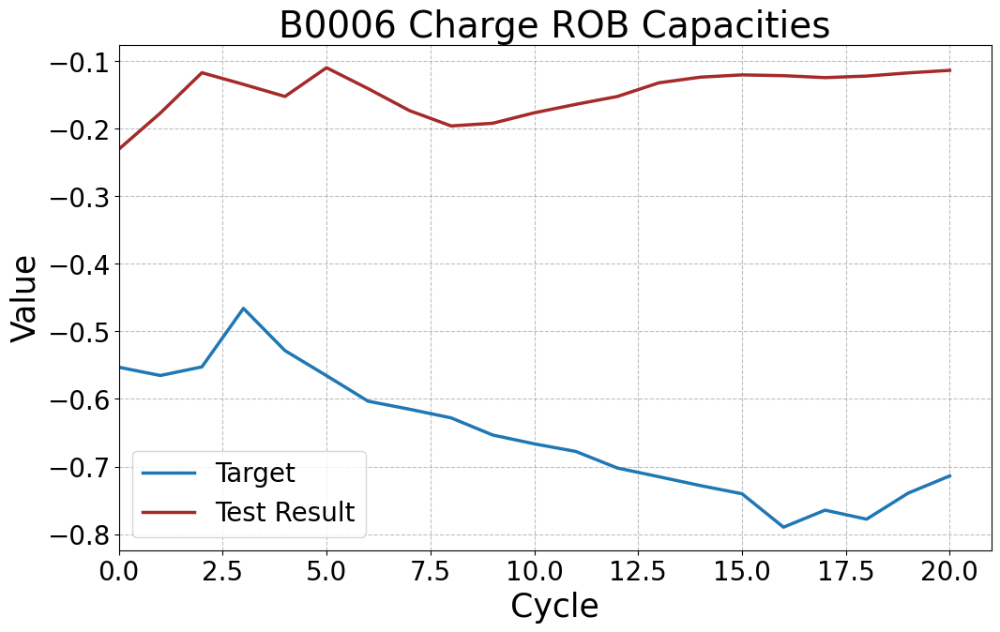

In [345]:
# B0006_charge_rob
model_B0006_charge_rob = torch.load('5. CNN-LSTM Models/model_B0006_charge_rob.pth')
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_test_loader'])
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)
plot_tensors(y_target_B0006_charge_rob, y_testresult_B0006_charge_rob, labels=["Target", "Test Result"], title="B0006 Charge ROB Capacities")


Test on complete dataset.

In [346]:
# Run the test on the model
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)

# # Assuming scaler_y_charge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_target_B0006_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_testresult_B0006_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_charge_rob = torch.tensor(original_y_target_B0006_charge_rob)
# original_y_testresult_B0006_charge_rob = torch.tensor(original_y_testresult_B0006_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0466, Test Distance: 0.1515, Test Accuracy: 3.3333, SNR: 8.1446
##Metrics##:
MAE : 0.15153709053993225
MSE : 0.05030409246683121
RMSE : 0.39600837230682373
R-squared : -363.4767761230469
Count: 150


SOH Plot.

In [347]:
# plot_soh(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_charge_rob")

Model 13 - B0006 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.0818, Validation Loss: 0.0210
Validation Distance: 0.1899, Validation Accuracy: 0.0000, SNR: -2.2605
##Metrics##:
MAE : 0.14242467284202576
MSE : 0.027961555868387222
RMSE : 0.3775392174720764
R-squared : -1632.9705810546875
Count: 28
Epoch 2/120, Training Loss: 0.0031, Validation Loss: 0.0031
Validation Distance: 0.0693, Validation Accuracy: 0.0000, SNR: 3.7641
##Metrics##:
MAE : 0.051943015307188034
MSE : 0.004468974191695452
RMSE : 0.2287404090166092
R-squared : -279.1942443847656
Count: 28
Epoch 3/120, Training Loss: 0.0026, Validation Loss: 0.0162
Validation Distance: 0.1491, Validation Accuracy: 0.0000, SNR: -1.3120
##Metrics##:
MAE : 0.11178947985172272
MSE : 0.0174747034907341
RMSE : 0.33454430103302
R-squared : -1031.2410888671875
Count: 28
Epoch 4/120, Training Loss: 0.0023, Validation Loss: 0.0063
Validation Distance: 0.0945, Validation Accuracy: 0.0000, SNR: 1.8429
##Metrics##:
MAE : 0.07089774310588837
MSE : 0.00743316113948822
RMSE : 0.266665

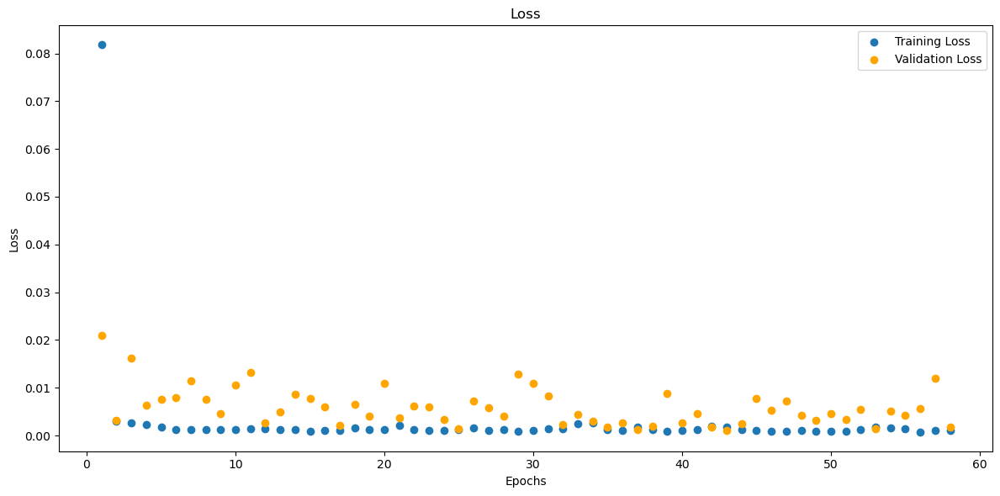

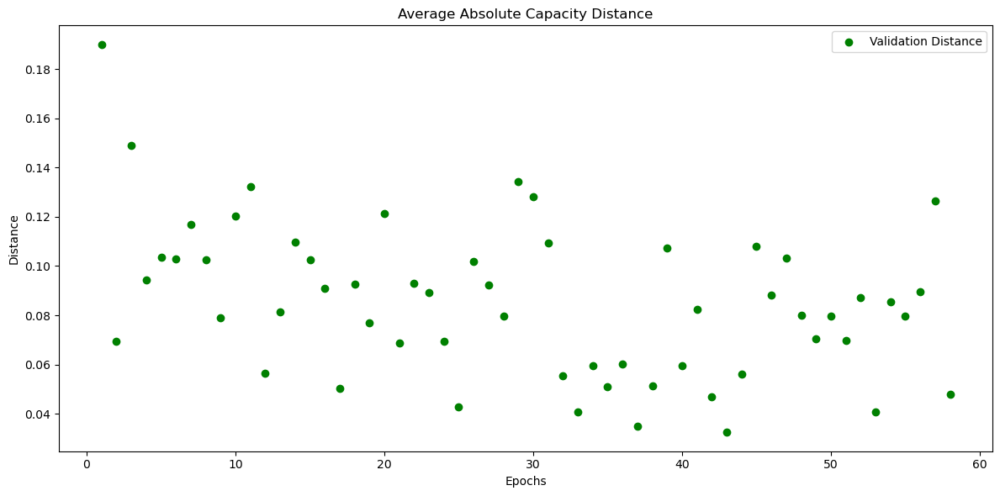

In [348]:
# B0006_discharge_mm
model_B0006_discharge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0006_discharge_mm, train_losses_B0006_discharge_mm, val_losses_B0006_discharge_mm, val_distances_B0006_discharge_mm, metrics_history_B0006_discharge_mm = train(data_loaders['B0006_discharge_mm_val_loader'], data_loaders['B0006_discharge_mm_train_loader'], model_B0006_discharge_mm)
torch.save(model_B0006_discharge_mm, os.path.join(folder_name, 'model_B0006_discharge_mm.pth'))

Test Loss: 0.0122, Test Distance: 0.1260, Test Accuracy: 0.0000, SNR: -4.5691
##Metrics##:
MAE : 0.12599489092826843
MSE : 0.017095491290092468
RMSE : 0.35538631677627563
R-squared : -500.1273193359375
Count: 21


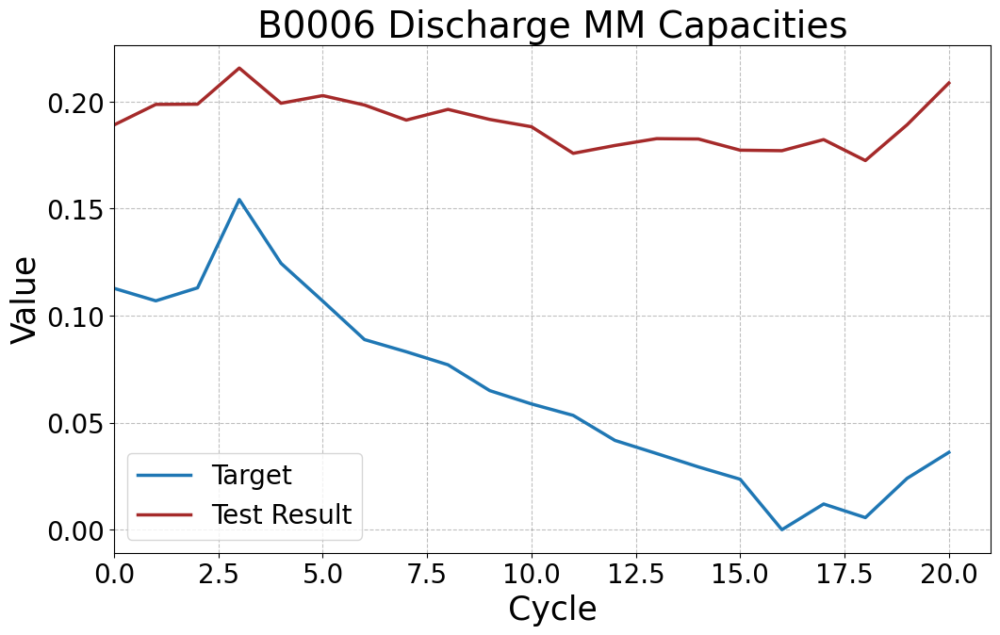

In [349]:
# B0006_discharge_mm
model_B0006_discharge_mm = torch.load('5. CNN-LSTM Models/model_B0006_discharge_mm.pth')
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_test_loader'])
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)
plot_tensors(y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm, labels=["Target", "Test Result"], title="B0006 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0033, Test Distance: 0.0508, Test Accuracy: 18.0000, SNR: 17.9047
##Metrics##:
MAE : 0.05083020031452179
MSE : 0.004115585703402758
RMSE : 0.22743506729602814
R-squared : -132.55703735351562
Count: 150


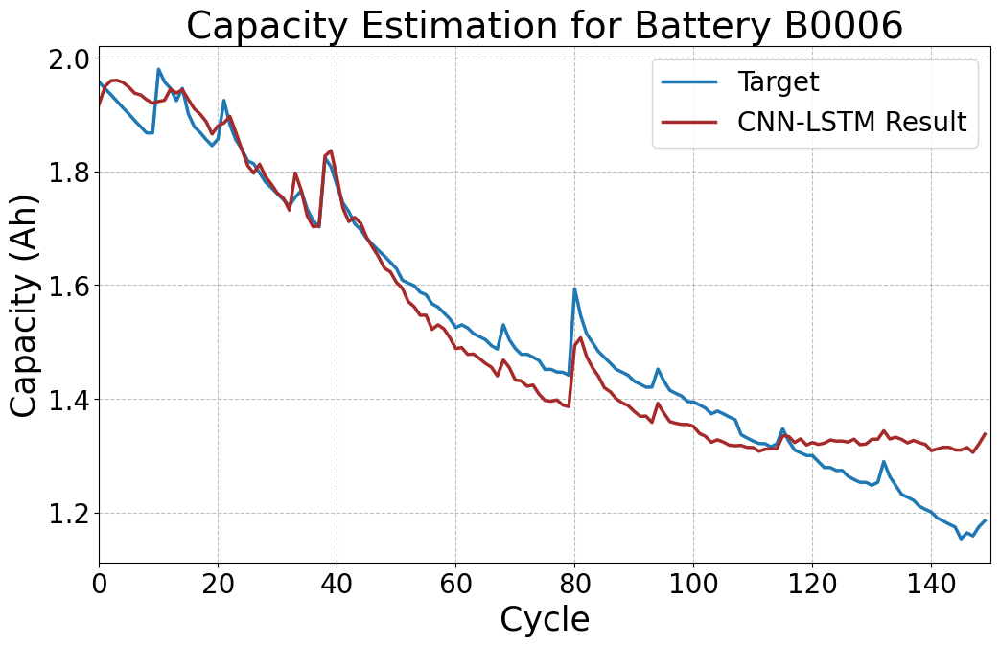

In [350]:
# Run the test on the model
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_target_B0006_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_testresult_B0006_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_mm = torch.tensor(original_y_target_B0006_discharge_mm)
original_y_testresult_B0006_discharge_mm = torch.tensor(original_y_testresult_B0006_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


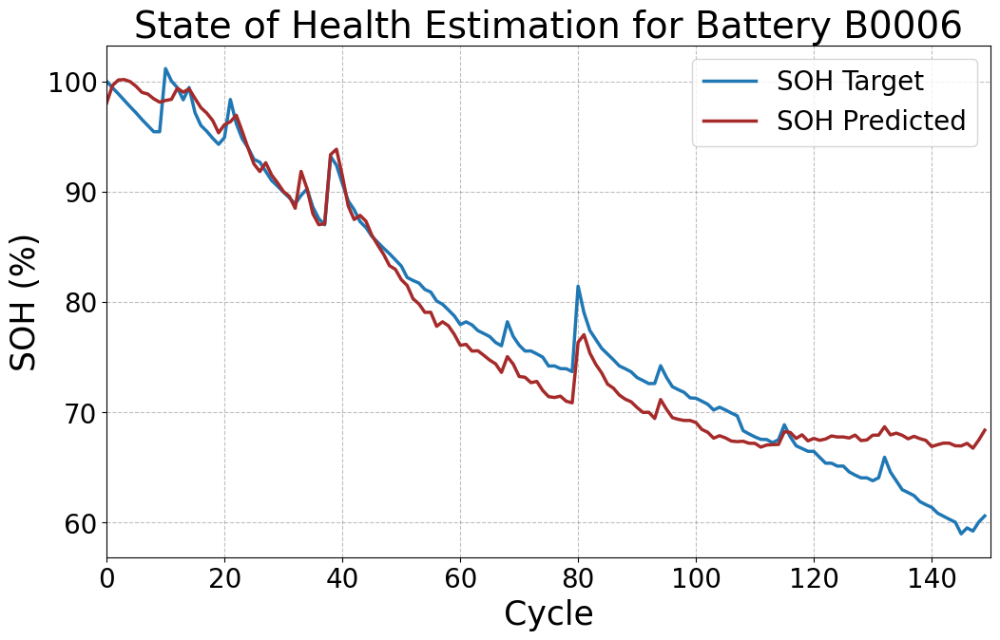

In [351]:
plot_soh(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_mm")

Model 14 - B0006 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2097, Validation Loss: 0.2455
Validation Distance: 0.5764, Validation Accuracy: 0.0000, SNR: 4.9678
##Metrics##:
MAE : 0.4322633445262909
MSE : 0.25285446643829346
RMSE : 0.6576835513114929
R-squared : -1185.9716796875
Count: 28
Epoch 2/120, Training Loss: 0.0327, Validation Loss: 0.0651
Validation Distance: 0.2908, Validation Accuracy: 0.0000, SNR: 9.8915
##Metrics##:
MAE : 0.21810577809810638
MSE : 0.06614656001329422
RMSE : 0.4674583673477173
R-squared : -318.2530212402344
Count: 28
Epoch 3/120, Training Loss: 0.0171, Validation Loss: 0.1635
Validation Distance: 0.4603, Validation Accuracy: 0.0000, SNR: 6.6709
##Metrics##:
MAE : 0.3452529013156891
MSE : 0.16137942671775818
RMSE : 0.5877581834793091
R-squared : -757.2664184570312
Count: 28
Epoch 4/120, Training Loss: 0.0133, Validation Loss: 0.0472
Validation Distance: 0.2538, Validation Accuracy: 0.0000, SNR: 10.6702
##Metrics##:
MAE : 0.19036643207073212
MSE : 0.05215642228722572
RMSE : 0.4367952048778

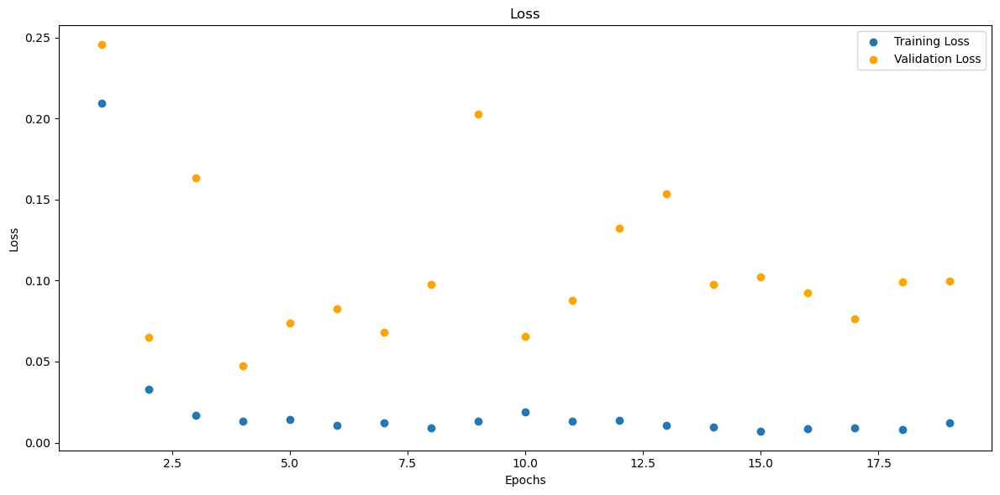

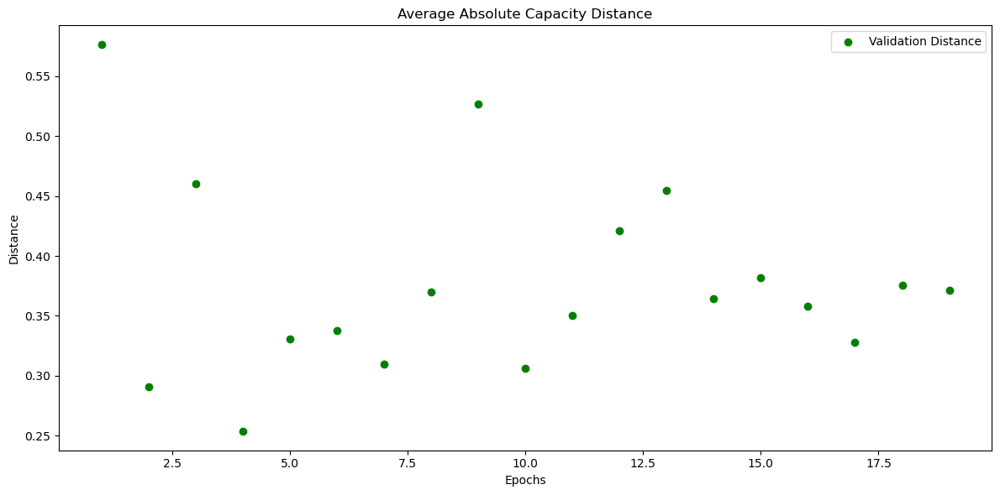

In [366]:
# B0006_discharge_std
model_B0006_discharge_std = CNNLSTM(input_shape=input_shape_single)
model_B0006_discharge_std, train_losses_B0006_discharge_std, val_losses_B0006_discharge_std, val_distances_B0006_discharge_std, metrics_history_B0006_discharge_std = train(data_loaders['B0006_discharge_std_val_loader'], data_loaders['B0006_discharge_std_train_loader'], model_B0006_discharge_std)
torch.save(model_B0006_discharge_std, os.path.join(folder_name, 'model_B0006_discharge_std.pth'))

Test Loss: 0.2132, Test Distance: 0.5346, Test Accuracy: 0.0000, SNR: 7.7886
##Metrics##:
MAE : 0.5346001386642456
MSE : 0.30168771743774414
RMSE : 0.7317610383033752
R-squared : -772.8875122070312
Count: 21


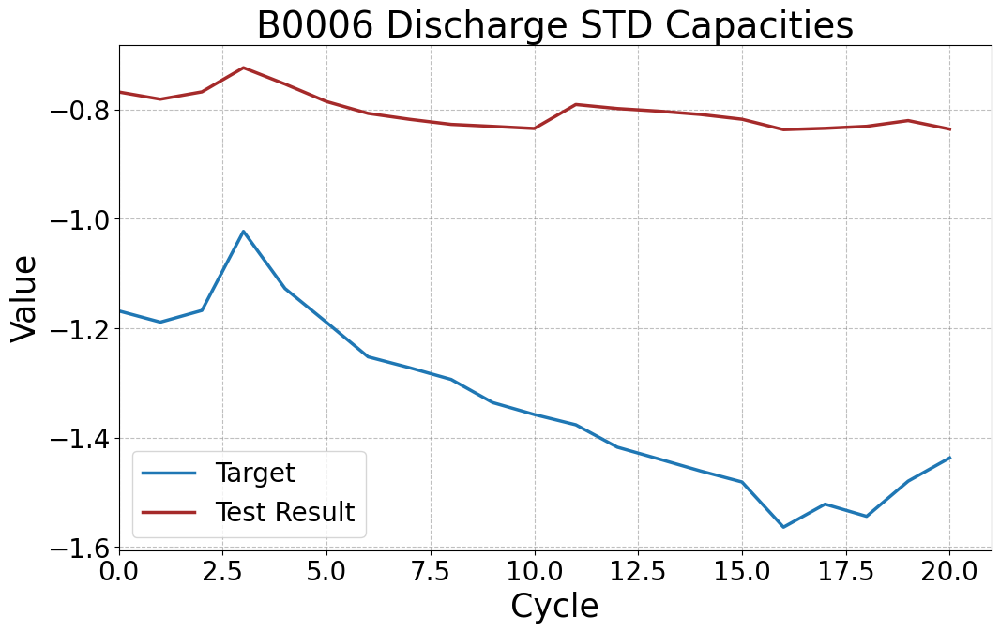

In [367]:
# B0006_discharge_std
model_B0006_discharge_std = torch.load('5. CNN-LSTM Models/model_B0006_discharge_std.pth')
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_test_loader'])
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)
plot_tensors(y_target_B0006_discharge_std, y_testresult_B0006_discharge_std, labels=["Target", "Test Result"], title="B0006 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.0449, Test Distance: 0.1633, Test Accuracy: 9.3333, SNR: 11.7764
##Metrics##:
MAE : 0.1632501184940338
MSE : 0.05902273952960968
RMSE : 0.4092552065849304
R-squared : -161.5989990234375
Count: 150


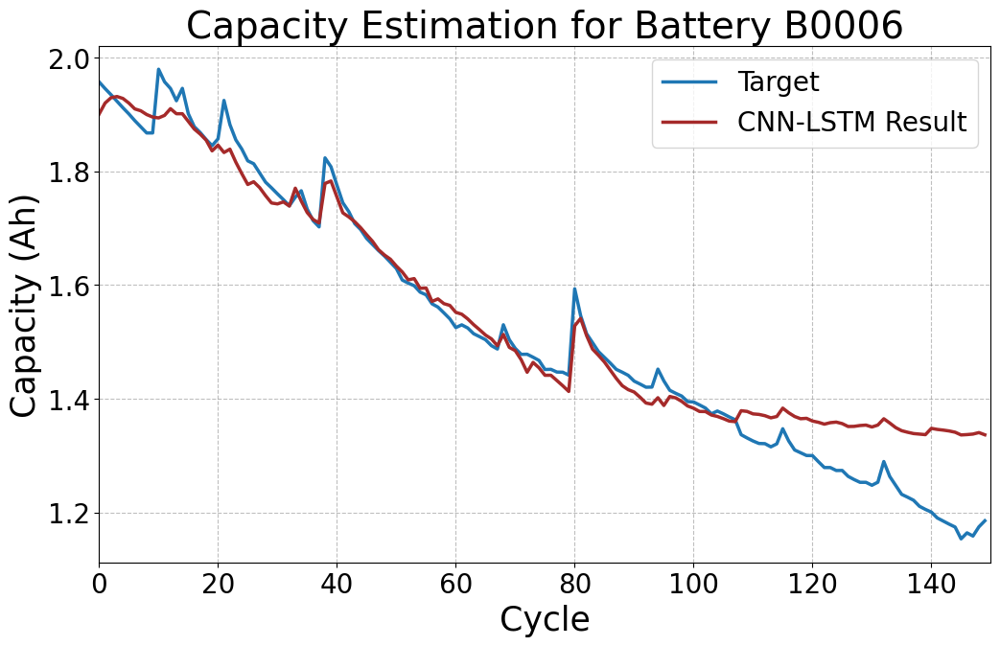

In [368]:
# Run the test on the model
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_target_B0006_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_testresult_B0006_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_std = torch.tensor(original_y_target_B0006_discharge_std)
original_y_testresult_B0006_discharge_std = torch.tensor(original_y_testresult_B0006_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


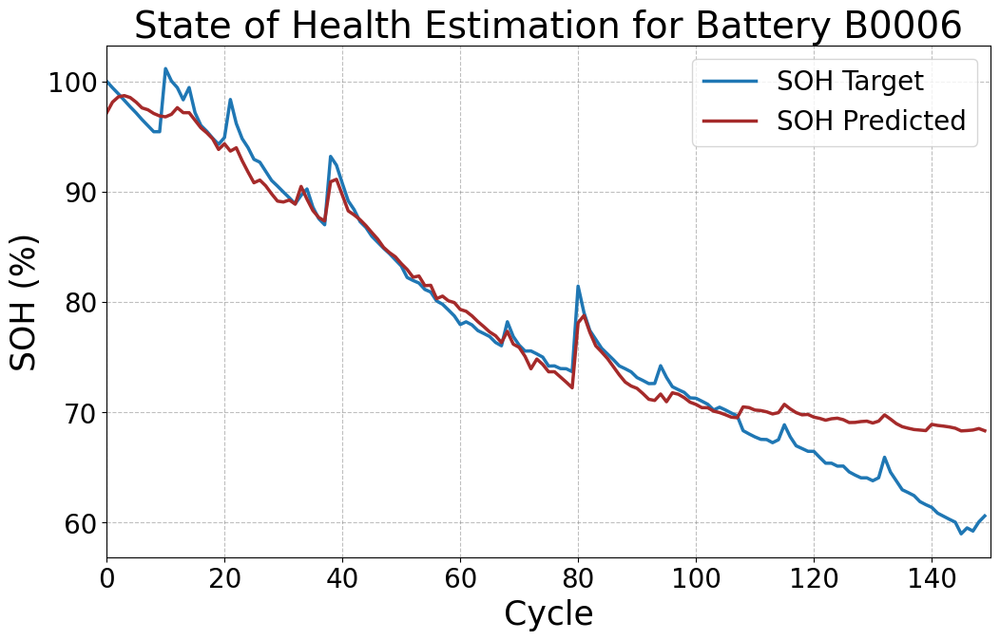

In [369]:
plot_soh(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_std")

Model 15 - B0006 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.1841, Validation Loss: 0.0461
Validation Distance: 0.2458, Validation Accuracy: 0.0000, SNR: 5.0555
##Metrics##:
MAE : 0.18438617885112762
MSE : 0.0469113327562809
RMSE : 0.4298594295978546
R-squared : -634.3910522460938
Count: 28
Epoch 2/120, Training Loss: 0.0220, Validation Loss: 0.0509
Validation Distance: 0.2616, Validation Accuracy: 0.0000, SNR: 4.4957
##Metrics##:
MAE : 0.19619104266166687
MSE : 0.053238190710544586
RMSE : 0.44331738352775574
R-squared : -715.9467163085938
Count: 28
Epoch 3/120, Training Loss: 0.0118, Validation Loss: 0.0253
Validation Distance: 0.1826, Validation Accuracy: 0.0000, SNR: 6.4631
##Metrics##:
MAE : 0.1369459182024002
MSE : 0.027627404779195786
RMSE : 0.37083935737609863
R-squared : -385.1351013183594
Count: 28
Epoch 4/120, Training Loss: 0.0058, Validation Loss: 0.0105
Validation Distance: 0.1148, Validation Accuracy: 4.7619, SNR: 9.1603
##Metrics##:
MAE : 0.08607174456119537
MSE : 0.013071690686047077
RMSE : 0.2957328

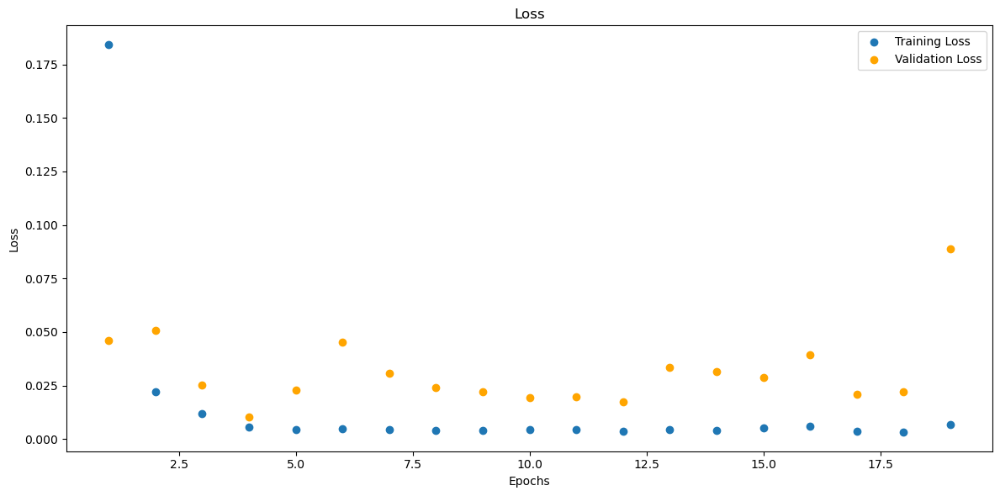

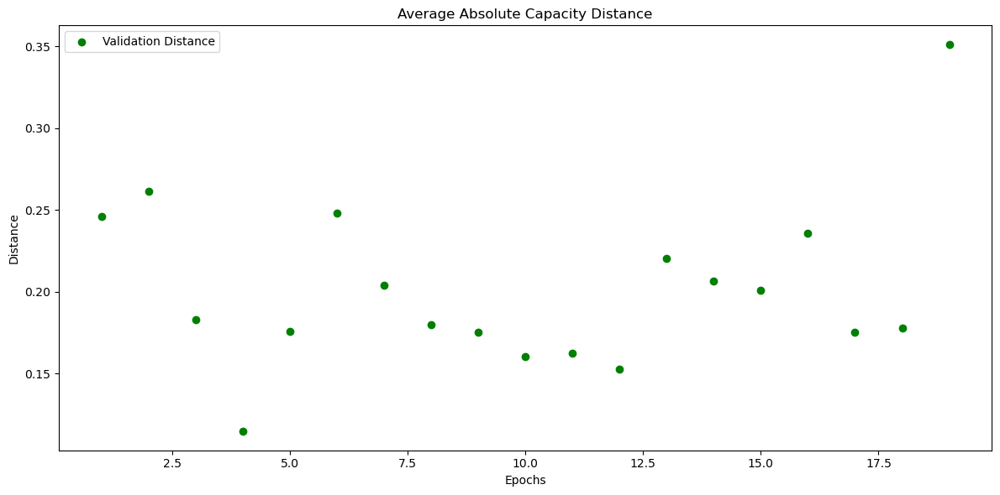

In [370]:
# B0006_discharge_rob
model_B0006_discharge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0006_discharge_rob, train_losses_B0006_discharge_rob, val_losses_B0006_discharge_rob, val_distances_B0006_discharge_rob, metrics_history_B0006_discharge_rob = train(data_loaders['B0006_discharge_rob_val_loader'], data_loaders['B0006_discharge_rob_train_loader'], model_B0006_discharge_rob)
torch.save(model_B0006_discharge_rob, os.path.join(folder_name, 'model_B0006_discharge_rob.pth'))

Test Loss: 0.0643, Test Distance: 0.2701, Test Accuracy: 0.0000, SNR: 7.5861
##Metrics##:
MAE : 0.2701185941696167
MSE : 0.0761016234755516
RMSE : 0.5202713012695312
R-squared : -597.7150268554688
Count: 21


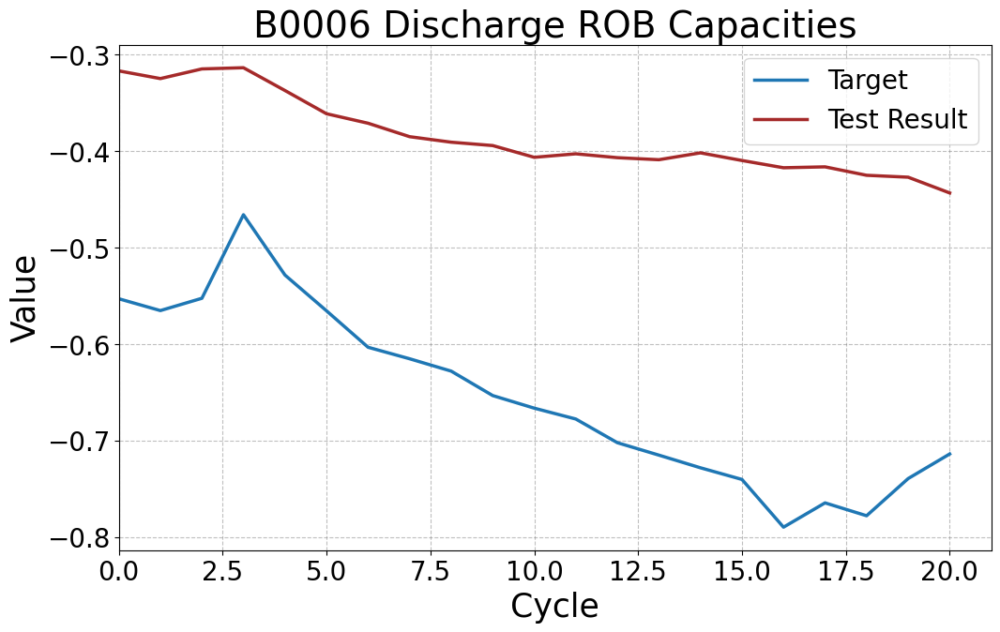

In [371]:
# B0006_discharge_rob
model_B0006_discharge_rob = torch.load('5. CNN-LSTM Models/model_B0006_discharge_rob.pth')
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_test_loader'])
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)
plot_tensors(y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob, labels=["Target", "Test Result"], title="B0006 Discharge ROB Capacities")


Test on complete dataset.

In [372]:
# Run the test on the model
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)

# # Assuming scaler_y_discharge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_target_B0006_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_testresult_B0006_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_discharge_rob = torch.tensor(original_y_target_B0006_discharge_rob)
# original_y_testresult_B0006_discharge_rob = torch.tensor(original_y_testresult_B0006_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0147, Test Distance: 0.0918, Test Accuracy: 10.0000, SNR: 13.0584
##Metrics##:
MAE : 0.09180550277233124
MSE : 0.01622631400823593
RMSE : 0.3083581328392029
R-squared : -128.34251403808594
Count: 150


SOH Plot.

In [373]:
# plot_soh(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_rob")

Model 16 - B0006 - MinMax Scaler - Combined Data

Epoch 1/120, Training Loss: 0.2674, Validation Loss: 0.0066
Validation Distance: 0.1019, Validation Accuracy: 0.0000, SNR: 1.5868
##Metrics##:
MAE : 0.07640492171049118
MSE : 0.008732793852686882
RMSE : 0.2768893837928772
R-squared : -531.2604370117188
Count: 28
Epoch 2/120, Training Loss: 0.0036, Validation Loss: 0.0115
Validation Distance: 0.1296, Validation Accuracy: 0.0000, SNR: -0.2861
##Metrics##:
MAE : 0.09722167998552322
MSE : 0.01350975502282381
RMSE : 0.31210437417030334
R-squared : -807.8402709960938
Count: 28
Epoch 3/120, Training Loss: 0.0018, Validation Loss: 0.0120
Validation Distance: 0.1293, Validation Accuracy: 0.0000, SNR: -0.3999
##Metrics##:
MAE : 0.09699194878339767
MSE : 0.013422938995063305
RMSE : 0.3117276430130005
R-squared : -801.8472290039062
Count: 28
Epoch 4/120, Training Loss: 0.0018, Validation Loss: 0.0094
Validation Distance: 0.1155, Validation Accuracy: 0.0000, SNR: 0.4238
##Metrics##:
MAE : 0.08659613132476807
MSE : 0.010857105255126953
RMSE : 0.2946

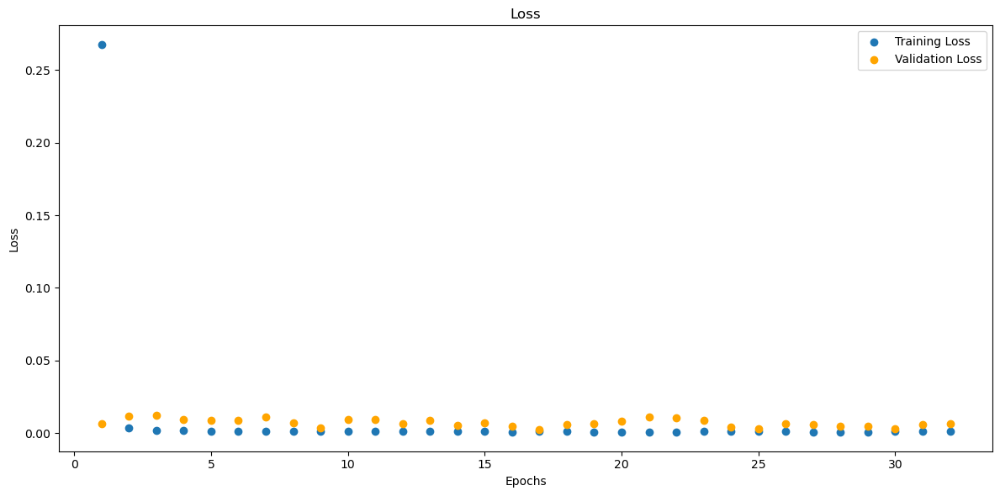

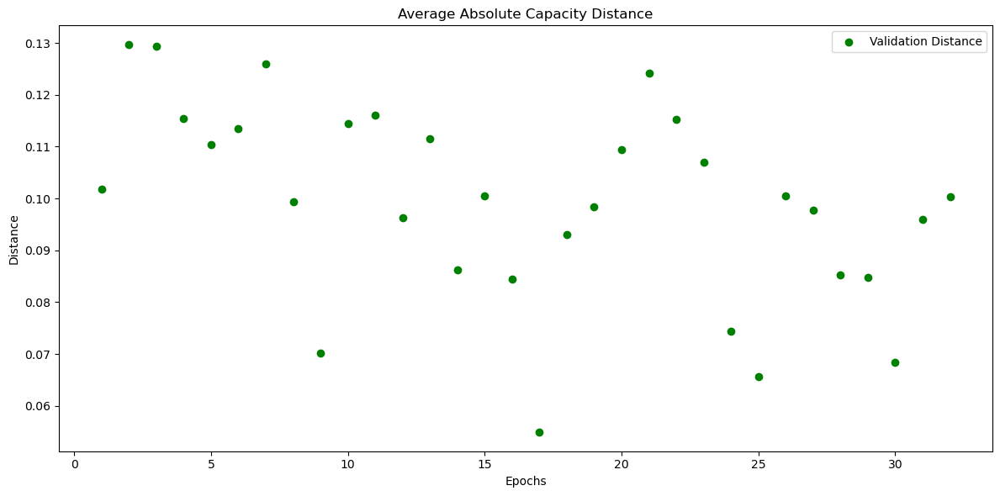

In [353]:
# B0006_combined_mm
model_B0006_combined_mm = CNNLSTM(input_shape=input_shape_combined)
model_B0006_combined_mm, train_losses_B0006_combined_mm, val_losses_B0006_combined_mm, val_distances_B0006_combined_mm, metrics_history_B0006_combined_mm = train(data_loaders['B0006_combined_mm_val_loader'], data_loaders['B0006_combined_mm_train_loader'], model_B0006_combined_mm)
torch.save(model_B0006_combined_mm, os.path.join(folder_name, 'model_B0006_combined_mm.pth'))

Test Loss: 0.0181, Test Distance: 0.1451, Test Accuracy: 0.0000, SNR: -5.7058
##Metrics##:
MAE : 0.1451367437839508
MSE : 0.022210385650396347
RMSE : 0.3813568651676178
R-squared : -729.9552612304688
Count: 21


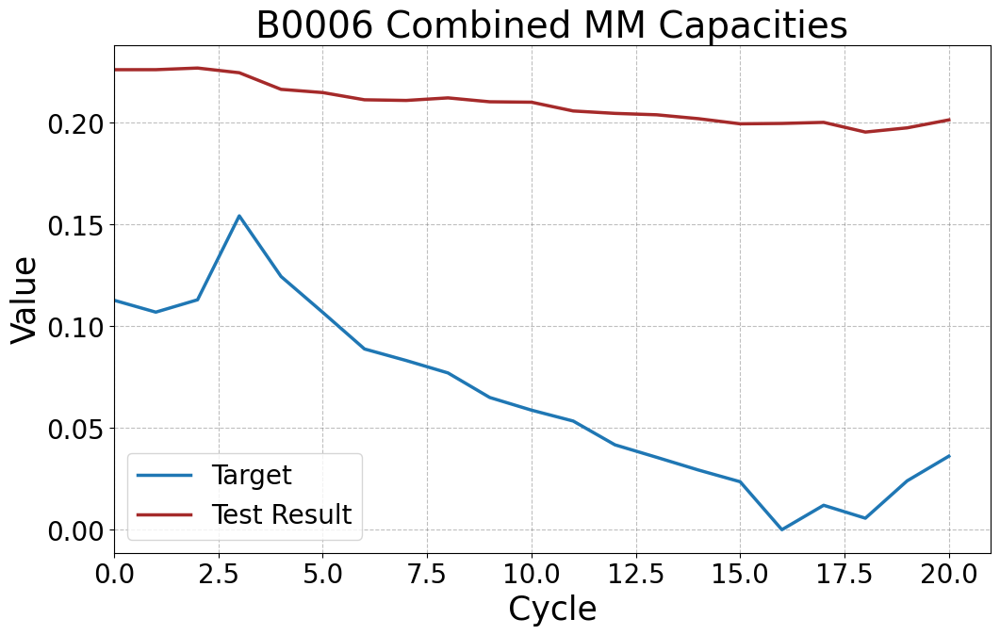

In [354]:
# B0006_combined_mm
model_B0006_combined_mm = torch.load('5. CNN-LSTM Models/model_B0006_combined_mm.pth')
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_test_loader'])
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)
plot_tensors(y_target_B0006_combined_mm, y_testresult_B0006_combined_mm, labels=["Target", "Test Result"], title="B0006 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0039, Test Distance: 0.0528, Test Accuracy: 12.6667, SNR: 17.2519
##Metrics##:
MAE : 0.05277802795171738
MSE : 0.004783120937645435
RMSE : 0.23266127705574036
R-squared : -156.7897491455078
Count: 150


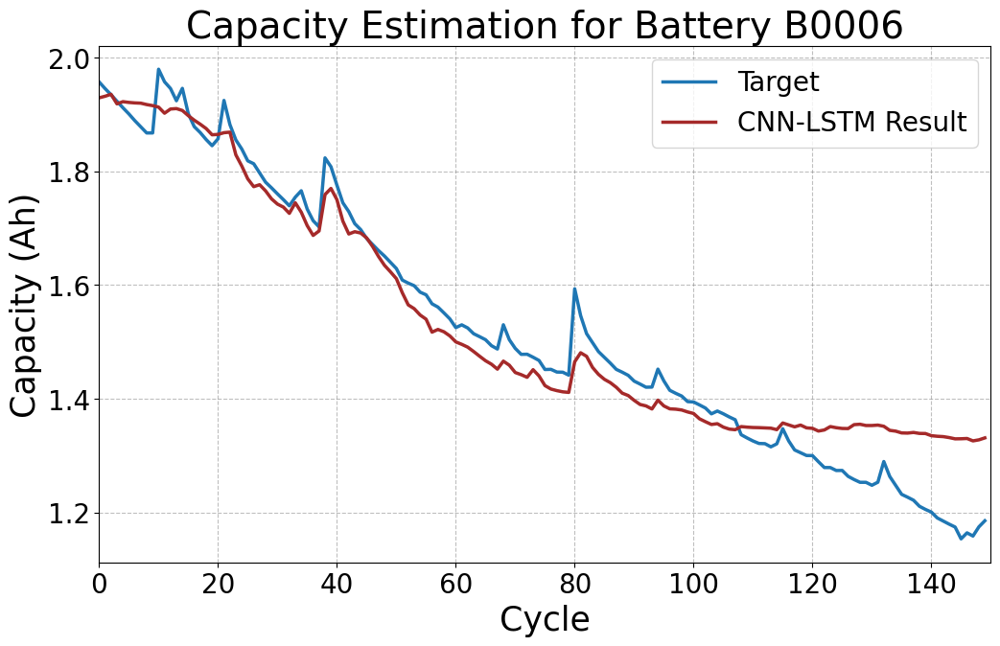

In [355]:
# Run the test on the model
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_target_B0006_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_testresult_B0006_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_mm = torch.tensor(original_y_target_B0006_combined_mm)
original_y_testresult_B0006_combined_mm = torch.tensor(original_y_testresult_B0006_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


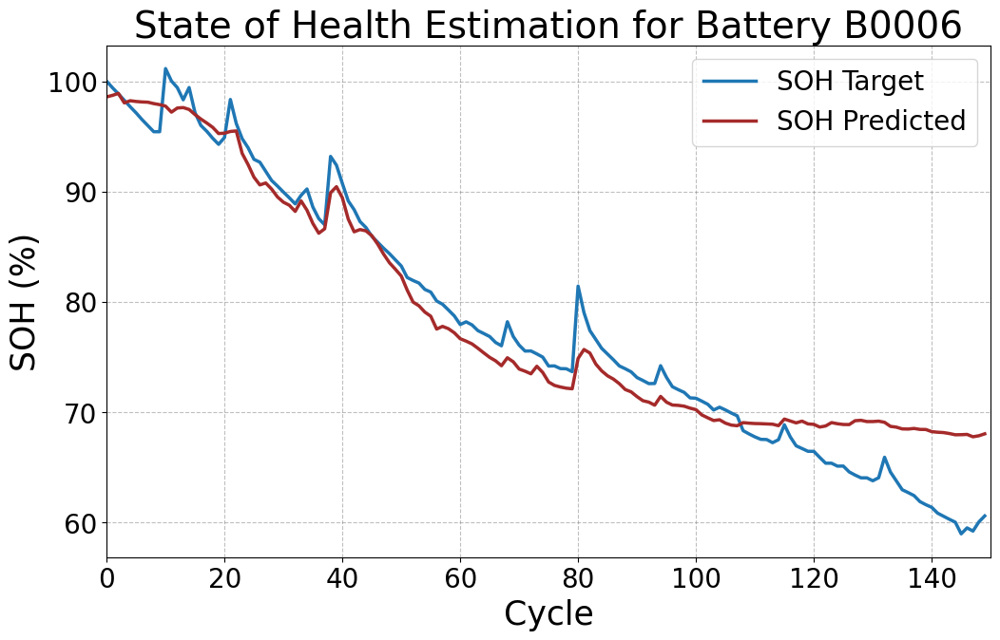

In [356]:
plot_soh(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, "State of Health Estimation for Battery B0006", file_name="B0006_combined_mm")

Model 17 - B0006 - Standard Scaler - Combined Data

Epoch 1/120, Training Loss: 0.3002, Validation Loss: 0.0799
Validation Distance: 0.3680, Validation Accuracy: 0.0000, SNR: 8.3331
##Metrics##:
MAE : 0.27598756551742554
MSE : 0.10893616825342178
RMSE : 0.526082456111908
R-squared : -535.3333740234375
Count: 28
Epoch 2/120, Training Loss: 0.0236, Validation Loss: 0.1898
Validation Distance: 0.5148, Validation Accuracy: 0.0000, SNR: 5.3090
##Metrics##:
MAE : 0.38608095049858093
MSE : 0.20591621100902557
RMSE : 0.6217542886734009
R-squared : -989.1176147460938
Count: 28
Epoch 3/120, Training Loss: 0.0164, Validation Loss: 0.1556
Validation Distance: 0.4682, Validation Accuracy: 0.0000, SNR: 6.1375
##Metrics##:
MAE : 0.35112762451171875
MSE : 0.17058159410953522
RMSE : 0.5929988026618958
R-squared : -822.1987915039062
Count: 28
Epoch 4/120, Training Loss: 0.0145, Validation Loss: 0.1325
Validation Distance: 0.4323, Validation Accuracy: 0.0000, SNR: 6.7962
##Metrics##:
MAE : 0.3242621123790741
MSE : 0.14560821652412415
RMSE : 0.569877624511

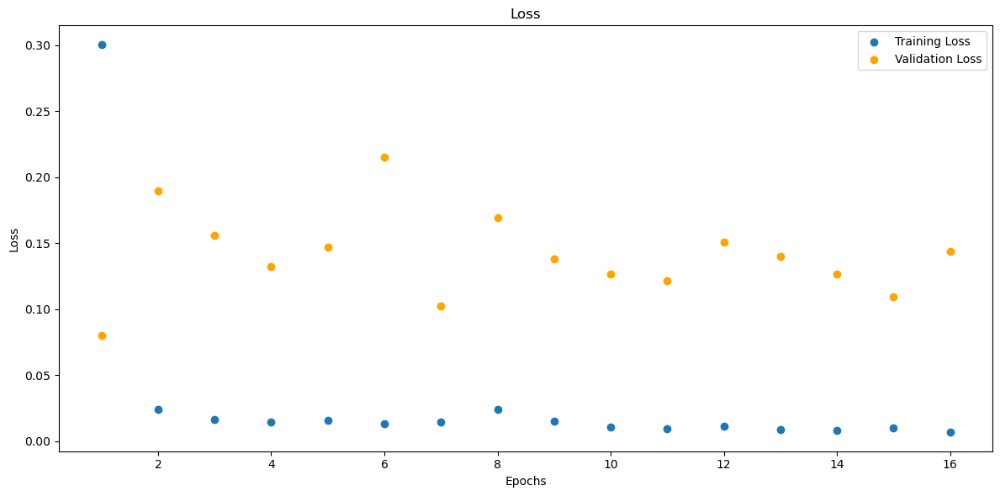

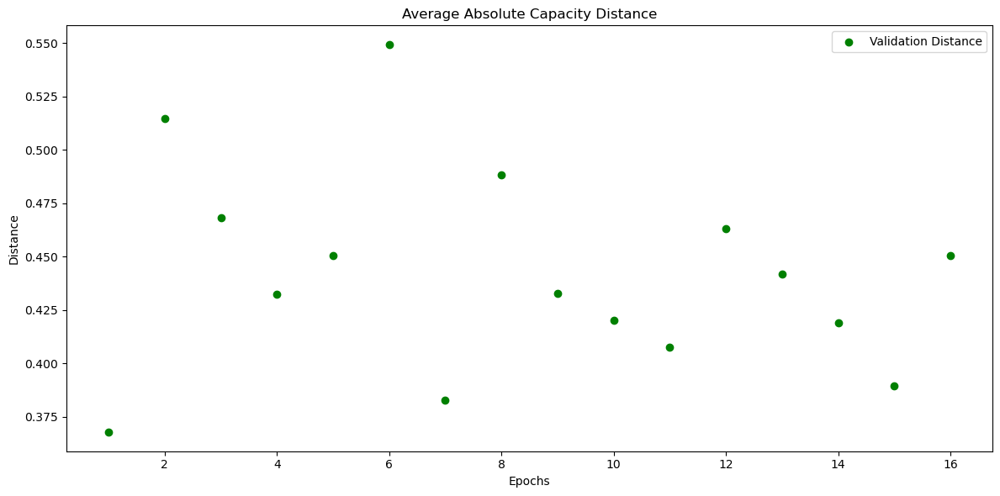

In [374]:
# B0006_combined_std
model_B0006_combined_std = CNNLSTM(input_shape=input_shape_combined)
model_B0006_combined_std, train_losses_B0006_combined_std, val_losses_B0006_combined_std, val_distances_B0006_combined_std, metrics_history_B0006_combined_std = train(data_loaders['B0006_combined_std_val_loader'], data_loaders['B0006_combined_std_train_loader'], model_B0006_combined_std)
torch.save(model_B0006_combined_std, os.path.join(folder_name, 'model_B0006_combined_std.pth'))

Test Loss: 0.3484, Test Distance: 0.6962, Test Accuracy: 0.0000, SNR: 5.5822
##Metrics##:
MAE : 0.6961566209793091
MSE : 0.5014260411262512
RMSE : 0.8348711729049683
R-squared : -1394.3160400390625
Count: 21


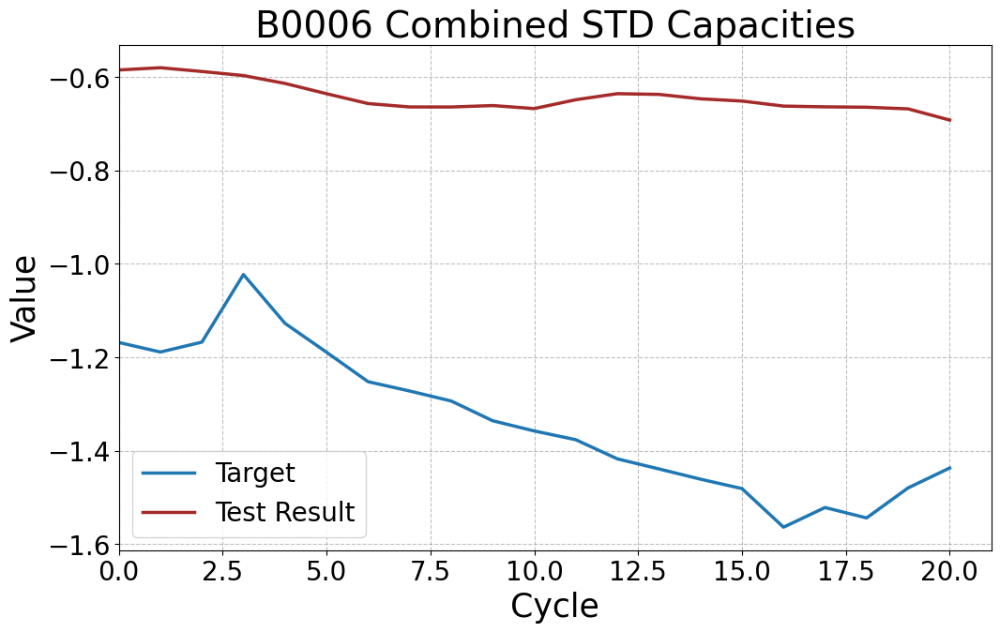

In [375]:
# B0006_combined_std
model_B0006_combined_std = torch.load('5. CNN-LSTM Models/model_B0006_combined_std.pth')
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_test_loader'])
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)
plot_tensors(y_target_B0006_combined_std, y_testresult_B0006_combined_std, labels=["Target", "Test Result"], title="B0006 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.0796, Test Distance: 0.2155, Test Accuracy: 9.3333, SNR: 9.3602
##Metrics##:
MAE : 0.21549548208713531
MSE : 0.10295262932777405
RMSE : 0.47203171253204346
R-squared : -300.44482421875
Count: 150


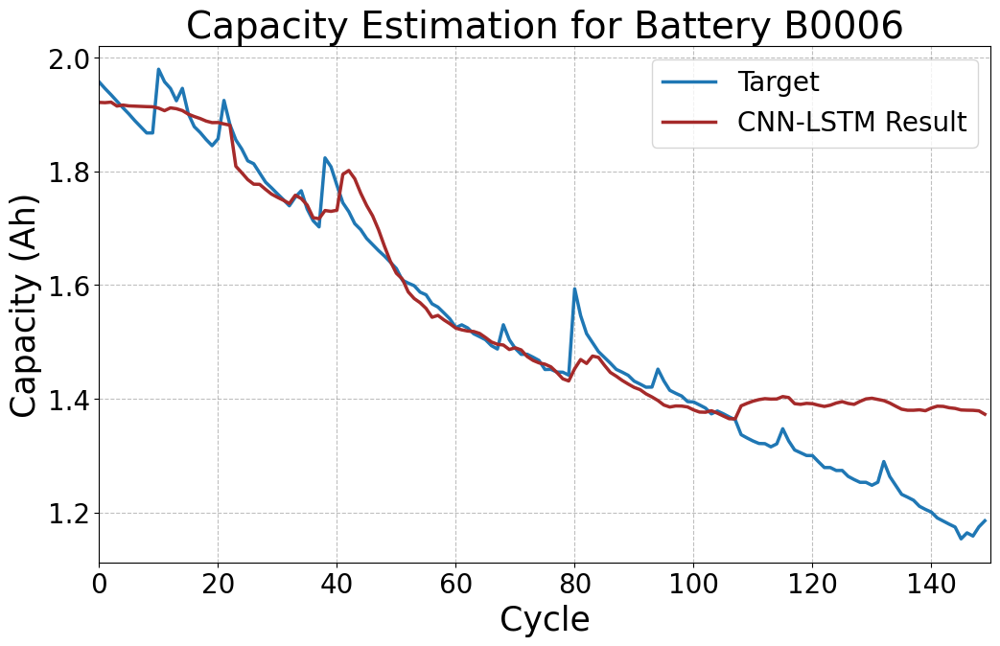

In [376]:
# Run the test on the model
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_target_B0006_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_testresult_B0006_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_std = torch.tensor(original_y_target_B0006_combined_std)
original_y_testresult_B0006_combined_std = torch.tensor(original_y_testresult_B0006_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


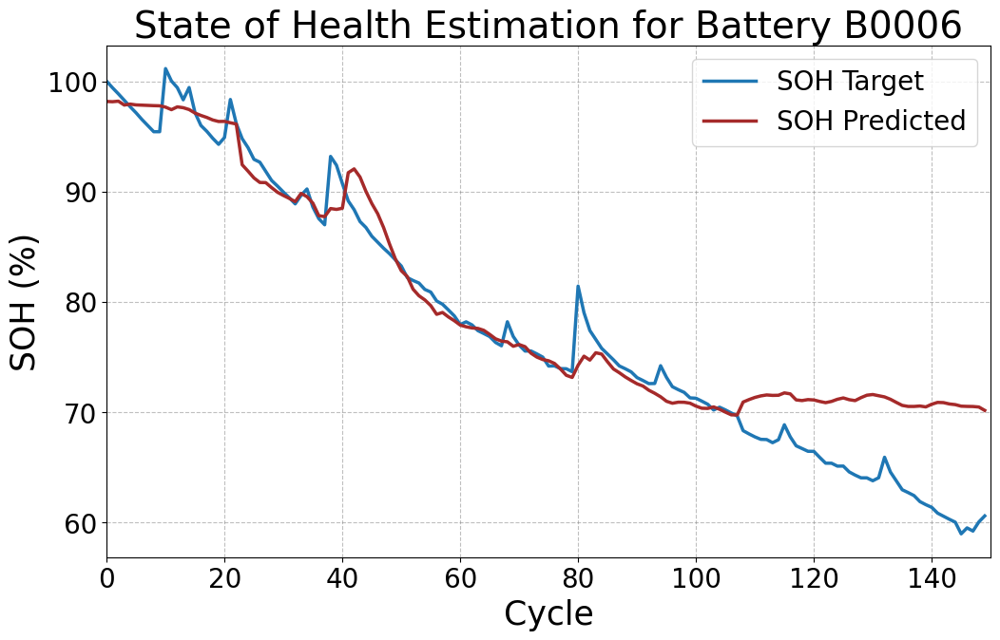

In [377]:
plot_soh(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, "State of Health Estimation for Battery B0006", file_name="B0006_combined_std")

Model 18 - B0006 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2564, Validation Loss: 0.0627
Validation Distance: 0.2927, Validation Accuracy: 0.0000, SNR: 3.8662
##Metrics##:
MAE : 0.2195059359073639
MSE : 0.06617448478937149
RMSE : 0.4689255952835083
R-squared : -808.6248779296875
Count: 28
Epoch 2/120, Training Loss: 0.0107, Validation Loss: 0.0477
Validation Distance: 0.2610, Validation Accuracy: 0.0000, SNR: 5.3476
##Metrics##:
MAE : 0.19575361907482147
MSE : 0.05234881117939949
RMSE : 0.44298550486564636
R-squared : -609.3263549804688
Count: 28
Epoch 3/120, Training Loss: 0.0069, Validation Loss: 0.0547
Validation Distance: 0.2699, Validation Accuracy: 0.0000, SNR: 5.0528
##Metrics##:
MAE : 0.2024468332529068
MSE : 0.055772919207811356
RMSE : 0.4506240487098694
R-squared : -636.8124389648438
Count: 28
Epoch 4/120, Training Loss: 0.0072, Validation Loss: 0.0552
Validation Distance: 0.2828, Validation Accuracy: 0.0000, SNR: 4.9807
##Metrics##:
MAE : 0.21209146082401276
MSE : 0.06098375841975212
RMSE : 0.4610436558

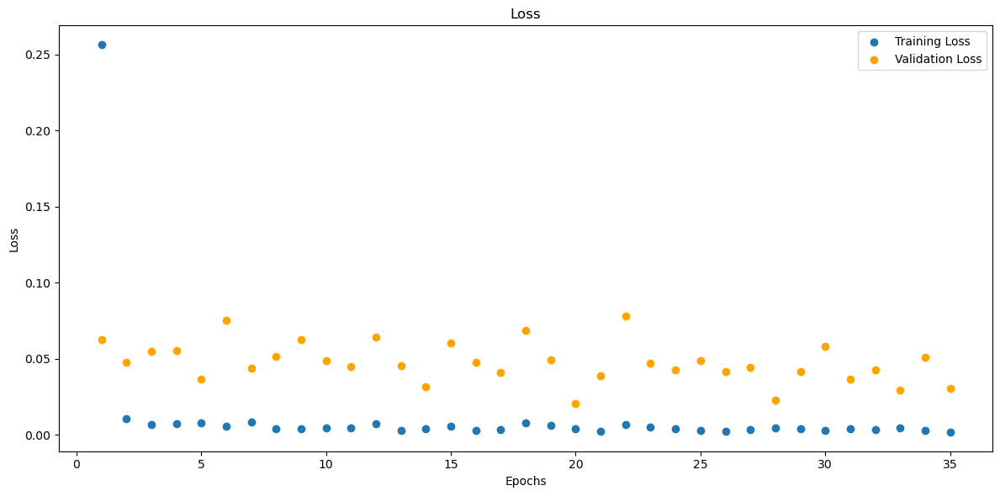

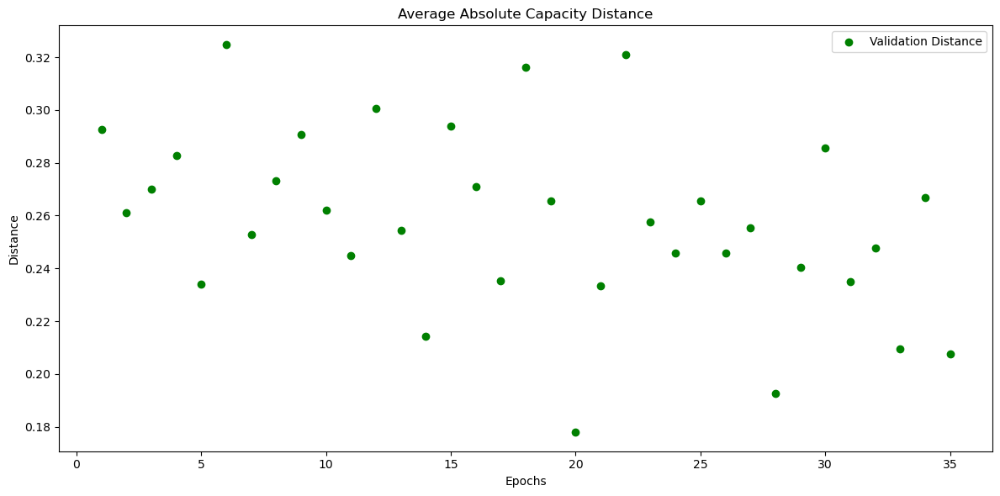

In [378]:
# B0006_combined_rob
model_B0006_combined_rob = CNNLSTM(input_shape=input_shape_combined)
model_B0006_combined_rob, train_losses_B0006_combined_rob, val_losses_B0006_combined_rob, val_distances_B0006_combined_rob, metrics_history_B0006_combined_rob = train(data_loaders['B0006_combined_rob_val_loader'], data_loaders['B0006_combined_rob_train_loader'], model_B0006_combined_rob)
torch.save(model_B0006_combined_rob, os.path.join(folder_name, 'model_B0006_combined_rob.pth'))

Test Loss: 0.0817, Test Distance: 0.3178, Test Accuracy: 0.0000, SNR: 5.9243
##Metrics##:
MAE : 0.31778043508529663
MSE : 0.11157694458961487
RMSE : 0.5649347305297852
R-squared : -792.2120361328125
Count: 21


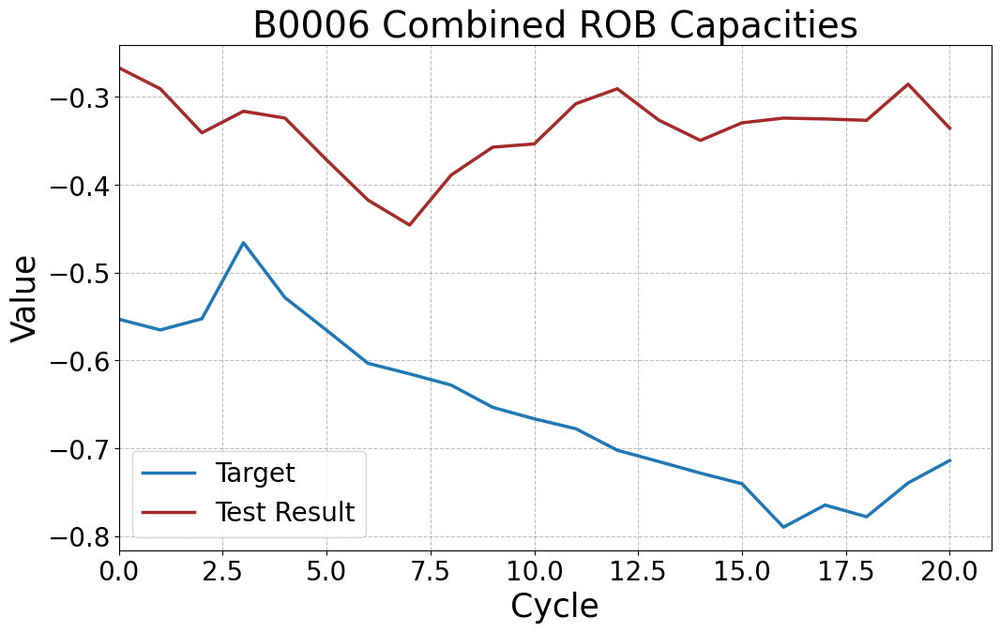

In [379]:
# B0006_combined_rob
model_B0006_combined_rob = torch.load('5. CNN-LSTM Models/model_B0006_combined_rob.pth')
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_test_loader'])
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)
plot_tensors(y_target_B0006_combined_rob, y_testresult_B0006_combined_rob, labels=["Target", "Test Result"], title="B0006 Combined ROB Capacities")


Test on complete dataset.

In [380]:
# Run the test on the model
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)

# # Assuming scaler_y_combined_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_target_B0006_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_testresult_B0006_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_combined_rob = torch.tensor(original_y_target_B0006_combined_rob)
# original_y_testresult_B0006_combined_rob = torch.tensor(original_y_testresult_B0006_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0176, Test Distance: 0.1062, Test Accuracy: 11.3333, SNR: 11.5256
##Metrics##:
MAE : 0.1062450259923935
MSE : 0.023094313219189644
RMSE : 0.3300490975379944
R-squared : -178.53475952148438
Count: 150


SOH Plot.

In [381]:
# plot_soh(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, "State of Health Estimation for Battery B0006", file_name="B0006_combined_rob")

Model 19 - B0007 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.2268, Validation Loss: 0.1009
Validation Distance: 0.3101, Validation Accuracy: 0.0000, SNR: -9.9363
##Metrics##:
MAE : 0.23256826400756836
MSE : 0.07308570295572281
RMSE : 0.48234426975250244
R-squared : -2063.584228515625
Count: 28
Epoch 2/120, Training Loss: 0.0312, Validation Loss: 0.0839
Validation Distance: 0.2998, Validation Accuracy: 0.0000, SNR: -9.1463
##Metrics##:
MAE : 0.22481736540794373
MSE : 0.06828344613313675
RMSE : 0.4742445945739746
R-squared : -1933.9437255859375
Count: 28
Epoch 3/120, Training Loss: 0.0200, Validation Loss: 0.0830
Validation Distance: 0.2918, Validation Accuracy: 0.0000, SNR: -9.1525
##Metrics##:
MAE : 0.2188575714826584
MSE : 0.06478458642959595
RMSE : 0.4679178297519684
R-squared : -1820.6533203125
Count: 28
Epoch 4/120, Training Loss: 0.0170, Validation Loss: 0.0849
Validation Distance: 0.3057, Validation Accuracy: 0.0000, SNR: -9.3488
##Metrics##:
MAE : 0.2292383462190628
MSE : 0.07121068239212036
RMSE : 0.47893407

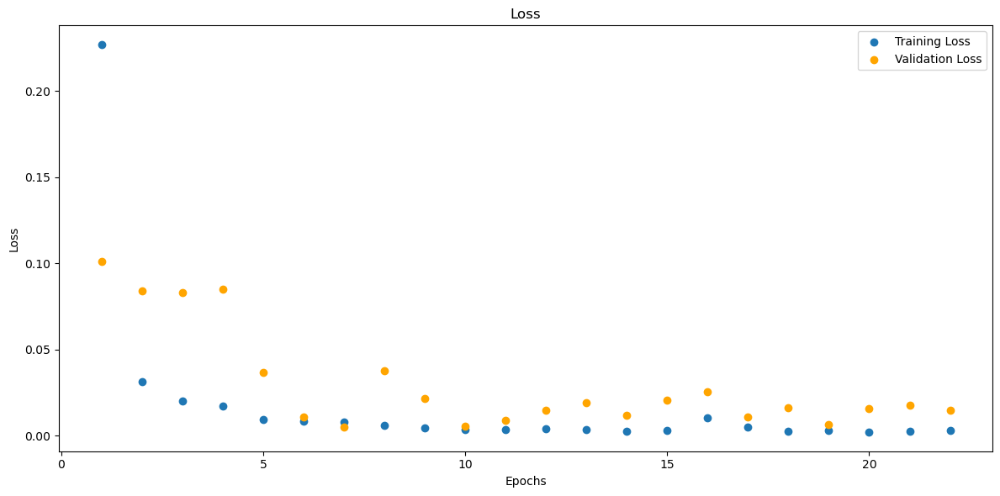

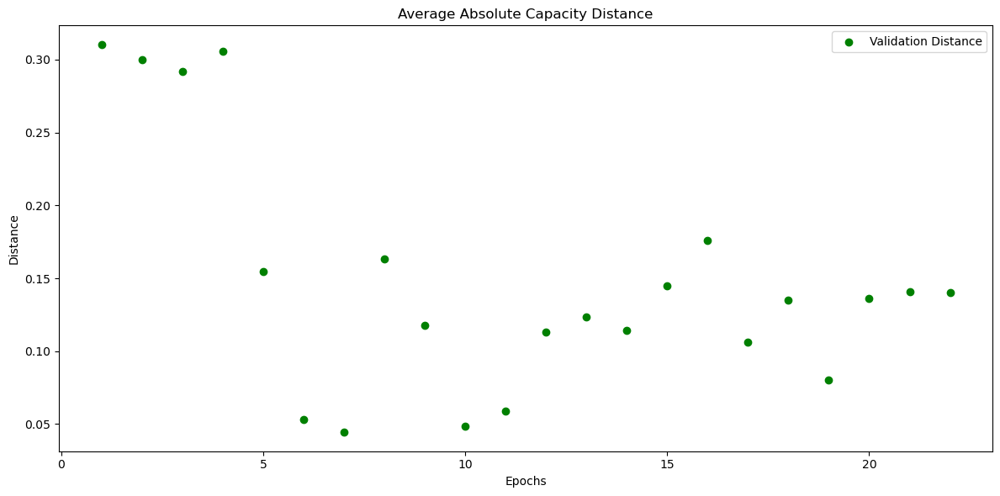

In [382]:
# B0007_charge_mm
model_B0007_charge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0007_charge_mm, train_losses_B0007_charge_mm, val_losses_B0007_charge_mm, val_distances_B0007_charge_mm, metrics_history_B0007_charge_mm = train(data_loaders['B0007_charge_mm_val_loader'], data_loaders['B0007_charge_mm_train_loader'], model_B0007_charge_mm)
torch.save(model_B0007_charge_mm, os.path.join(folder_name, 'model_B0007_charge_mm.pth'))

Test Loss: 0.0327, Test Distance: 0.1236, Test Accuracy: 0.0000, SNR: -6.1188
##Metrics##:
MAE : 0.12364722788333893
MSE : 0.017237963154911995
RMSE : 0.3532771170139313
R-squared : -541.2717895507812
Count: 21


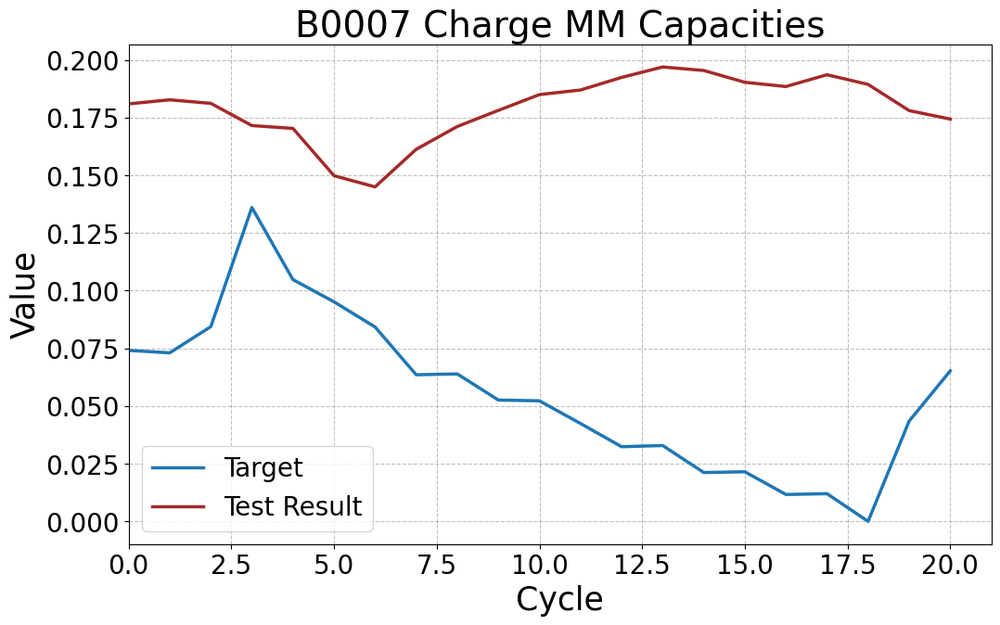

In [383]:
# B0007_charge_mm
model_B0007_charge_mm = torch.load('5. CNN-LSTM Models/model_B0007_charge_mm.pth')
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_test_loader'])
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)
plot_tensors(y_target_B0007_charge_mm, y_testresult_B0007_charge_mm, labels=["Target", "Test Result"], title="B0007 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0123, Test Distance: 0.0813, Test Accuracy: 7.3333, SNR: 15.6623
##Metrics##:
MAE : 0.08131442219018936
MSE : 0.009121338836848736
RMSE : 0.2894144356250763
R-squared : -6740.09033203125
Count: 150


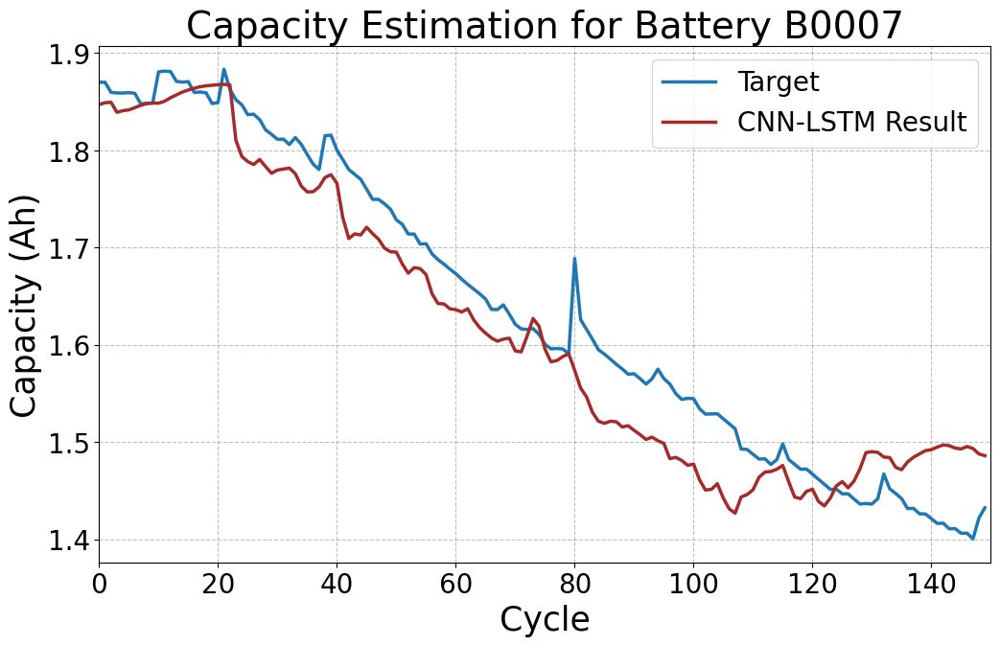

In [384]:
# Run the test on the model
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_target_B0007_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_testresult_B0007_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_mm = torch.tensor(original_y_target_B0007_charge_mm)
original_y_testresult_B0007_charge_mm = torch.tensor(original_y_testresult_B0007_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


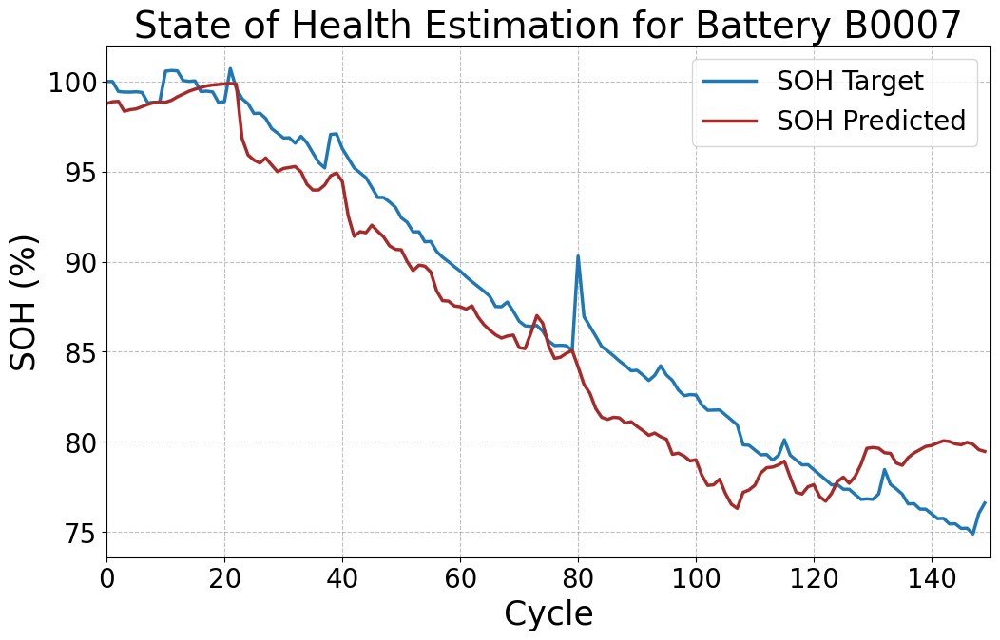

In [385]:
plot_soh(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_charge_mm")

Model 20 - B0007 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.3343, Validation Loss: 0.5707
Validation Distance: 0.8278, Validation Accuracy: 0.0000, SNR: 2.2020
##Metrics##:
MAE : 0.620867133140564
MSE : 0.5274598002433777
RMSE : 0.7883228659629822
R-squared : -1526.8775634765625
Count: 28
Epoch 2/120, Training Loss: 0.0313, Validation Loss: 0.2519
Validation Distance: 0.5566, Validation Accuracy: 0.0000, SNR: 5.0994
##Metrics##:
MAE : 0.4174250066280365
MSE : 0.24802163243293762
RMSE : 0.6470495462417603
R-squared : -692.7247314453125
Count: 28
Epoch 3/120, Training Loss: 0.0228, Validation Loss: 0.2726
Validation Distance: 0.5758, Validation Accuracy: 0.0000, SNR: 4.9280
##Metrics##:
MAE : 0.43181729316711426
MSE : 0.260608047246933
RMSE : 0.6576256155967712
R-squared : -739.5648193359375
Count: 28
Epoch 4/120, Training Loss: 0.0217, Validation Loss: 0.2001
Validation Distance: 0.4671, Validation Accuracy: 0.0000, SNR: 6.1025
##Metrics##:
MAE : 0.3503110706806183
MSE : 0.173981711268425
RMSE : 0.5924648642539978
R

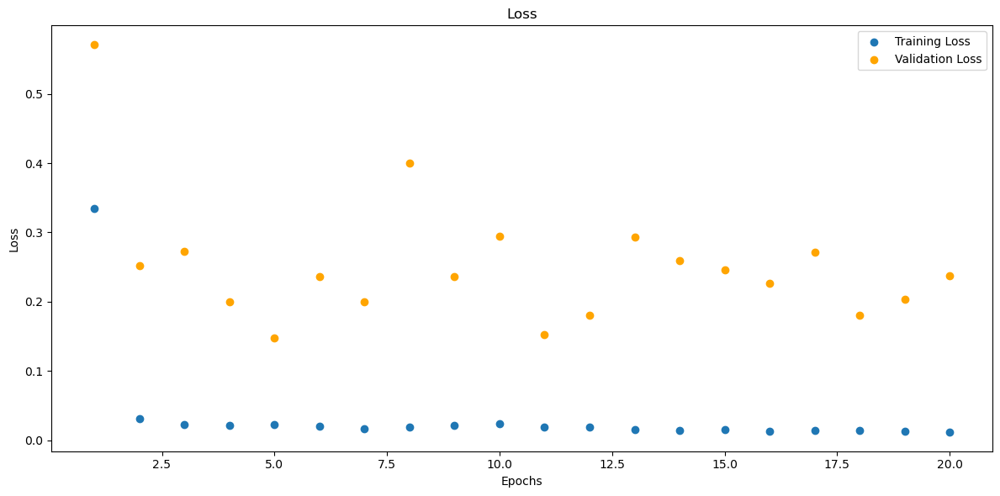

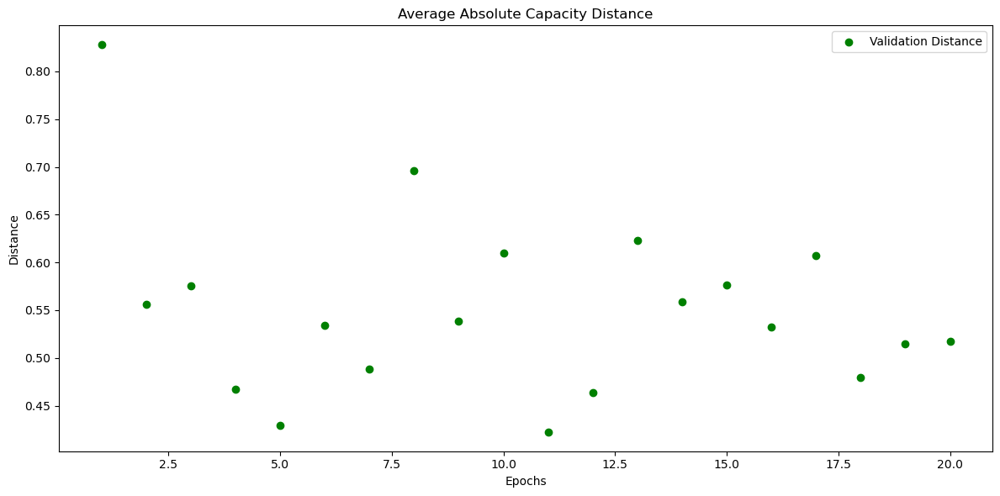

In [386]:
# B0007_charge_std
model_B0007_charge_std = CNNLSTM(input_shape=input_shape_single)
model_B0007_charge_std, train_losses_B0007_charge_std, val_losses_B0007_charge_std, val_distances_B0007_charge_std, metrics_history_B0007_charge_std = train(data_loaders['B0007_charge_std_val_loader'], data_loaders['B0007_charge_std_train_loader'], model_B0007_charge_std)
torch.save(model_B0007_charge_std, os.path.join(folder_name, 'model_B0007_charge_std.pth'))

Test Loss: 0.6093, Test Distance: 0.7834, Test Accuracy: 0.0000, SNR: 4.6721
##Metrics##:
MAE : 0.7834344506263733
MSE : 0.6255400776863098
RMSE : 0.8856744170188904
R-squared : -1877.8392333984375
Count: 21


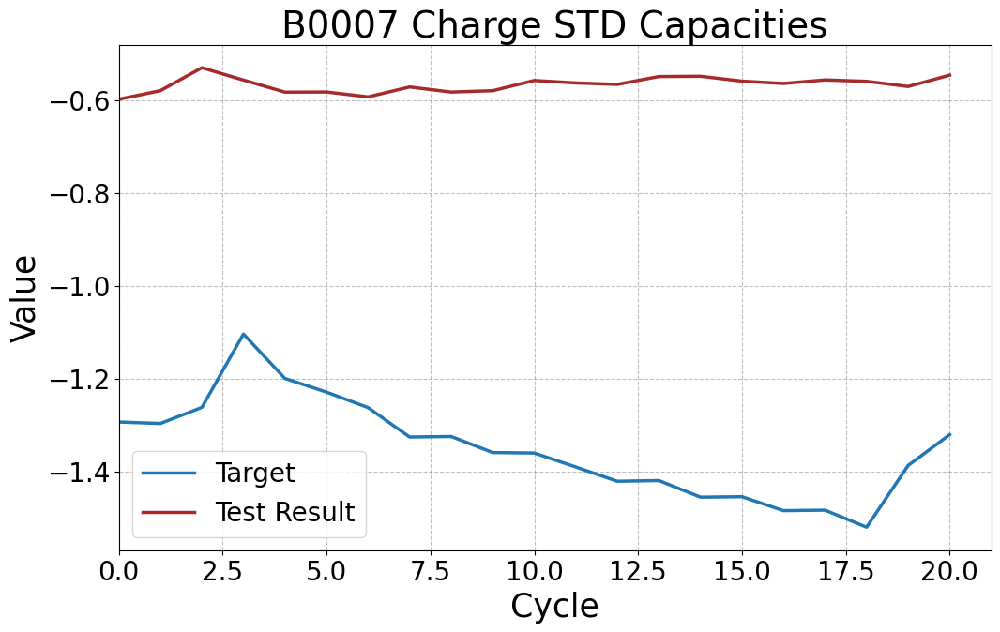

In [387]:
# B0007_charge_std
model_B0007_charge_std = torch.load('5. CNN-LSTM Models/model_B0007_charge_std.pth')
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_test_loader'])
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)
plot_tensors(y_target_B0007_charge_std, y_testresult_B0007_charge_std, labels=["Target", "Test Result"], title="B0007 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.1258, Test Distance: 0.2399, Test Accuracy: 8.6667, SNR: 8.6964
##Metrics##:
MAE : 0.23993194103240967
MSE : 0.1284535527229309
RMSE : 0.49687305092811584
R-squared : -1515.9910888671875
Count: 150


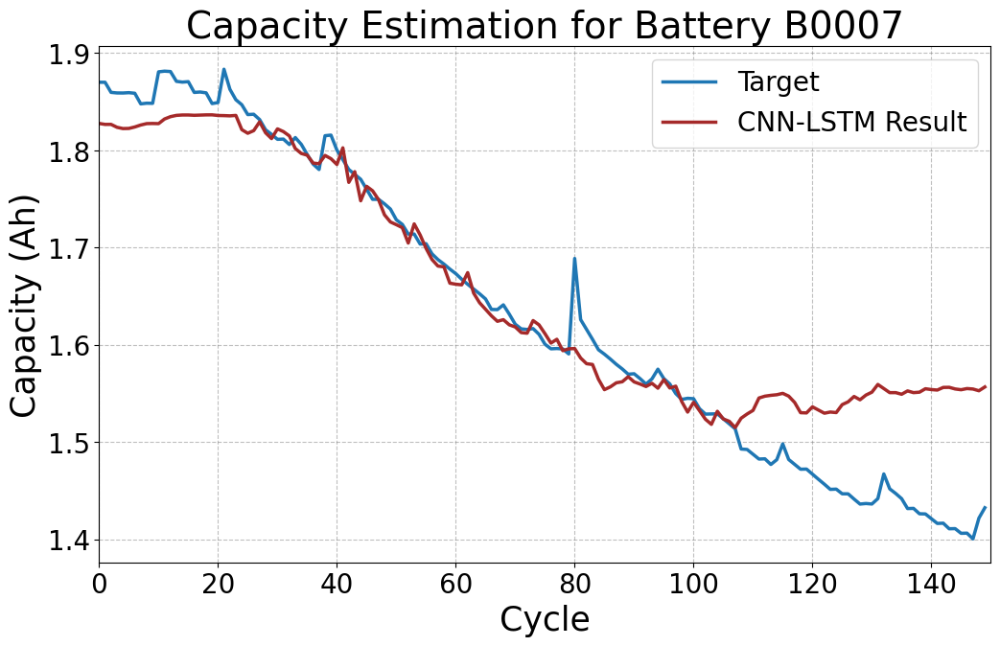

In [388]:
# Run the test on the model
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_target_B0007_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_testresult_B0007_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_std = torch.tensor(original_y_target_B0007_charge_std)
original_y_testresult_B0007_charge_std = torch.tensor(original_y_testresult_B0007_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


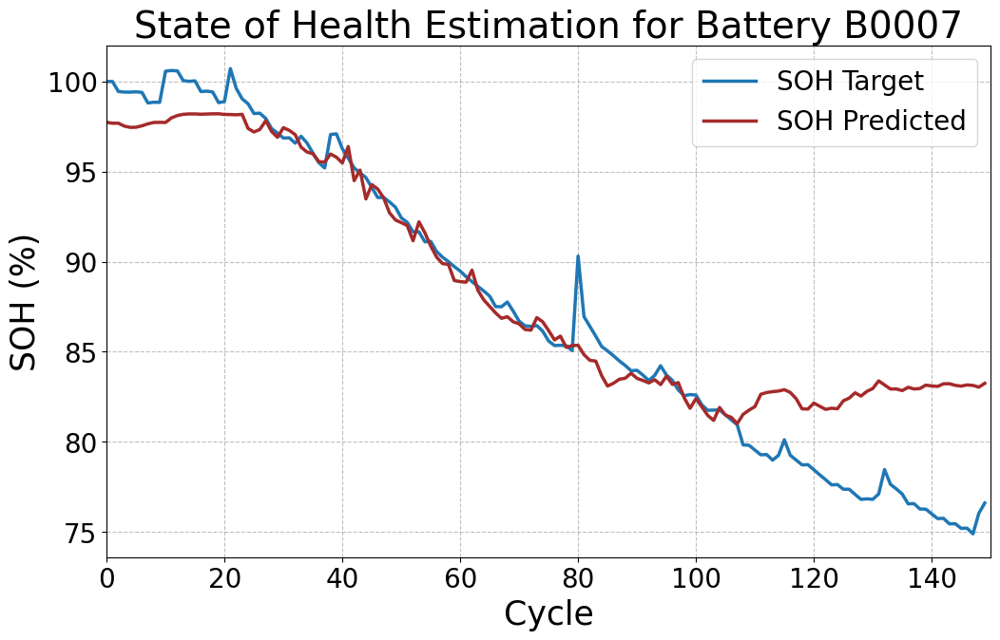

In [389]:
plot_soh(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, "State of Health Estimation for Battery B0007", file_name="B0007_charge_std")

Model 21 - B0007 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2596, Validation Loss: 0.0133
Validation Distance: 0.0539, Validation Accuracy: 23.8095, SNR: 17.6119
##Metrics##:
MAE : 0.04045610874891281
MSE : 0.0032931920140981674
RMSE : 0.21398520469665527
R-squared : -40.059547424316406
Count: 28
Epoch 2/120, Training Loss: 0.0168, Validation Loss: 0.0038
Validation Distance: 0.0705, Validation Accuracy: 4.7619, SNR: 13.7053
##Metrics##:
MAE : 0.05289604142308235
MSE : 0.006205793470144272
RMSE : 0.23653589189052582
R-squared : -70.47599792480469
Count: 28
Epoch 3/120, Training Loss: 0.0077, Validation Loss: 0.0344
Validation Distance: 0.2204, Validation Accuracy: 0.0000, SNR: 5.9169
##Metrics##:
MAE : 0.16530540585517883
MSE : 0.039727576076984406
RMSE : 0.4082784950733185
R-squared : -434.1342468261719
Count: 28
Epoch 4/120, Training Loss: 0.0065, Validation Loss: 0.0638
Validation Distance: 0.2931, Validation Accuracy: 0.0000, SNR: 3.7420
##Metrics##:
MAE : 0.21983297169208527
MSE : 0.06817425042390823
RMSE : 0.

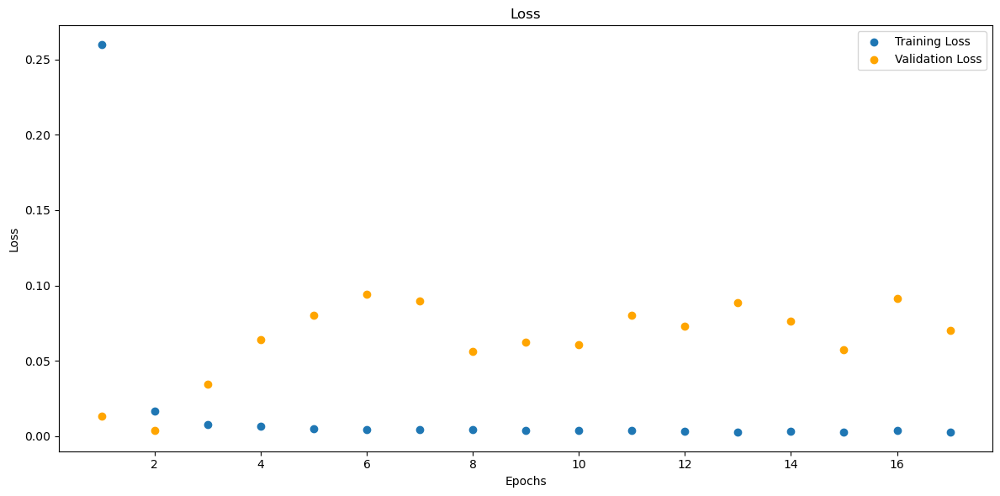

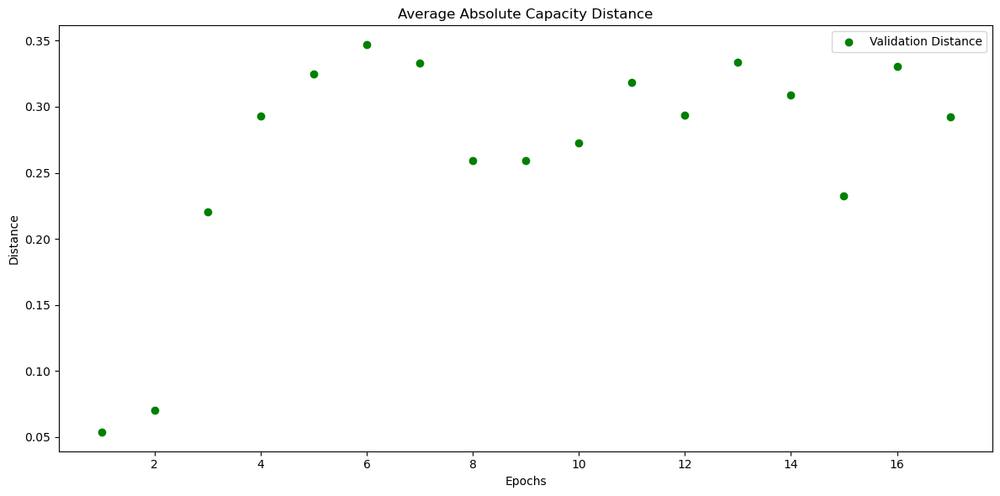

In [390]:
# B0007_charge_rob
model_B0007_charge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0007_charge_rob, train_losses_B0007_charge_rob, val_losses_B0007_charge_rob, val_distances_B0007_charge_rob, metrics_history_B0007_charge_rob = train(data_loaders['B0007_charge_rob_val_loader'], data_loaders['B0007_charge_rob_train_loader'], model_B0007_charge_rob)
torch.save(model_B0007_charge_rob, os.path.join(folder_name, 'model_B0007_charge_rob.pth'))

Test Loss: 0.0907, Test Distance: 0.3277, Test Accuracy: 0.0000, SNR: 4.8902
##Metrics##:
MAE : 0.32768166065216064
MSE : 0.11770495027303696
RMSE : 0.575084924697876
R-squared : -1485.41748046875
Count: 21


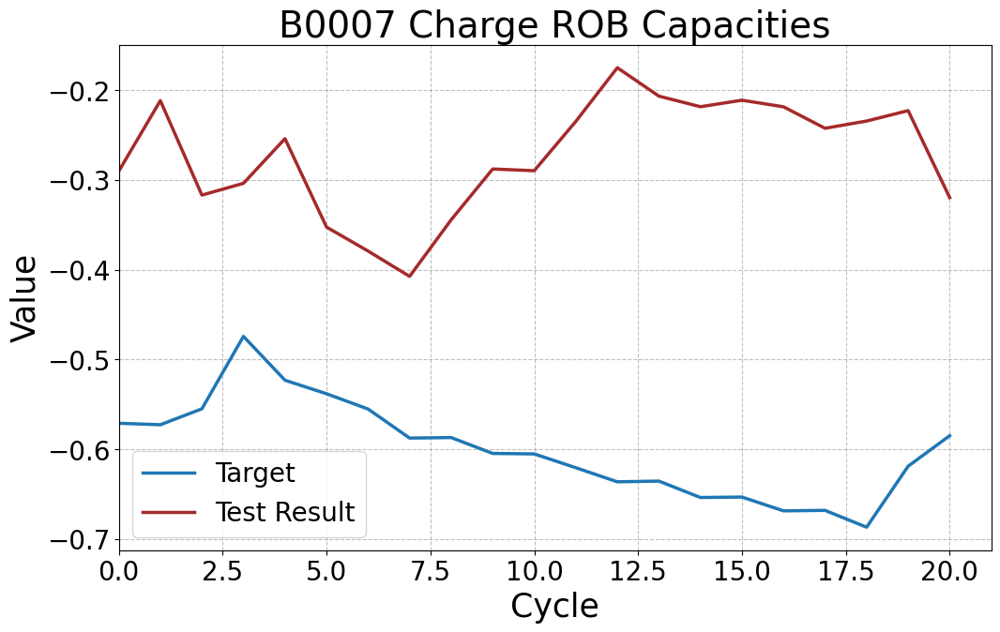

In [391]:
# B0007_charge_rob
model_B0007_charge_rob = torch.load('5. CNN-LSTM Models/model_B0007_charge_rob.pth')
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_test_loader'])
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)
plot_tensors(y_target_B0007_charge_rob, y_testresult_B0007_charge_rob, labels=["Target", "Test Result"], title="B0007 Charge ROB Capacities")


Test on complete dataset.

In [392]:
# Run the test on the model
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)

# # Assuming scaler_y_charge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_target_B0007_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_testresult_B0007_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_charge_rob = torch.tensor(original_y_target_B0007_charge_rob)
# original_y_testresult_B0007_charge_rob = torch.tensor(original_y_testresult_B0007_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0191, Test Distance: 0.0967, Test Accuracy: 7.3333, SNR: 10.6999
##Metrics##:
MAE : 0.09670426696538925
MSE : 0.021532751619815826
RMSE : 0.31946197152137756
R-squared : -340.4557189941406
Count: 150


SOH Plot.

In [393]:
# plot_soh(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_charge_rob")

Model 22 - B0007 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.3313, Validation Loss: 0.1105
Validation Distance: 0.3472, Validation Accuracy: 0.0000, SNR: -8.7661
##Metrics##:
MAE : 0.260417640209198
MSE : 0.09078139811754227
RMSE : 0.5103490948677063
R-squared : -2613.681884765625
Count: 28
Epoch 2/120, Training Loss: 0.0349, Validation Loss: 0.0203
Validation Distance: 0.1280, Validation Accuracy: 0.0000, SNR: 1.4182
##Metrics##:
MAE : 0.09600775688886642
MSE : 0.014224938116967678
RMSE : 0.3108001947402954
R-squared : -428.8882141113281
Count: 28
Epoch 3/120, Training Loss: 0.0197, Validation Loss: 0.0157
Validation Distance: 0.1218, Validation Accuracy: 0.0000, SNR: 0.1930
##Metrics##:
MAE : 0.09132306277751923
MSE : 0.011626126244664192
RMSE : 0.3026443123817444
R-squared : -363.50164794921875
Count: 28
Epoch 4/120, Training Loss: 0.0161, Validation Loss: 0.0066
Validation Distance: 0.0728, Validation Accuracy: 0.0000, SNR: 1.9646
##Metrics##:
MAE : 0.05456352233886719
MSE : 0.004496481269598007
RMSE : 0.2354654

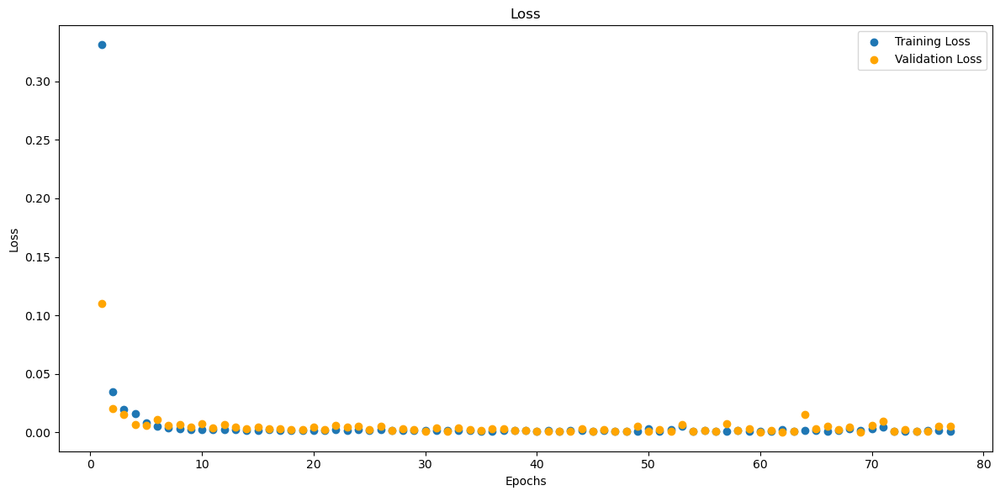

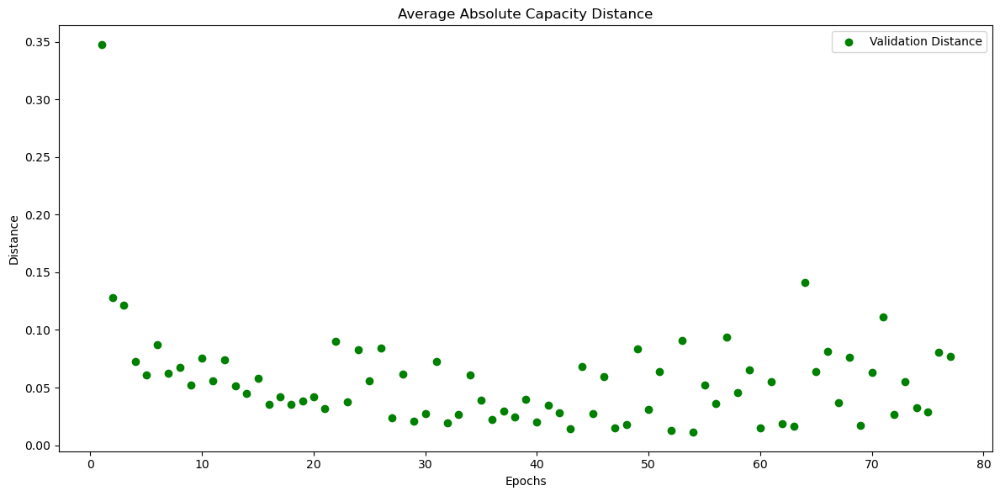

In [394]:
# B0007_discharge_mm
model_B0007_discharge_mm = CNNLSTM(input_shape=input_shape_single)
model_B0007_discharge_mm, train_losses_B0007_discharge_mm, val_losses_B0007_discharge_mm, val_distances_B0007_discharge_mm, metrics_history_B0007_discharge_mm = train(data_loaders['B0007_discharge_mm_val_loader'], data_loaders['B0007_discharge_mm_train_loader'], model_B0007_discharge_mm)
torch.save(model_B0007_discharge_mm, os.path.join(folder_name, 'model_B0007_discharge_mm.pth'))

Test Loss: 0.0013, Test Distance: 0.0318, Test Accuracy: 4.7619, SNR: 4.3244
##Metrics##:
MAE : 0.03181528300046921
MSE : 0.0015565523644909263
RMSE : 0.18648742139339447
R-squared : -37.92575454711914
Count: 21


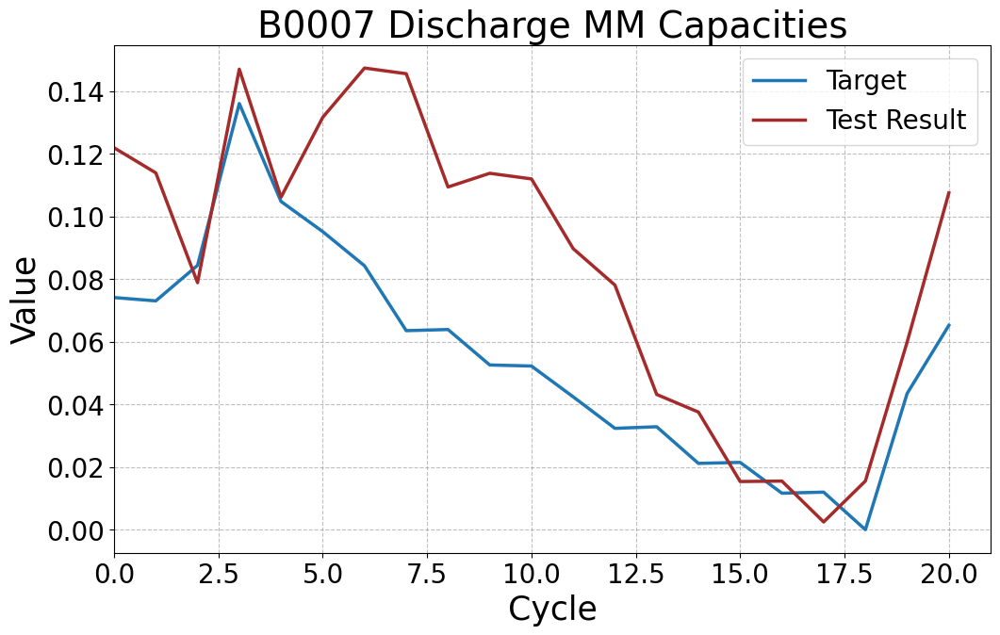

In [395]:
# B0007_discharge_mm
model_B0007_discharge_mm = torch.load('5. CNN-LSTM Models/model_B0007_discharge_mm.pth')
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_test_loader'])
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)
plot_tensors(y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm, labels=["Target", "Test Result"], title="B0007 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0009, Test Distance: 0.0221, Test Accuracy: 32.0000, SNR: 26.5704
##Metrics##:
MAE : 0.022069385275244713
MSE : 0.000740023038815707
RMSE : 0.15457284450531006
R-squared : -297.2896728515625
Count: 150


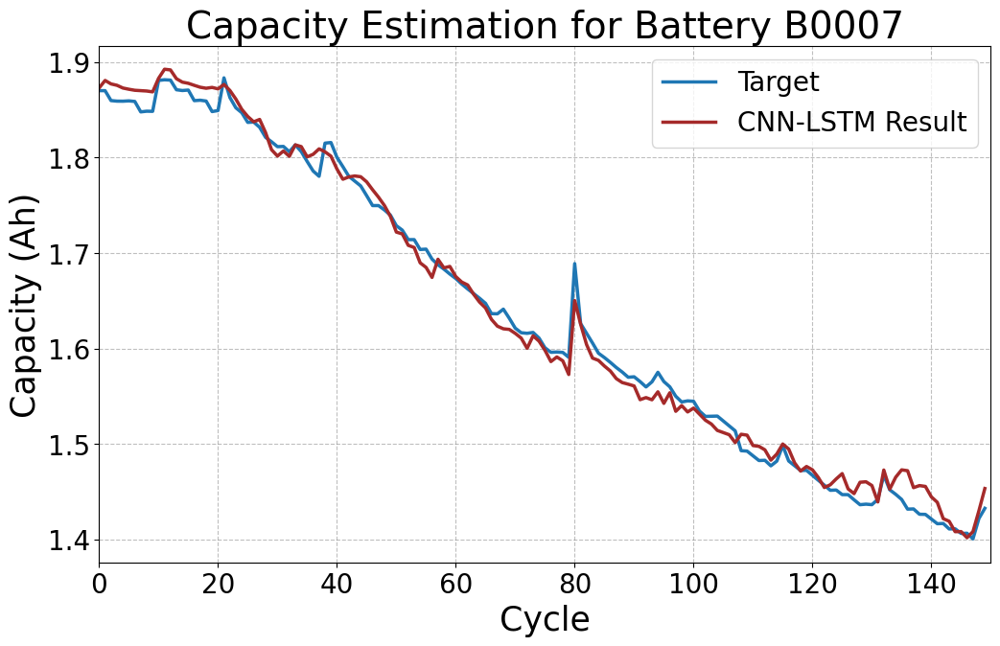

In [396]:
# Run the test on the model
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_target_B0007_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_testresult_B0007_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_mm = torch.tensor(original_y_target_B0007_discharge_mm)
original_y_testresult_B0007_discharge_mm = torch.tensor(original_y_testresult_B0007_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


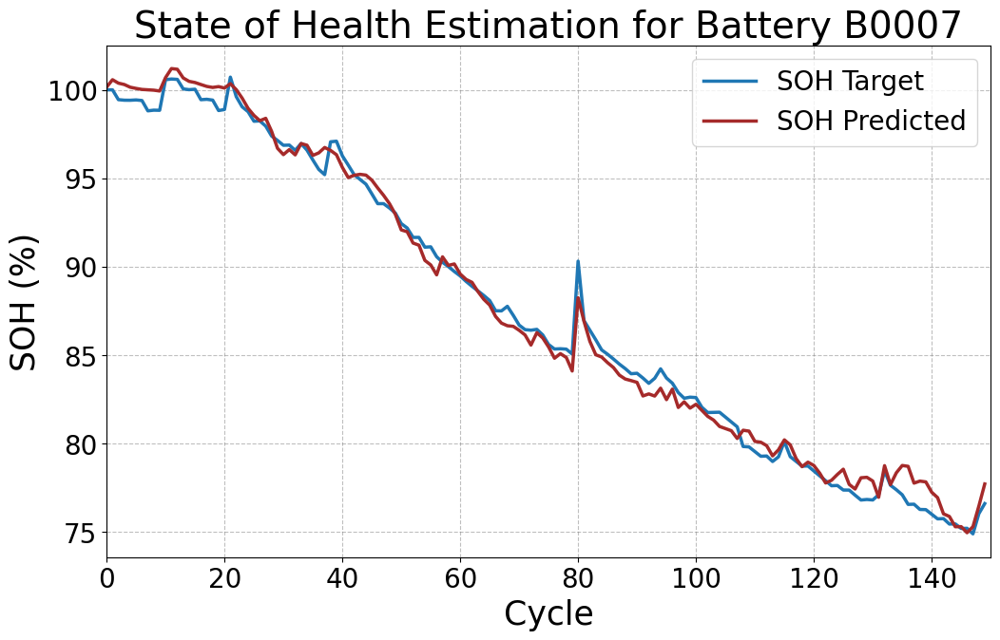

In [397]:
plot_soh(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_mm")

Model 22 - B0007 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.1654, Validation Loss: 0.2640
Validation Distance: 0.5722, Validation Accuracy: 0.0000, SNR: 4.2907
##Metrics##:
MAE : 0.42917829751968384
MSE : 0.26642224192619324
RMSE : 0.656069278717041
R-squared : -770.2073364257812
Count: 28
Epoch 2/120, Training Loss: 0.0300, Validation Loss: 0.1856
Validation Distance: 0.4897, Validation Accuracy: 0.0000, SNR: 6.5990
##Metrics##:
MAE : 0.36727026104927063
MSE : 0.1880461871623993
RMSE : 0.6070064306259155
R-squared : -539.6445922851562
Count: 28
Epoch 3/120, Training Loss: 0.0207, Validation Loss: 0.1336
Validation Distance: 0.4243, Validation Accuracy: 0.0000, SNR: 6.4567
##Metrics##:
MAE : 0.3181930184364319
MSE : 0.15663792192935944
RMSE : 0.5657857656478882
R-squared : -440.3925476074219
Count: 28
Epoch 4/120, Training Loss: 0.0166, Validation Loss: 0.1375
Validation Distance: 0.4218, Validation Accuracy: 0.0000, SNR: 7.6110
##Metrics##:
MAE : 0.3163296580314636
MSE : 0.14154702425003052
RMSE : 0.56341397762298

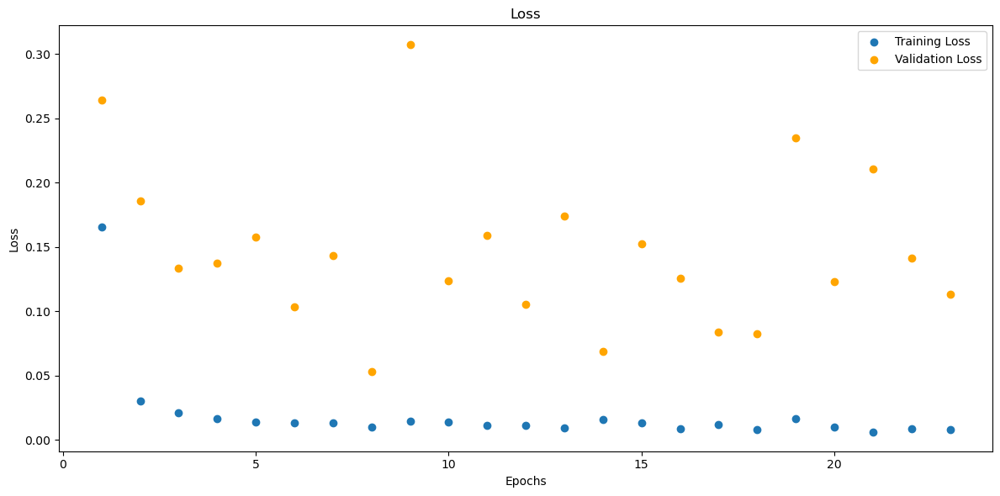

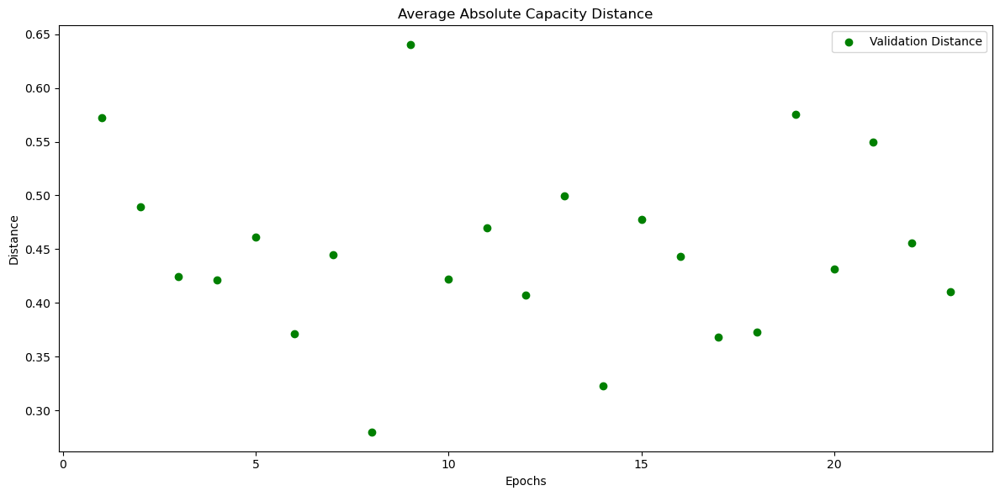

In [398]:
# B0007_discharge_std
model_B0007_discharge_std = CNNLSTM(input_shape=input_shape_single)
model_B0007_discharge_std, train_losses_B0007_discharge_std, val_losses_B0007_discharge_std, val_distances_B0007_discharge_std, metrics_history_B0007_discharge_std = train(data_loaders['B0007_discharge_std_val_loader'], data_loaders['B0007_discharge_std_train_loader'], model_B0007_discharge_std)
torch.save(model_B0007_discharge_std, os.path.join(folder_name, 'model_B0007_discharge_std.pth'))

Test Loss: 0.3201, Test Distance: 0.5864, Test Accuracy: 0.0000, SNR: 7.1925
##Metrics##:
MAE : 0.5864138007164001
MSE : 0.35011953115463257
RMSE : 0.7666823267936707
R-squared : -1042.6904296875
Count: 21


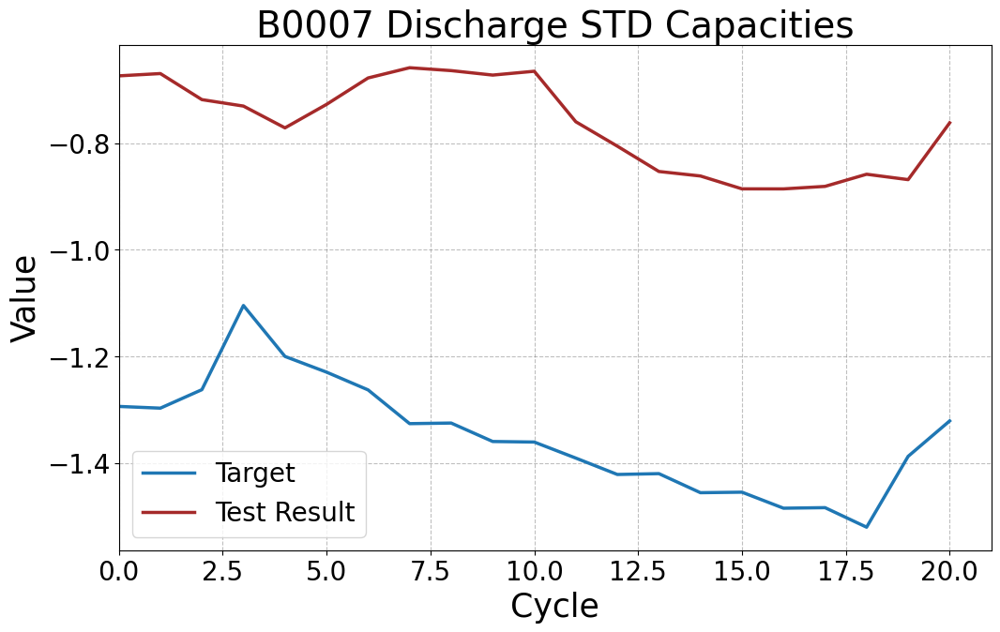

In [399]:
# B0007_discharge_std
model_B0007_discharge_std = torch.load('5. CNN-LSTM Models/model_B0007_discharge_std.pth')
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_test_loader'])
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)
plot_tensors(y_target_B0007_discharge_std, y_testresult_B0007_discharge_std, labels=["Target", "Test Result"], title="B0007 Discharge STD Capacities")


Test on Complete Dataset.

Test Loss: 0.0610, Test Distance: 0.1747, Test Accuracy: 10.0000, SNR: 11.4202
##Metrics##:
MAE : 0.17467868328094482
MSE : 0.06860745698213577
RMSE : 0.422730028629303
R-squared : -777.9879760742188
Count: 150


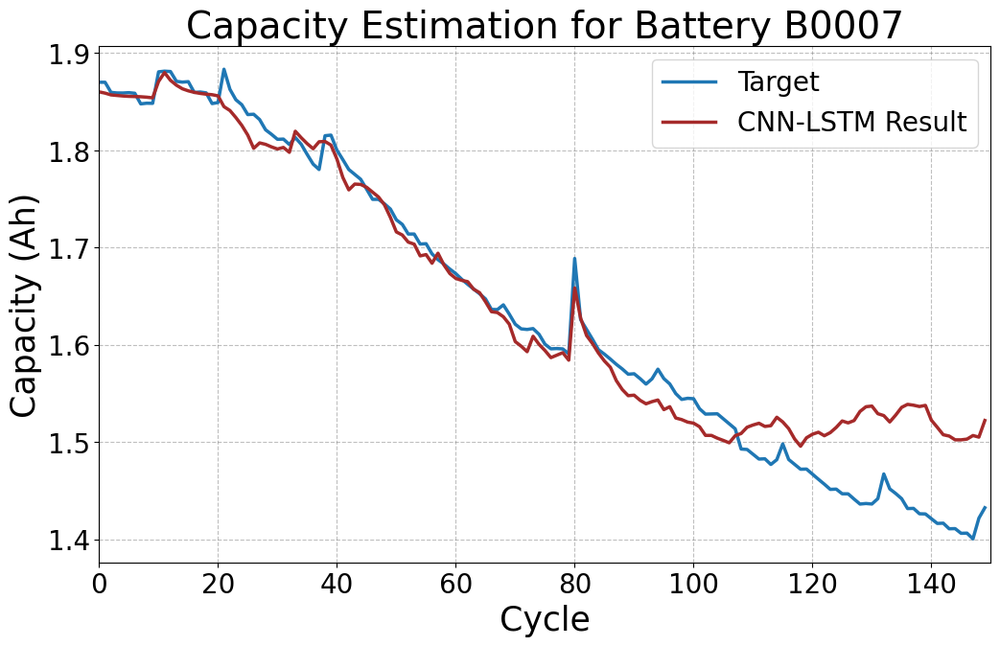

In [400]:
# Run the test on the model
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_target_B0007_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_testresult_B0007_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_std = torch.tensor(original_y_target_B0007_discharge_std)
original_y_testresult_B0007_discharge_std = torch.tensor(original_y_testresult_B0007_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


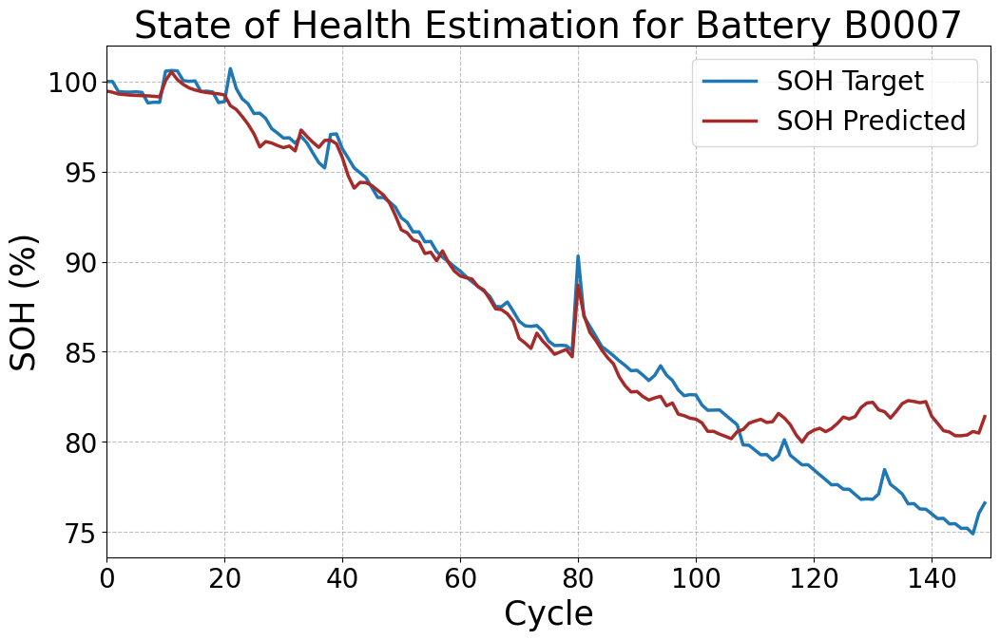

In [401]:
plot_soh(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_std")

Model 23 - B0007 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.3159, Validation Loss: 0.2174
Validation Distance: 0.5251, Validation Accuracy: 0.0000, SNR: -2.1347
##Metrics##:
MAE : 0.39382290840148926
MSE : 0.23485909402370453
RMSE : 0.6291552782058716
R-squared : -2726.48095703125
Count: 28
Epoch 2/120, Training Loss: 0.0228, Validation Loss: 0.0314
Validation Distance: 0.1657, Validation Accuracy: 4.7619, SNR: 5.2423
##Metrics##:
MAE : 0.12428362667560577
MSE : 0.03402024880051613
RMSE : 0.35787031054496765
R-squared : -400.49951171875
Count: 28
Epoch 3/120, Training Loss: 0.0074, Validation Loss: 0.0092
Validation Distance: 0.0915, Validation Accuracy: 9.5238, SNR: 10.1483
##Metrics##:
MAE : 0.0686119943857193
MSE : 0.01112892385572195
RMSE : 0.2673773467540741
R-squared : -137.3607940673828
Count: 28
Epoch 4/120, Training Loss: 0.0057, Validation Loss: 0.0051
Validation Distance: 0.0595, Validation Accuracy: 14.2857, SNR: 13.2191
##Metrics##:
MAE : 0.04460187628865242
MSE : 0.004714064300060272
RMSE : 0.21770493

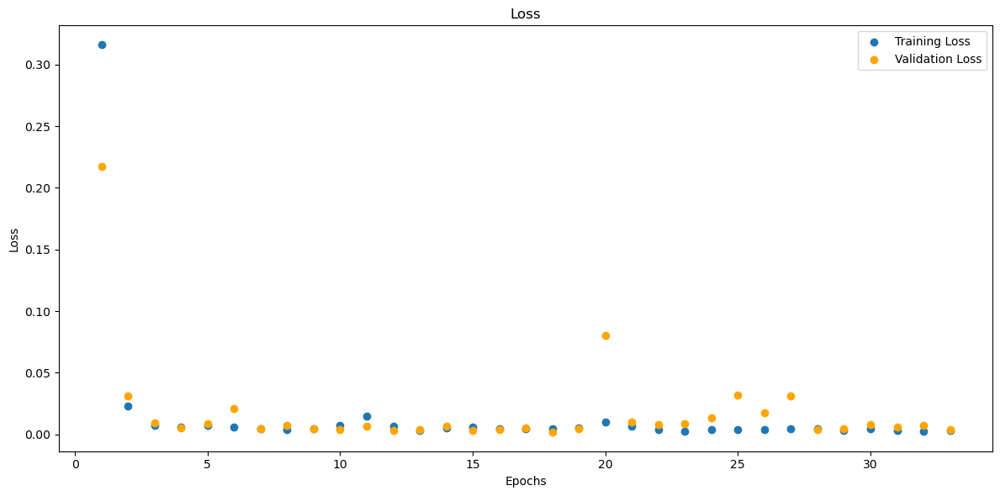

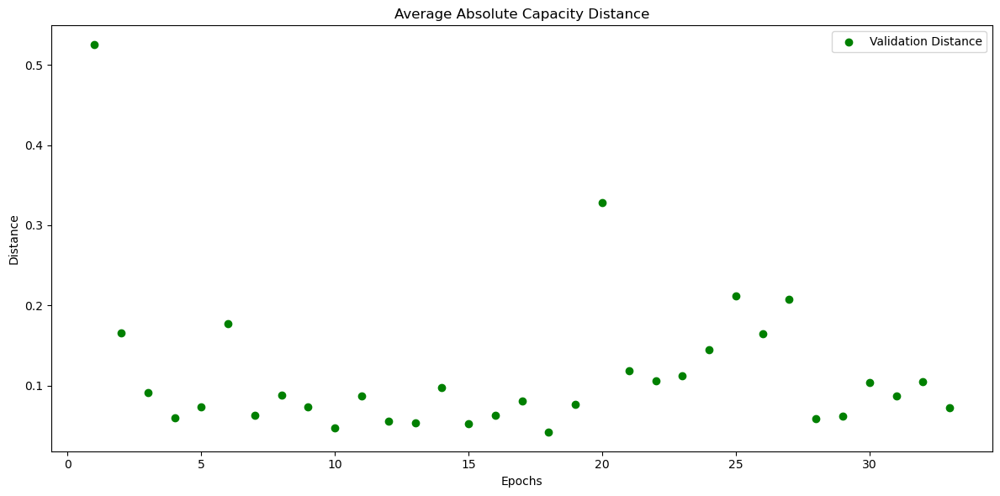

In [402]:
# B0007_discharge_rob
model_B0007_discharge_rob = CNNLSTM(input_shape=input_shape_single)
model_B0007_discharge_rob, train_losses_B0007_discharge_rob, val_losses_B0007_discharge_rob, val_distances_B0007_discharge_rob, metrics_history_B0007_discharge_rob = train(data_loaders['B0007_discharge_rob_val_loader'], data_loaders['B0007_discharge_rob_train_loader'], model_B0007_discharge_rob)
torch.save(model_B0007_discharge_rob, os.path.join(folder_name, 'model_B0007_discharge_rob.pth'))

Test Loss: 0.0073, Test Distance: 0.0990, Test Accuracy: 0.0000, SNR: 15.3675
##Metrics##:
MAE : 0.09899741411209106
MSE : 0.010545389726758003
RMSE : 0.31780675053596497
R-squared : -109.8178482055664
Count: 21


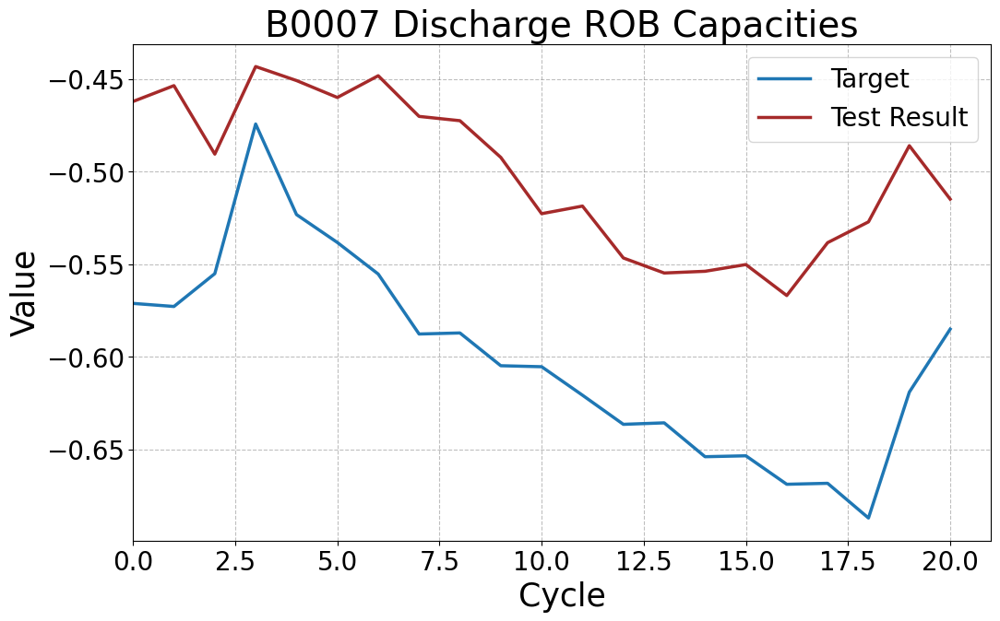

In [403]:
# B0007_discharge_rob
model_B0007_discharge_rob = torch.load('5. CNN-LSTM Models/model_B0007_discharge_rob.pth')
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_test_loader'])
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)
plot_tensors(y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob, labels=["Target", "Test Result"], title="B0007 Discharge ROB Capacities")


Test on complete dataset.

In [404]:
# Run the test on the model
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)

# # Assuming scaler_y_discharge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_target_B0007_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_testresult_B0007_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_discharge_rob = torch.tensor(original_y_target_B0007_discharge_rob)
# original_y_testresult_B0007_discharge_rob = torch.tensor(original_y_testresult_B0007_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0034, Test Distance: 0.0447, Test Accuracy: 16.0000, SNR: 18.6558
##Metrics##:
MAE : 0.044716306030750275
MSE : 0.0034476090222597122
RMSE : 0.21778900921344757
R-squared : -233.4988555908203
Count: 150


SOH Plot.

In [405]:
# plot_soh(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_rob")

Model 24 - B0007 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.2890, Validation Loss: 0.1693
Validation Distance: 0.4293, Validation Accuracy: 0.0000, SNR: -11.6388
##Metrics##:
MAE : 0.3219413459300995
MSE : 0.13859032094478607
RMSE : 0.5674343109130859
R-squared : -3935.745361328125
Count: 28
Epoch 2/120, Training Loss: 0.0219, Validation Loss: 0.0044
Validation Distance: 0.0612, Validation Accuracy: 0.0000, SNR: 5.0851
##Metrics##:
MAE : 0.045865774154663086
MSE : 0.002904528519138694
RMSE : 0.21470068395137787
R-squared : -89.66187286376953
Count: 28
Epoch 3/120, Training Loss: 0.0070, Validation Loss: 0.0184
Validation Distance: 0.1263, Validation Accuracy: 0.0000, SNR: -1.5077
##Metrics##:
MAE : 0.0947001650929451
MSE : 0.012030383571982384
RMSE : 0.30787646770477295
R-squared : -357.49029541015625
Count: 28
Epoch 4/120, Training Loss: 0.0055, Validation Loss: 0.0033
Validation Distance: 0.0141, Validation Accuracy: 9.5238, SNR: 5.5119
##Metrics##:
MAE : 0.010608755983412266
MSE : 0.00018702934903558344
RMSE : 0

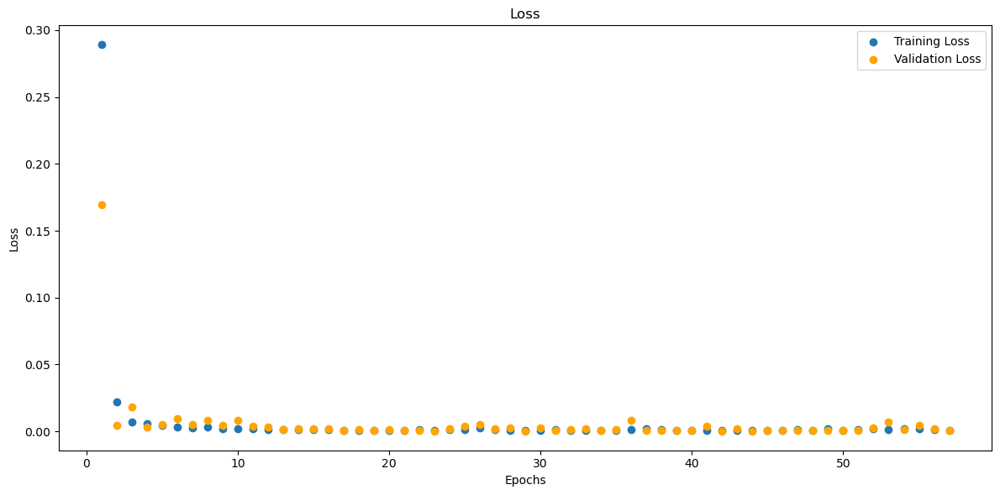

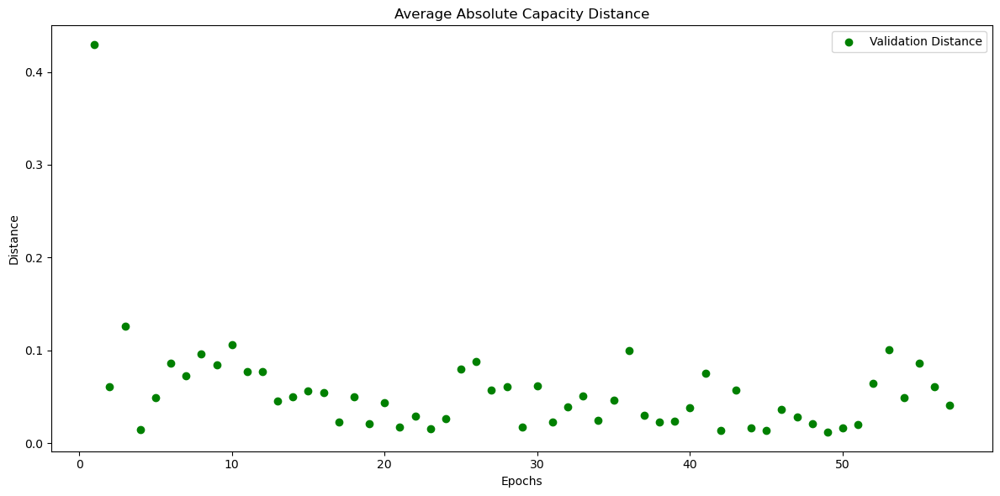

In [357]:
# B0007_combined_mm
model_B0007_combined_mm = CNNLSTM(input_shape=input_shape_combined)
model_B0007_combined_mm, train_losses_B0007_combined_mm, val_losses_B0007_combined_mm, val_distances_B0007_combined_mm, metrics_history_B0007_combined_mm = train(data_loaders['B0007_combined_mm_val_loader'], data_loaders['B0007_combined_mm_train_loader'], model_B0007_combined_mm)
torch.save(model_B0007_combined_mm, os.path.join(folder_name, 'model_B0007_combined_mm.pth'))

Test Loss: 0.0013, Test Distance: 0.0281, Test Accuracy: 0.0000, SNR: 5.5633
##Metrics##:
MAE : 0.028063984587788582
MSE : 0.0011702427873387933
RMSE : 0.17721697688102722
R-squared : -29.897682189941406
Count: 21


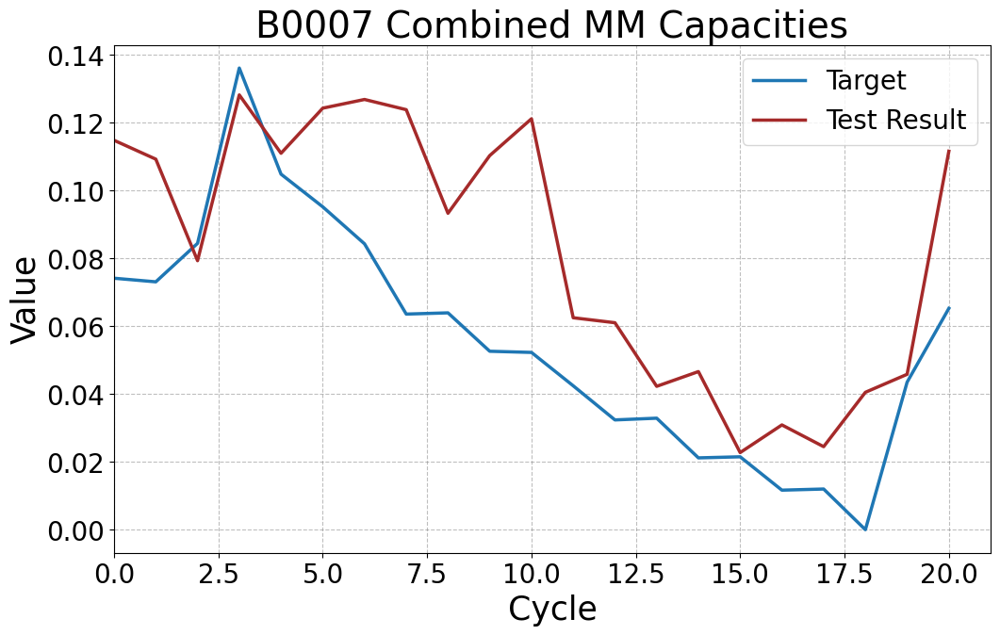

In [358]:
# B0007_combined_mm
model_B0007_combined_mm = torch.load('5. CNN-LSTM Models/model_B0007_combined_mm.pth')
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_test_loader'])
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)
plot_tensors(y_target_B0007_combined_mm, y_testresult_B0007_combined_mm, labels=["Target", "Test Result"], title="B0007 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0009, Test Distance: 0.0222, Test Accuracy: 26.6667, SNR: 26.5847
##Metrics##:
MAE : 0.022219251841306686
MSE : 0.0007375858840532601
RMSE : 0.15523181855678558
R-squared : -95.90166473388672
Count: 150


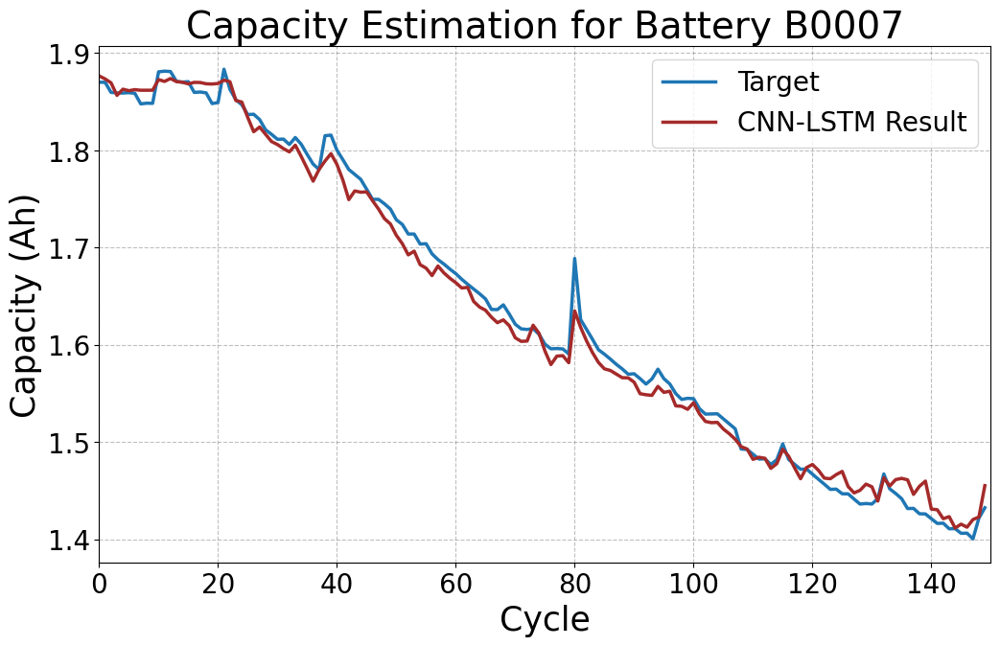

In [359]:
# Run the test on the model
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_target_B0007_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_testresult_B0007_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_mm = torch.tensor(original_y_target_B0007_combined_mm)
original_y_testresult_B0007_combined_mm = torch.tensor(original_y_testresult_B0007_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_mm", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


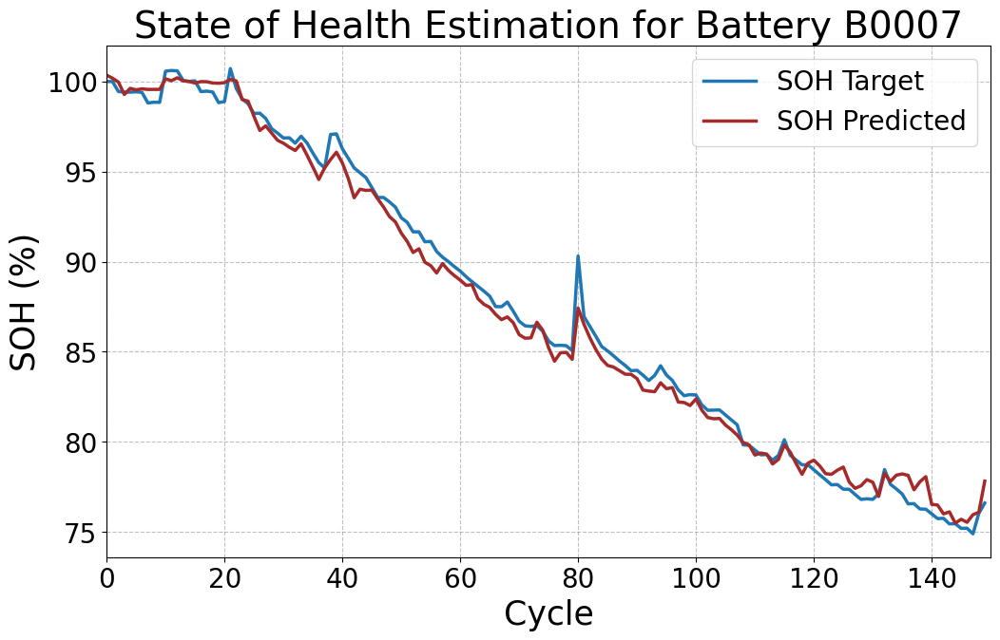

In [360]:
plot_soh(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, "State of Health Estimation for Battery B0007", file_name="B0007_combined_mm")

Model 25 - B0007 - Standard Scaler - Combined Data

Epoch 1/120, Training Loss: 0.3017, Validation Loss: 0.0550
Validation Distance: 0.2797, Validation Accuracy: 0.0000, SNR: 9.7750
##Metrics##:
MAE : 0.20980121195316315
MSE : 0.07171296328306198
RMSE : 0.45934954285621643
R-squared : -213.92808532714844
Count: 28
Epoch 2/120, Training Loss: 0.0338, Validation Loss: 0.2387
Validation Distance: 0.5770, Validation Accuracy: 0.0000, SNR: 5.6824
##Metrics##:
MAE : 0.43277254700660706
MSE : 0.2553078234195709
RMSE : 0.6581649780273438
R-squared : -758.8277587890625
Count: 28
Epoch 3/120, Training Loss: 0.0141, Validation Loss: 0.1616
Validation Distance: 0.4943, Validation Accuracy: 0.0000, SNR: 7.0799
##Metrics##:
MAE : 0.3707400858402252
MSE : 0.18878580629825592
RMSE : 0.6091849207878113
R-squared : -556.2531127929688
Count: 28
Epoch 4/120, Training Loss: 0.0111, Validation Loss: 0.1565
Validation Distance: 0.4770, Validation Accuracy: 0.0000, SNR: 7.2695
##Metrics##:
MAE : 0.3577590584754944
MSE : 0.17562325298786163
RMSE : 0.59850722551

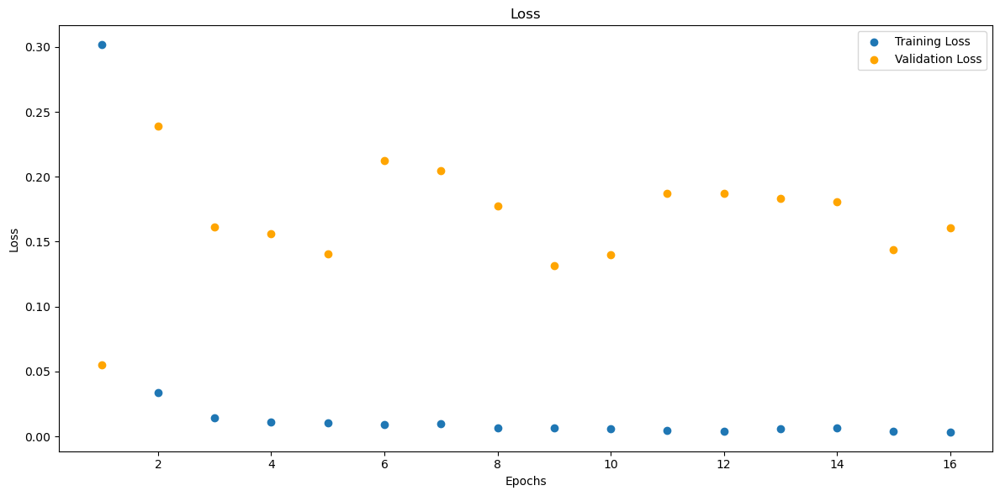

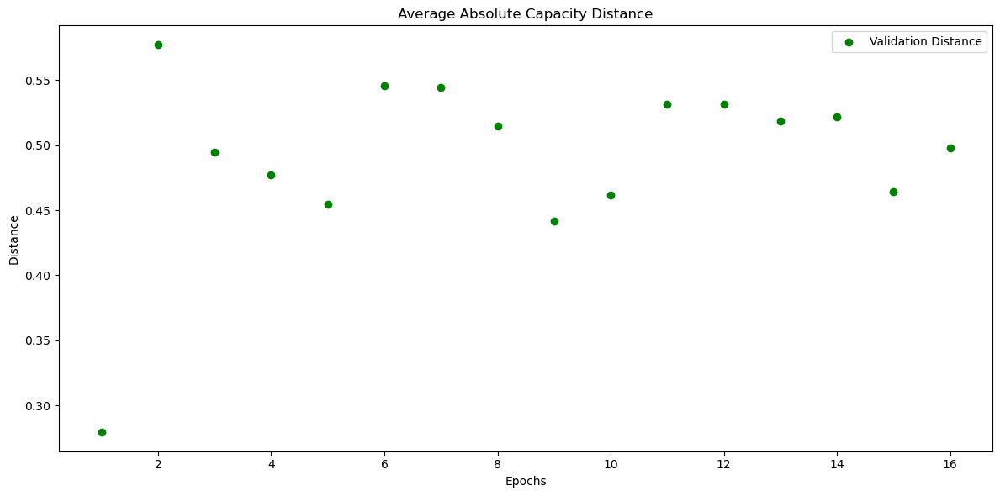

In [406]:
# B0007_combined_std
model_B0007_combined_std = CNNLSTM(input_shape=input_shape_combined)
model_B0007_combined_std, train_losses_B0007_combined_std, val_losses_B0007_combined_std, val_distances_B0007_combined_std, metrics_history_B0007_combined_std = train(data_loaders['B0007_combined_std_val_loader'], data_loaders['B0007_combined_std_train_loader'], model_B0007_combined_std)
torch.save(model_B0007_combined_std, os.path.join(folder_name, 'model_B0007_combined_std.pth'))

Test Loss: 0.2585, Test Distance: 0.5352, Test Accuracy: 0.0000, SNR: 7.9697
##Metrics##:
MAE : 0.5351680517196655
MSE : 0.29274722933769226
RMSE : 0.732548177242279
R-squared : -871.513671875
Count: 21


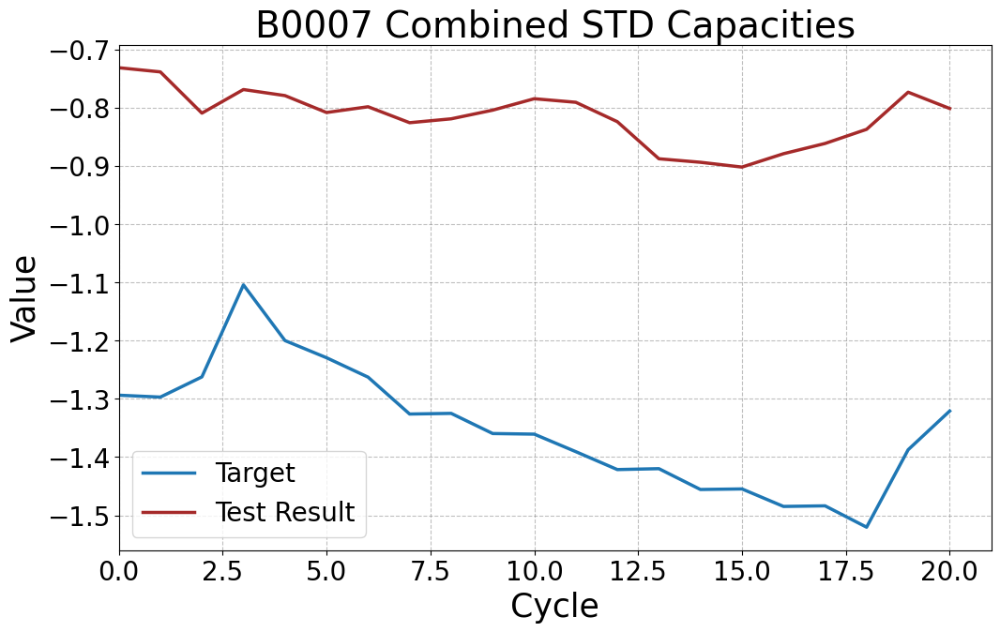

In [407]:
# B0007_combined_std
model_B0007_combined_std = torch.load('5. CNN-LSTM Models/model_B0007_combined_std.pth')
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_test_loader'])
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)
plot_tensors(y_target_B0007_combined_std, y_testresult_B0007_combined_std, labels=["Target", "Test Result"], title="B0007 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.0809, Test Distance: 0.2422, Test Accuracy: 4.0000, SNR: 10.3096
##Metrics##:
MAE : 0.242157980799675
MSE : 0.08859983086585999
RMSE : 0.49944180250167847
R-squared : -298.7425537109375
Count: 150


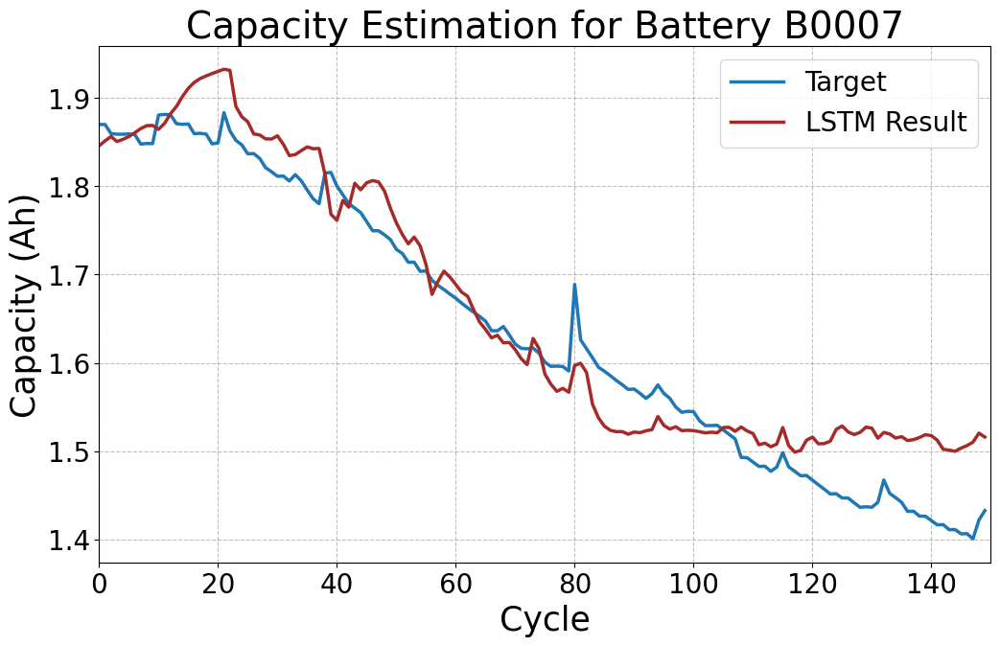

In [408]:
# Run the test on the model
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_target_B0007_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_testresult_B0007_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_std = torch.tensor(original_y_target_B0007_combined_std)
original_y_testresult_B0007_combined_std = torch.tensor(original_y_testresult_B0007_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_std", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_1152\2344070472.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


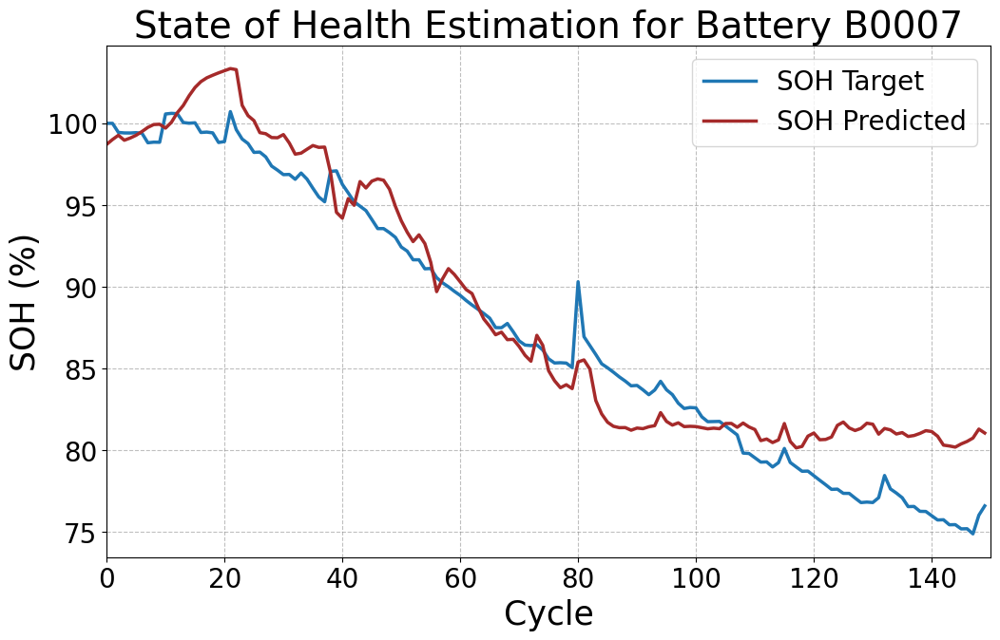

In [409]:
plot_soh(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, "State of Health Estimation for Battery B0007", file_name="B0007_combined_std")

Model 26 - B0007 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.0949, Validation Loss: 0.0177
Validation Distance: 0.1544, Validation Accuracy: 4.7619, SNR: 8.0583
##Metrics##:
MAE : 0.1157730370759964
MSE : 0.0261349119246006
RMSE : 0.3439508080482483
R-squared : -261.1371154785156
Count: 28
Epoch 2/120, Training Loss: 0.0213, Validation Loss: 0.0561
Validation Distance: 0.3006, Validation Accuracy: 0.0000, SNR: 1.7790
##Metrics##:
MAE : 0.22543694078922272
MSE : 0.0905052199959755
RMSE : 0.4757196307182312
R-squared : -958.2705078125
Count: 28
Epoch 3/120, Training Loss: 0.0081, Validation Loss: 0.0563
Validation Distance: 0.3112, Validation Accuracy: 0.0000, SNR: 2.1490
##Metrics##:
MAE : 0.23343200981616974
MSE : 0.09006204456090927
RMSE : 0.4839470684528351
R-squared : -941.2686157226562
Count: 28
Epoch 4/120, Training Loss: 0.0033, Validation Loss: 0.0331
Validation Distance: 0.2423, Validation Accuracy: 0.0000, SNR: 3.8817
##Metrics##:
MAE : 0.18175098299980164
MSE : 0.06036936491727829
RMSE : 0.4278844594955444

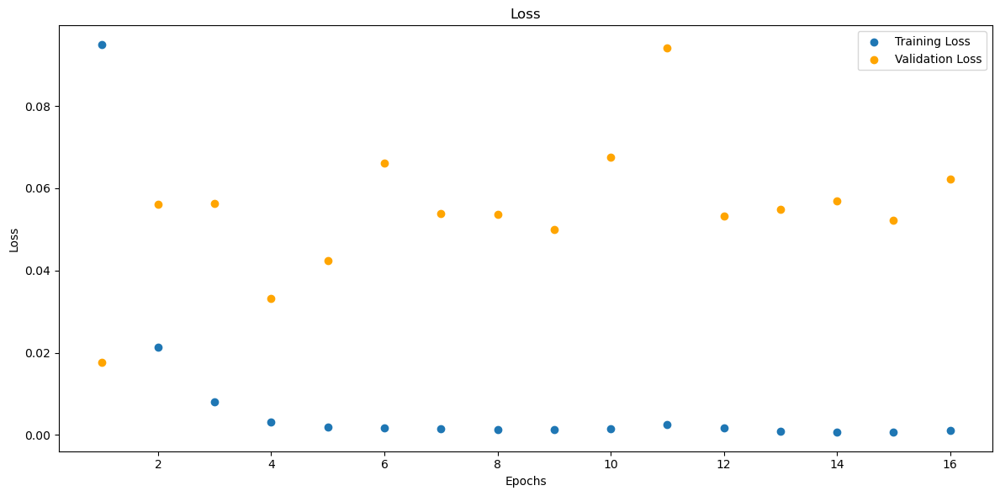

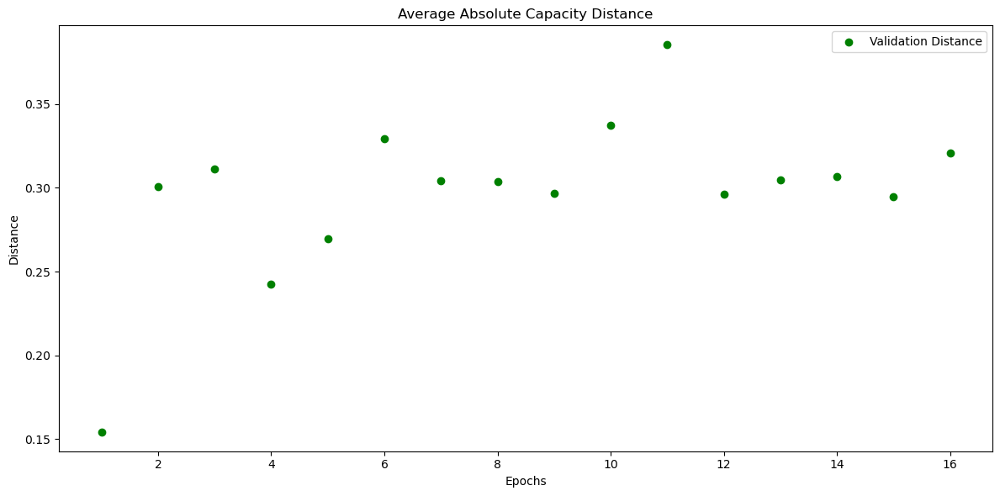

In [410]:
# B0007_combined_rob
model_B0007_combined_rob = CNNLSTM(input_shape=input_shape_combined)
model_B0007_combined_rob, train_losses_B0007_combined_rob, val_losses_B0007_combined_rob, val_distances_B0007_combined_rob, metrics_history_B0007_combined_rob = train(data_loaders['B0007_combined_rob_val_loader'], data_loaders['B0007_combined_rob_train_loader'], model_B0007_combined_rob)
torch.save(model_B0007_combined_rob, os.path.join(folder_name, 'model_B0007_combined_rob.pth'))

Test Loss: 0.1226, Test Distance: 0.3857, Test Accuracy: 0.0000, SNR: 3.7155
##Metrics##:
MAE : 0.3857216238975525
MSE : 0.15426227450370789
RMSE : 0.6223956942558289
R-squared : -1897.7509765625
Count: 21


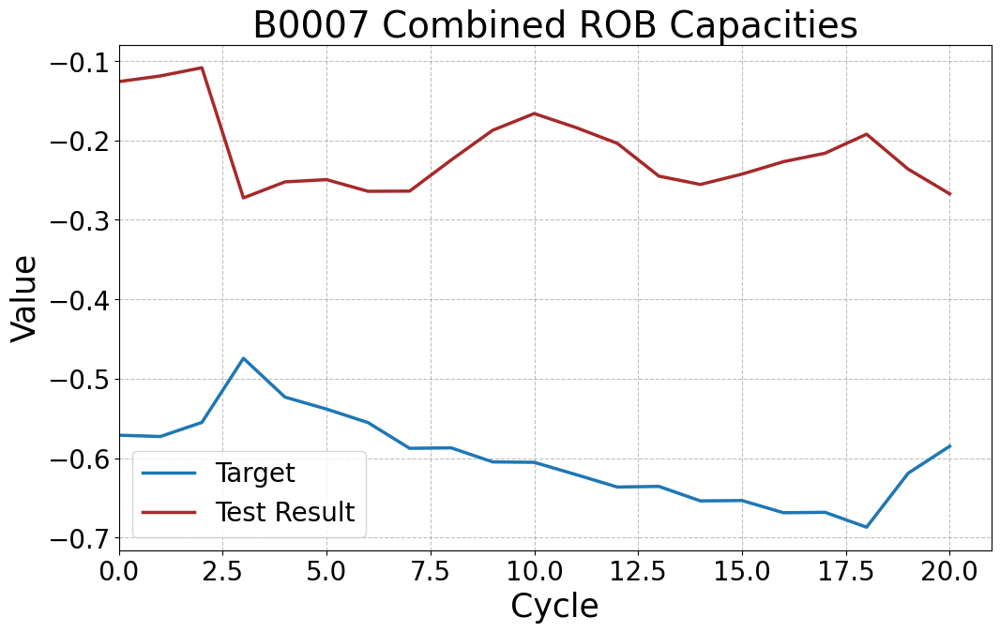

In [411]:
# B0007_combined_rob
model_B0007_combined_rob = torch.load('5. CNN-LSTM Models/model_B0007_combined_rob.pth')
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_test_loader'])
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)
plot_tensors(y_target_B0007_combined_rob, y_testresult_B0007_combined_rob, labels=["Target", "Test Result"], title="B0007 Combined ROB Capacities")


Test on complete dataset.

In [412]:
# Run the test on the model
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)

# # Assuming scaler_y_combined_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_target_B0007_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_testresult_B0007_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_combined_rob = torch.tensor(original_y_target_B0007_combined_rob)
# original_y_testresult_B0007_combined_rob = torch.tensor(original_y_testresult_B0007_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, labels=["Target", "CNN-LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_rob", ylabel="Capacity (Ah)", save_dir="13. CNN-LSTM Capacity Plots")


Test Loss: 0.0390, Test Distance: 0.1699, Test Accuracy: 6.0000, SNR: 7.5172
##Metrics##:
MAE : 0.16993936896324158
MSE : 0.04481033235788345
RMSE : 0.4172440767288208
R-squared : -3634.74462890625
Count: 150


SOH Plot.

In [413]:
# plot_soh(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, "State of Health Estimation for Battery B0007", file_name="B0007_combined_rob")

SAVE SOH DATA

In [415]:
# Ensure the arrays are 1-dimensional
b0005_target = original_y_target_B0005_combined_mm.flatten()
b0006_target = original_y_target_B0006_combined_mm.flatten()
b0007_target = original_y_target_B0007_combined_mm.flatten()

b0005_predicted_cnnlstm = original_y_testresult_B0005_combined_mm.flatten()
b0006_predicted_cnnlstm = original_y_testresult_B0006_combined_mm.flatten()
b0007_predicted_cnnlstm = original_y_testresult_B0007_combined_mm.flatten()

# Calculate SOH
b0005_C = b0005_target[0]  # max capacity
b0006_C = b0006_target[0]  # max capacity
b0007_C = b0007_target[0]  # max capacity

b0005_soh_target = (b0005_target / b0005_C) * 100
b0006_soh_target = (b0006_target / b0006_C) * 100
b0007_soh_target = (b0007_target / b0007_C) * 100

b0005_soh_predicted_cnnlstm = (b0005_predicted_cnnlstm / b0005_C) * 100
b0006_soh_predicted_cnnlstm = (b0006_predicted_cnnlstm / b0006_C) * 100
b0007_soh_predicted_cnnlstm = (b0007_predicted_cnnlstm / b0007_C) * 100

save_dir = "15. Results"

# Create the directory if it doesn't exist
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Save the tensors to the specified directory
torch.save(b0005_soh_target, os.path.join(save_dir, 'b0005_soh_target.pt'))
torch.save(b0005_soh_predicted_cnnlstm, os.path.join(save_dir, 'b0005_soh_predicted_cnnlstm.pt'))
torch.save(b0006_soh_predicted_cnnlstm, os.path.join(save_dir, 'b0006_soh_predicted_cnnlstm.pt'))
torch.save(b0007_soh_predicted_cnnlstm, os.path.join(save_dir, 'b0007_soh_predicted_cnnlstm.pt'))
